https://github.com/huggingface/datasets

In [ ]:
from google.colab import drive 
drive.mount("/content/drive/")
import pandas as pd
import os 
import re
import json
os.chdir("/content/drive/MyDrive/tesi/bleu/")
from zipfile import ZipFile
import zipfile
import statistics
from statistics import mean
import collections
from collections import Counter
from nltk.translate.bleu_score import SmoothingFunction, sentence_bleu

Mounted at /content/drive/


# **SETUP**

In [ ]:
! pip install pingouin 

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 198.6/198.6 kB 6.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for littleutils: filename=littleutils-0.2.2-py3-none-any.whl size=7048 sha256=104574c145ad651d6ccbf9a4187dce44191a48411665e8d24a07f7a6ce9488c1
  Stored in directory: /root/.cache/pip/wheels/04/bb/0d/2d02ec45f29c48d6192476bfb59c5a0e64b605e7212374dd15
Successfully built littleutils


In [ ]:
!pip install sacremoses

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 880.6/880.6 kB 13.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for sacremoses: filename=sacremoses-0.0.53-py3-none-any.whl size=895259 sha256=83ce604d099eb8f48e74fc71a9d12dea64bfb7952b6dd209a2c37c6957c8a94b
  Stored in directory: /root/.cache/pip/wheels/12/1c/3d/46cf06718d63a32ff798a89594b61e7f345ab6b36d909ce033
Successfully built sacremoses


In [ ]:
!pip install sacrebleu
import sacrebleu

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 118.9/118.9 kB 4.7 MB/s eta 0:00:00


In [ ]:
!pip install transformers

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.0/7.0 MB 53.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 200.1/200.1 kB 19.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 93.1 MB/s eta 0:00:00


In [ ]:
!pip install -U sentence-transformers
from sentence_transformers import SentenceTransformer, util
from transformers import pipeline


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.0/86.0 kB 2.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 21.1 MB/s eta 0:00:00
  Created wheel for sentence-transformers: filename=sentence_transformers-2.2.2-py3-none-any.whl size=125942 sha256=7216ec01fdd5f01f9dcbaa2b861e9ae07a1cf3cd21c5f2fb5003474c57d4371c
  Stored in directory: /root/.cache/pip/wheels/71/67/06/162a3760c40d74dd40bc855d527008d26341c2b0ecf3e8e11f
Successfully built sentence-transformers


In [ ]:
from sentence_transformers import SentenceTransformer
model_ = SentenceTransformer('bert-base-nli-mean-tokens')

In [ ]:
!pip install --upgrade bleu
import bleu
from bleu import list_bleu

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
  Created wheel for bleu: filename=bleu-0.3-py3-none-any.whl size=5799 sha256=93bd96726866ca78abc247b084b21a9ce3a9aeefcbf01afb0ffec628c495e58d
  Stored in directory: /root/.cache/pip/wheels/78/bf/47/ded78149e63219f4666fba6ffc55697b8db6282c87d6370a7e
  Created wheel for efficiency: filename=efficiency-1.1-py3-none-any.whl size=22157 sha256=6604a011230dfea9ffcdf33430beac04140666bea9ebb427b7b7bc31258e59c4
  Stored in directory: /root/.cache/pip/wheels/b1/46/0d/82133b0346045c28acaa24d9e2def1044e92441ffaae95f252
Successfully built bleu efficiency


In [ ]:
from nltk.translate.bleu_score import sentence_bleu

def compute_scar_score(list_):

  bleu = []
  scar = []
  cc = SmoothingFunction()

  for i, l_ in enumerate(list_):

    reference = list_[i][0]

    translation = list_[i][1]

    bleu_score = sentence_bleu(reference, translation, weights=(0.5, 0.5, 0, 0),smoothing_function= cc.method3)
    
    bleu.append(round(bleu_score, 2))

    
  return mean(bleu) , bleu 


In [ ]:
import statistics
from statistics import mean

def compute_similarity(list_):

  similarity = []
  for l_ in list_:
    sentence_embeddings = model_.encode(l_)
    similarity.append(round(util.pytorch_cos_sim(sentence_embeddings[0], sentence_embeddings[1]).item(), 2))


  return mean(similarity), similarity 

# **METRICS VERIFICATION**

In [ ]:
reference = ["i'm on my way to university"]
translation = "i'm coming to university"
sentence_bleu(reference, translation)

0.6053130907143028

In [ ]:
reference = ["i'm on my way to university"]
translation = "i'm on my way to university"
sentence_bleu(reference, translation)

1.0

In [ ]:
reference = ["presumably"]
translation = "probably"
sentence_bleu(reference, translation)

0.3201911827891037

In [ ]:
reference = ["1234567"]
translation = "1234"
sentence_bleu(reference, translation)

0.4723665527410147

In [ ]:
from nltk.translate.bleu_score import SmoothingFunction, sentence_bleu
bleu = sentence_bleu
ref = "let it go".split()
hyp = "let go it".split()
cc = SmoothingFunction()
bleu([ref], hyp, smoothing_function=cc.method3)



0.2973017787506803

In [ ]:
s = "the commission has received an application for a new exporter review pursuant to article 11 of the basic regulation "
b = 'the Commission received an application for a review of a new exporter pursuant to Article 11 of the basic Regulation.'

direct = "Questo significa che il documento è solo per uso interno"
human = "ciò significa che il documento è esclusivamente per uso interno"

In [ ]:
human_translation = ['within that overrun  greece  italy and portugal have overrun their threshold ']
machine_translation = "within this Greece Greece italia and portugal have exceeded their threshold"

print("The correspondent BLEU score is equal to:", round(sentence_bleu(human_translation, machine_translation), 2))

The correspondent BLEU score is equal to: 0.64


In [ ]:
human_translation = ['nell ambito di tale superamento è stato rilevato un superamento dei limiti relativi alla grecia  all italia e al portogallo ']
machine_translation =  "all'interno di tale greece greece italia e portugal hanno superato la loro soglia"

print("The correspondent BLEU score is equal to:", round(sentence_bleu(human_translation, machine_translation), 2))

The correspondent BLEU score is equal to: 0.3


In [ ]:
human_translation = ["the commission has received an application for a new exporter review pursuant to article 11 of the basic regulation "]
machine_translation = "the Commission received an application for a review of a new exporter pursuant to Article 11 of the basic Regulation."

print("The correspondent BLEU score is equal to:", round(sentence_bleu(human_translation, machine_translation), 2))

The correspondent BLEU score is equal to: 0.87


In [ ]:
reference_and_back_translation = ["the commission has received an application for a new exporter review pursuant to article 11 of the basic regulation ",
                                  "the Commission received an application for a review of a new exporter pursuant to Article 11 of the basic Regulation."]
sentence_embeddings = model_.encode(reference_and_back_translation)
print("The correspondentCosine Similarity score is equal to:", round(util.pytorch_cos_sim(sentence_embeddings[0], sentence_embeddings[1]).item(), 2))

The correspondentCosine Similarity score is equal to: 0.98


In [ ]:
reference_and_back_translation = ['nell ambito di tale superamento è stato rilevato un superamento dei limiti relativi alla grecia  all italia e al portogallo ',
                                  "all'interno di tale greece greece italia e portugal hanno superato la loro soglia"]
sentence_embeddings = model_.encode(reference_and_back_translation)
print("The correspondentCosine Similarity score is equal to:", round(util.pytorch_cos_sim(sentence_embeddings[0], sentence_embeddings[1]).item(), 2))

The correspondentCosine Similarity score is equal to: 0.67


In [ ]:
reference_and_back_translation = ['within that overrun  greece  italy and portugal have overrun their threshold ',
                                  "within this Greece Greece italia and portugal have exceeded their threshold"]
sentence_embeddings = model_.encode(reference_and_back_translation)
print("The correspondentCosine Similarity score is equal to:", round(util.pytorch_cos_sim(sentence_embeddings[0], sentence_embeddings[1]).item(), 2))

The correspondentCosine Similarity score is equal to: 0.61


In [ ]:

human_translation = ['il glifosato formulato standard contiene 360 grammi/litro di glifosato.']
machine_translation = "la tipica forma standard di dispersore formulato contiene 360 grammi/litro di dispersore."

print("The correspondent BLEU score is equal to:", round(sentence_bleu(human_translation, machine_translation), 2))

reference_and_back_translation = ['il glifosato formulato standard contiene 360 grammi/litro di glifosato.',
                                  "la tipica forma standard di dispersore formulato contiene 360 grammi/litro di dispersore."]
sentence_embeddings = model_.encode(reference_and_back_translation)
print("The correspondentCosine Similarity score is equal to:", round(util.pytorch_cos_sim(sentence_embeddings[0], sentence_embeddings[1]).item(), 2))

The corresponding BLEU score is equal to: 0.56
The corresponding BAF score is equal to: 0.96


In [ ]:

source_sentence = ['the typical standard form of formulated glyphosate contains 360 grams/litre of glyphosate.']
back_translation = "the typical standard form of formulated spacer contains 360 grams/litre of spacer."

print("The correspondent BLEU score is equal to:", round(sentence_bleu(source_sentence, back_translation), 2))

source_vs_back_translation = ['the typical standard form of formulated glyphosate contains 360 grams/litre of glyphosate.',
                                  "the typical standard form of formulated spacer contains 360 grams/litre of spacer."]
sentence_embeddings = model_.encode(source_vs_back_translation)
print("The correspondent Cosine Similarity score is equal to:", round(util.pytorch_cos_sim(sentence_embeddings[0], sentence_embeddings[1]).item(), 2))



The correspondent BLEU score is equal to: 0.77
The correspondent Cosine Similarity score is equal to: 0.9


# **EXPERIMENT: DATA PROCESSING AND TRANSLATION**

**https://huggingface.co/docs/transformers/main_classes/pipelines#transformers.TranslationPipeline**

In [ ]:
import glob

def translations( path):    #TAKES A PATH TO FILE AS ARGUMRNT,  

  """ it takes a path as argument. a multilanguage transaltion model (Helsinki-NLP/opus-mt-) is used to translate between 
  pairs of human-translated languages (like EN-ES). it  returns bleu and cosine similarity metrics metrics. """
  
  archive = ZipFile(path)
  pairs = archive.read(archive.namelist()[0]).decode("utf-8-sig").split("\n")[10: 9000]
  data_dict  =  {key: {"original":i.split("\t")[0].lower(), "translated" : i.split("\t")[1].lower()} for key, i in enumerate(pairs) if len(i.split("\t")[0].split()) <= 20 and len(i.split("\t")[0].split()) > 7} # and len(i.split("\t")[0].split()) > 2}
  
  lang_id = path.split("/")[-1][0:5]                                              # language id 


  dataframe = pd.DataFrame(data_dict).T                                     #create a dataframe 

  dataframe = dataframe.dropna(axis = 0, how ='any')                             #drop non assigned values 


  originals = [sent.lower().replace("\xa0", "") for sent in dataframe["original"] ]               #filter original sentences 
  human_translation =  [sent.lower().replace("\xa0", "") for sent in dataframe["translated"]]    # filter human translated sentences

  originals = [re.sub("\(.*\)|\s-\s.*", "", sent) for sent in originals ]               #remove what is within parenthesis 
  human_translation =  [re.sub("\(.*\)|\s-\s.*", "", sent) for sent in human_translation] 

  originals = [re.sub("\W", " ", sent) for sent in originals ]    

  human_translation =  [re.sub("\W", " ", sent) for sent in human_translation]

  data_dict_  =  {"original": [sent for sent in originals], "translated" : [sent for sent in human_translation]}

  dataframe_ = pd.DataFrame(data_dict_).drop_duplicates(subset=['original', 'translated'])

  # dataframe_.drop_duplicates(subset=['translated'])

  originals = [sent for sent in dataframe_["original"] ]  

  human_translation = [sent for sent in dataframe_["translated"] ]  

  # return (len(dataframe["original"]))
 
  
  #direct translator "Helsinki-NLP/opus-mt-en-lang_id"
  direct_translator = pipeline("translation_en_to_"+ lang_id[3:].lower(), model="Helsinki-NLP/opus-mt-en-"+ lang_id[3:].lower())

  #back translator ""Helsinki-NLP/opus-mt-lang_id-en""
  back_translator = pipeline("translation_"+lang_id[3:].lower()+"_to_en", model="Helsinki-NLP/opus-mt-" + lang_id[3:].lower() +"-en")

  # translate original sentences 
    
  direct_translation = [direct_translator(text, max_length=400)[0]['translation_text'] for text in originals]

  #back translate the translated outcome 

  back_translation = [back_translator(text, max_length=400)[0]['translation_text'] for text in direct_translation]
 

  return  (lang_id, originals), (lang_id, human_translation), (lang_id, direct_translation), (lang_id, back_translation)

In [ ]:
directory = "/content/drive/MyDrive/tesi/bleu/datasets/"
data_ = [file_ for file_ in glob.iglob(f'{directory}/*.zip')]

original_sentences = []

reference_translation = []

direct_translation = [] 

back_translation = []

for file_ in data_:

  original, reference, direct_tr, back_tr = translations(file_)

  original_sentences.append(original)   

  reference_translation.append(reference)

  direct_translation.append(direct_tr)

  back_translation.append(back_tr)

In [ ]:
len(original_sentences[0][1]) == len(reference_translation[0][1])

True

In [ ]:
original_sentences

[('EN-IT',
  ['this regulation shall enter into force on 16 october 2004 ',
   'this regulation shall be binding in its entirety and directly applicable in all member states ',
   'regulation as last amended by commission regulation  ',
   'regulation as last amended by regulation  ',
   'in the light of the tenders received  a minimum selling price should be fixed ',
   'in the light of the tenders received  a minimum selling price should be fixed ',
   'based on this information  it has been established that the community processing threshold has been overrun by 100380 tonnes ',
   'within that overrun  greece  italy and portugal have overrun their threshold ',
   'based on this information  it has been established that the community processing threshold has been overrun by 380 tonnes ',
   'within that overrun  greece and spain have overrun their thresholds ',
   'regulation as last amended by the act of accession of 2003 ',
   'the commission has received an application for a  new 

In [ ]:
reference_translation

[('EN-IT',
  ['il presente regolamento entra in vigore il 16 ottobre 2004 ',
   'il presente regolamento è obbligatorio in tutti i suoi elementi e direttamente applicabile in ciascuno degli stati membri ',
   'regolamento modificato da ultimo dal regolamento  ',
   'regolamento modificato da ultimo dal regolamento  ',
   'tenendo conto delle offerte ricevute  occorre fissare un prezzo minimo di vendita ',
   'alla luce delle offerte ricevute occorre fissare un prezzo minimo di vendita ',
   'in base a tali dati  è stato constatato un superamento di 100380 tonnellate del limite comunitario di trasformazione ',
   'nell ambito di tale superamento è stato rilevato un superamento dei limiti relativi alla grecia  all italia e al portogallo ',
   'in base a tali dati  è stato constatato un superamento di 380 tonnellate del limite comunitario di trasformazione ',
   'nell ambito di tale superamento è stato rilevato un superamento dei limiti relativi alla grecia e alla spagna ',
   'regolament

In [ ]:
back_translation

[('EN-IT',
  ['This Regulation shall enter into force on 16 October 2004.',
   'This Regulation shall be binding in its entirety and directly applicable in all Member States.',
   'Regulation as last amended by Commission Regulation',
   'Regulation as last amended by Regulation',
   'In the light of the tenders received, a minimum selling price should be fixed.',
   'In the light of the tenders received, a minimum selling price should be fixed.',
   'On the basis of this information, it has been established that the Community processing threshold has been exceeded by 100380 tonnes.',
   'within this Greece Greece italia and portugal have exceeded their threshold',
   'On the basis of this information, it has been established that the Community processing threshold has been exceeded by 380 tonnes.',
   'within this Greece of overcoming and spain have exceeded their limits',
   'Regulation as last amended by the 2003 Act of Accession',
   'The Commission received an application for a re

In [ ]:
direct_translation

[('EN-IT',
  ['il presente regolamento entra in vigore il 16 ottobre 2004',
   'Il presente regolamento è obbligatorio in tutti i suoi elementi e direttamente applicabile in ciascuno degli Stati membri.',
   'regolamento modificato da ultimo dal regolamento della Commissione',
   'regolamento modificato da ultimo dal regolamento',
   'Tenuto conto delle offerte ricevute, occorre fissare un prezzo minimo di vendita',
   'Tenuto conto delle offerte ricevute, occorre fissare un prezzo minimo di vendita',
   'Sulla base di tali informazioni è stato accertato che la soglia comunitaria di trasformazione è stata superata di 100380 tonnellate',
   "all'interno di tale greece greece italia e portugal hanno superato la loro soglia",
   'Sulla base di tali informazioni è stato accertato che la soglia comunitaria di trasformazione è stata superata di 380 tonnellate',
   "all'interno di tale greece di superamento e spagna hanno superato i loro limiti",
   "regolamento modificato da ultimo dall'atto

# **METRICS COMPUTATION**

In [ ]:
original_sentences= open("/content/drive/MyDrive/tesi/bleu/original_sentences.txt","r").read().split("---")[1:]
original_sentences

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
len(original_sentences)

14

In [ ]:
originals_ = [st_.split("\n")[:-1] for st_ in original_sentences]
lang_ids = [id[0][:5] for i, id in enumerate(originals_) ] 
lang_ids

['EN-IT',
 'EN-ES',
 'EN-DA',
 'EN-CS',
 'EN-DE',
 'EN-FI',
 'EN-ET',
 'EN-GA',
 'EN-FR',
 'EN-HU',
 'EN-MT',
 'EN-SK',
 'EN-SV',
 'EN-NL']

In [ ]:
originals_ = [st_.split("\n")[:-1][1:] for st_ in original_sentences]
originals_[3]

['this regulation shall enter into force on 16 october 2004 ',
 'this regulation shall be binding in its entirety and directly applicable in all member states ',
 'regulation as last amended by commission regulation  ',
 'regulation as last amended by regulation  ',
 'this regulation shall be binding in its entirety and directly applicable in all member states ',
 'regulation as last amended by commission regulation  ',
 'regulation as last amended by regulation  ',
 'regulation as last amended by commission regulation  ',
 'in the light of the tenders received  a minimum selling price should be fixed ',
 'this regulation shall enter into force on 16 october 2004 ',
 'regulation as last amended by commission regulation  ',
 'regulation as last amended by regulation  ',
 'based on this information  it has been established that the community processing threshold has been overrun by 100380 tonnes ',
 'within that overrun  greece  italy and portugal have overrun their threshold ',
 'based 

In [ ]:
import glob
from pprint import pprint
directory = "/content/drive/MyDrive/tesi/bleu"
data_ = [file_ for file_ in glob.iglob(f'{directory}/*.txt')]

pprint(data_)

for file_ in data_:
  original_stc = open(data_[0],"r").read().split("---")[1:]
  human_translation = open(data_[1],"r").read().split("---")[1:]
  direct_tr = open(data_[2],"r").read().split("---")[1:]
  back_tr = open(data_[3],"r").read().split("---")[1:]

originals_ = [st_.split("\n")[:-1] for st_ in original_stc]
lang_ids = [id[0][:5] for i, id in enumerate(originals_) ] 

print(lang_ids)

original_sentences = [st_.split("\n")[:-1][1:] for st_ in original_stc ]
print(len(original_sentences))

reference_translation = [st_.split("\n")[:-1][1:] for st_ in human_translation ]
print(len(reference_translation))

direct_translation  = [st_.split("\n")[:-1][1:] for st_ in direct_tr ]
print(len(direct_translation))

back_translation = [st_.split("\n")[:-1][1:] for st_ in back_tr ]
print(len(back_translation ))


['/content/drive/MyDrive/tesi/bleu/original_sentences.txt',
 '/content/drive/MyDrive/tesi/bleu/reference_translation.txt',
 '/content/drive/MyDrive/tesi/bleu/direct_translation.txt',
 '/content/drive/MyDrive/tesi/bleu/back_translation.txt']
['EN-IT', 'EN-ES', 'EN-DA', 'EN-CS', 'EN-DE', 'EN-FI', 'EN-ET', 'EN-GA', 'EN-FR', 'EN-HU', 'EN-MT', 'EN-SK', 'EN-SV', 'EN-NL']
14
14
14
14


In [ ]:
for i, sent in enumerate(reference_translation[1
                                    ]):
  if len(sent) == 0:
    print(i, sent)

1189 


In [ ]:
reference_translation[1][1189 ]

''

In [ ]:
originals_[1][1189]

'in slovenia  an appeal to the  vrhovno sodišče republike slovenije   '

In [ ]:
originals_[1][294]

'notification by member state in accordance with article 3 of regulation  no 1847 2004'

In [ ]:
back_translation[1][293]

'notification by the Member State in accordance with Article 3 of Regulation No 1847 2004'

In [ ]:
for i, sent in enumerate(reference_translation[1
                                    ]):
  if len(sent) == 0:
    print(i, sent)

1189 


In [ ]:
reference_translation[1][1189]

''

In [ ]:
reference_translation[1][292]

'comunicación del estado miembro con arreglo al artículo 3 del reglamento  no 1847 2004'

In [ ]:
direct_translation[1][1189]

'- No, no, no, no, no, no, no, no, no, no, no, no, no, no, no, no, no, no, no, no, no, no, no, no, no, no, no, no, no, no, no, no, no, no, no, no, no.'

In [ ]:
original_vs_back_translation= [[list_1, list_2] for list_1, list_2 in zip(original_sentences, back_translation)]


original_vs_back_cosim = []
for i, list_ in enumerate(original_vs_back_translation):
  original = original_vs_back_translation[i][0]
  back_ = original_vs_back_translation[i][1]

  x = [[sent1, sent2] for sent1, sent2 in zip( original, back_)]

  original_vs_back_cosim.append(x)

In [ ]:
original_vs_back_cosim[0][3]

['in the light of the tenders received  a minimum selling price should be fixed ',
 'In the light of the tenders received, a minimum selling price should be fixed.']

In [ ]:



original_vs_back_bleu = []
for i, list_ in enumerate(original_vs_back_translation):
  original_ = original_vs_back_translation[i][0]
  back = original_vs_back_translation[i][1]

  y = [[[sent1], sent2] for sent1, sent2 in zip( original_, back)]

  original_vs_back_bleu.append(y)

In [ ]:
original_vs_back_cosim[0][6]

['within that overrun  greece  italy and portugal have overrun their threshold ',
 'within this Greece Greece italia and portugal have exceeded their threshold']

In [ ]:
len(original_vs_back_cosim) == len(original_vs_back_bleu)

True

In [ ]:
machine_vs_human_translation= [[list_1, list_2] for list_1, list_2 in zip(reference_translation, direct_translation)]

machine_vs_human_cosim = []
for i, list_ in enumerate(machine_vs_human_translation):
  human_t = machine_vs_human_translation[i][0]
  machine_t = machine_vs_human_translation[i][1]

  x = [[sent1, sent2] for sent1, sent2 in zip( human_t, machine_t)]

  machine_vs_human_cosim.append(x)

In [ ]:
machine_vs_human_cosim[0][6]

['nell ambito di tale superamento è stato rilevato un superamento dei limiti relativi alla grecia  all italia e al portogallo ',
 "all'interno di tale greece greece italia e portugal hanno superato la loro soglia"]

In [ ]:

machine_vs_human_bleu = []
for i, list_ in enumerate(machine_vs_human_translation):
  human_tr = machine_vs_human_translation[i][0]
  machine_tr = machine_vs_human_translation[i][1]

  y = [[[sent1], sent2] for sent1, sent2 in zip( human_tr, machine_tr)]

  machine_vs_human_bleu.append(y)

In [ ]:
len(machine_vs_human_bleu)

14

In [ ]:
len(machine_vs_human_bleu) == len(machine_vs_human_cosim)

True

In [ ]:
machine_vs_human_bleu[1]

[[['el presente reglamento será obligatorio en todos sus elementos y directamente aplicable en cada estado miembro '],
  'El presente Reglamento será obligatorio en todos sus elementos y directamente aplicable en cada Estado miembro.'],
 [['visto el tratado constitutivo de la comunidad europea '],
  'Visto el Tratado constitutivo de la Comunidad Europea,'],
 [['el o los importes de las garantías de transformación se deben fijar teniendo todo ello en cuenta '],
  'el importe de las garantías de transformación debe fijarse en consecuencia'],
 [['habida cuenta de las ofertas recibidas  debe fijarse un precio mínimo de venta '],
  'Habida cuenta de las ofertas recibidas, debe fijarse un precio mínimo de venta'],
 [['habida cuenta de las ofertas recibidas  debe fijarse un precio mínimo de venta'],
  'Habida cuenta de las ofertas recibidas, debe fijarse un precio mínimo de venta'],
 [['según esta información  se ha comprobado un rebasamiento de 100380 toneladas del umbral de transformación c

In [ ]:
machine_vs_human_bleu[0][:15]

[[['il presente regolamento è obbligatorio in tutti i suoi elementi e direttamente applicabile in ciascuno degli stati membri '],
  'Il presente regolamento è obbligatorio in tutti i suoi elementi e direttamente applicabile in ciascuno degli Stati membri.'],
 [['regolamento modificato da ultimo dal regolamento  '],
  'regolamento modificato da ultimo dal regolamento della Commissione'],
 [['regolamento modificato da ultimo dal regolamento  '],
  'regolamento modificato da ultimo dal regolamento'],
 [['tenendo conto delle offerte ricevute  occorre fissare un prezzo minimo di vendita '],
  'Tenuto conto delle offerte ricevute, occorre fissare un prezzo minimo di vendita'],
 [['alla luce delle offerte ricevute occorre fissare un prezzo minimo di vendita '],
  'Tenuto conto delle offerte ricevute, occorre fissare un prezzo minimo di vendita'],
 [['in base a tali dati  è stato constatato un superamento di 100380 tonnellate del limite comunitario di trasformazione '],
  'Sulla base di tali i

In [ ]:
compute_scar_score(machine_vs_human_bleu[0][:4])[1]

[0.97, 0.75, 0.96, 0.92]

In [ ]:
compute_similarity(machine_vs_human_cosim[0][:4])[1]

[0.99, 0.96, 1.0, 0.99]

In [ ]:
#SL
cosim_back = [(lang_id, compute_similarity(list_)[1]) for  lang_id, list_ in zip(lang_ids , original_vs_back_cosim)]


bleu_back = [(lang_id, compute_scar_score(list_)[1]) for lang_id, list_ in zip(lang_ids , original_vs_back_bleu)]


#TL
cosim_direct = [(lang_id, compute_similarity(list_)[1]) for  lang_id, list_ in zip(lang_ids , machine_vs_human_cosim)]

bleu_direct = [(lang_id, compute_scar_score(list_)[1]) for lang_id, list_ in zip(lang_ids , machine_vs_human_bleu)]


In [ ]:
bleu_back = [(lang_id, compute_scar_score(list_)[1]) for lang_id, list_ in zip(lang_ids , original_vs_back_bleu)]

In [ ]:
bleu_back[0]

('EN-IT',
 [0.93,
  0.88,
  0.89,
  0.95,
  0.95,
  0.86,
  0.72,
  0.86,
  0.68,
  0.86,
  0.91,
  0.83,
  0.92,
  0.94,
  0.89,
  0.85,
  0.97,
  0.8,
  0.81,
  0.93,
  0.89,
  0.88,
  0.96,
  0.82,
  0.98,
  0.77,
  0.6,
  0.64,
  0.92,
  0.88,
  0.88,
  0.97,
  0.97,
  0.66,
  0.43,
  0.96,
  0.78,
  0.94,
  0.96,
  0.77,
  0.95,
  0.92,
  0.91,
  0.79,
  0.85,
  0.93,
  0.98,
  0.85,
  0.98,
  0.9,
  0.92,
  0.86,
  0.98,
  0.94,
  0.79,
  0.86,
  0.91,
  0.91,
  0.94,
  0.85,
  0.88,
  0.92,
  0.98,
  1.0,
  0.91,
  0.89,
  0.78,
  0.95,
  0.79,
  0.91,
  0.9,
  0.91,
  0.94,
  0.86,
  0.85,
  0.92,
  0.94,
  0.91,
  0.85,
  0.8,
  0.95,
  0.89,
  0.87,
  0.9,
  0.93,
  0.9,
  0.96,
  0.92,
  0.96,
  0.96,
  0.82,
  0.85,
  0.93,
  0.88,
  0.62,
  0.93,
  0.94,
  0.89,
  0.89,
  0.88,
  0.86,
  0.79,
  0.81,
  0.9,
  0.94,
  0.9,
  0.85,
  0.86,
  0.93,
  0.98,
  0.89,
  0.87,
  0.94,
  0.98,
  0.89,
  0.9,
  0.88,
  0.88,
  0.87,
  0.87,
  0.84,
  0.86,
  0.91,
  0.89,
  0.89,
 

In [ ]:
bleu_direct[0]

('EN-IT',
 [0.97,
  0.75,
  0.96,
  0.92,
  0.85,
  0.77,
  0.46,
  0.76,
  0.56,
  0.96,
  0.75,
  0.89,
  0.95,
  0.88,
  0.69,
  0.64,
  0.67,
  0.8,
  0.99,
  0.82,
  0.95,
  0.8,
  0.76,
  0.77,
  0.87,
  0.93,
  0.74,
  0.74,
  0.95,
  0.91,
  0.92,
  0.89,
  0.96,
  0.86,
  0.6,
  0.94,
  0.8,
  0.6,
  0.97,
  0.61,
  0.67,
  0.8,
  0.74,
  0.77,
  0.81,
  0.44,
  0.86,
  0.98,
  0.81,
  0.84,
  0.8,
  0.75,
  0.88,
  0.58,
  0.91,
  0.53,
  0.04,
  0.04,
  0.11,
  0.87,
  0.74,
  0.82,
  0.75,
  0.97,
  0.98,
  0.74,
  0.75,
  0.86,
  0.64,
  0.77,
  0.76,
  0.59,
  0.92,
  0.69,
  0.68,
  0.93,
  0.74,
  0.84,
  0.9,
  0.86,
  0.93,
  0.64,
  0.59,
  0.78,
  0.8,
  0.93,
  0.9,
  0.89,
  0.96,
  0.96,
  0.83,
  0.8,
  0.96,
  0.77,
  0.77,
  0.84,
  0.99,
  0.94,
  0.92,
  0.84,
  0.77,
  0.67,
  0.78,
  0.93,
  0.92,
  0.77,
  0.69,
  0.67,
  0.78,
  0.76,
  0.64,
  0.71,
  0.82,
  0.83,
  0.82,
  0.87,
  0.79,
  0.79,
  0.79,
  0.78,
  0.8,
  0.95,
  0.95,
  0.94,
  0.72,
  

In [ ]:
len(bleu_back[0][1]) == len(bleu_direct[0][1])

True

In [ ]:
len(cosim_back[0][1]) == len(cosim_direct[0][1])

True

**OUTLIERS CHECK**

**If the data doesn’t follow a normal distribution, the z-score calculation shouldn’t be used to find the outliers.**

In [ ]:
bleu_data = []



  
for i, (bleu1, bleu2) in enumerate(zip( bleu_direct, bleu_back)):

  """CREATE DATAFRAME"""
  bl_bck = bleu_back[i][1]
  bl_drt = bleu_direct[i][1]
  lang_id = bleu_direct[i][0]
  dict_ = {"bleu_direct" : [x for x in bl_drt], "bleu_back": [x for x in bl_bck] }
  data1 = pd.DataFrame(dict_)
  bleu_data.append(data1)


In [ ]:
data_it = bleu_data[0]
data_it.head()

,bleu_direct,bleu_back
0,0.97,0.93
1,0.75,0.88
2,0.96,0.89
3,0.92,0.95
4,0.85,0.95


In [ ]:
import plotly.express as px
fig = px.box(data_it, y="bleu_direct")

fig.show()

In [ ]:

def find_outliers_IQR(df):

   q1=df.quantile(0.25)

   q3=df.quantile(0.75)

   IQR= q3-q1

   outliers = df[((df<(q1-1.5*IQR)) | (df>(q3+1.5*IQR)))]

   return outliers

In [ ]:
outliers = find_outliers_IQR(data_it["bleu_direct"])
print("number of outliers: "+ str(len(outliers)))

print("max outlier value: "+ str(outliers.max()))

print("min outlier value: "+ str(outliers.min()))



number of outliers: 79
max outlier value: 0.45
min outlier value: 0.0


In [ ]:
outliers = find_outliers_IQR(data_it[["bleu_direct","bleu_back"]])
outliers

,bleu_direct,bleu_back
0,NaN,NaN
1,NaN,NaN
2,NaN,NaN
3,NaN,NaN
4,NaN,NaN
...,...,...
2160,NaN,NaN
2161,NaN,NaN
2162,NaN,NaN
2163,NaN,NaN


In [ ]:
out_ = [x for x in outliers["bleu_direct"]]
len(out_)
for i , x in enumerate(out_):
  if x < 0.45:
    print(i,x)

45 0.44
56 0.04
57 0.04
58 0.11
143 0.1
144 0.24
182 0.25
183 0.08
186 0.2
195 0.0
196 0.0
198 0.01
208 0.29
242 0.16
249 0.41
254 0.4
271 0.05
279 0.09
302 0.07
314 0.09
372 0.41
373 0.29
390 0.25
439 0.44
443 0.44
445 0.44
491 0.4
492 0.34
550 0.39
582 0.32
623 0.37
634 0.03
654 0.15
655 0.15
665 0.43
787 0.22
868 0.31
899 0.26
943 0.32
967 0.41
982 0.1
998 0.43
1053 0.35
1130 0.3
1131 0.44
1151 0.44
1196 0.0
1302 0.42
1326 0.41
1341 0.34
1352 0.4
1535 0.37
1536 0.37
1646 0.39
1742 0.09
1781 0.23
1782 0.42
1808 0.17
1810 0.43
1812 0.41
1814 0.44
1815 0.25
1816 0.1
1817 0.07
1818 0.36
1820 0.14
1838 0.36
1843 0.44
1845 0.38
1846 0.29
1863 0.3
1864 0.29
1926 0.44
1936 0.43
1963 0.36
1989 0.29
2112 0.43


In [ ]:
original_vs_back_bleu[0][45]

[['this date should be adopted in this regulation also '],
 'This date should also be adopted in this Regulation.']

In [ ]:
machine_vs_human_bleu[0][45]

[['occorre pertanto fare riferimento a tale data '],
 'Questa data dovrebbe essere adottata anche nel presente regolamento.']

In [ ]:
original_vs_back_bleu[0][143]

[[''], '- Oh, my God.']

In [ ]:
machine_vs_human_bleu[0][143]

[[' a pagina 85 '], '- Oh, mio Dio.']

In [ ]:
original_vs_back_bleu[0][195]

[['oct '], 'Oct']

In [ ]:
machine_vs_human_bleu[0][195]

[['ptom  articolo 10  paragrafo 1  lettere a  e b   del regolamento  n  638 2003 '],
 'ott']

In [ ]:
original_vs_back_bleu[0][196]

[['acp '], 'acp']

In [ ]:
machine_vs_human_bleu[0][196]

[['acp  articolo 3  paragrafo 1  del regolamento  n  638 2003 '], 'acp']

In [ ]:
original_vs_back_bleu[0][194]

[['final use of the quota for 2004 in percentage terms'],
 'final use of the quota for 2004 as a percentage']

In [ ]:
original_vs_back_bleu[0][193]

[['reduction percentages to be applied to quantities applied for under the tranche for oktober 2004 and quota use for 2004'],
 'Reduction percentages to be applied to the quantities applied for under the tranche for oktober 2004 and for the use of quotas for 2004']

In [ ]:
machine_vs_human_bleu[0][194]

[['percentuale di riduzione per il lotto del mese di ottobre 2004'],
 'utilizzazione finale del contingente per il 2004 in percentuale']

In [ ]:
original_vs_back_bleu[0][665]

[['bottle   a22  embossed tablets'], 'bottle a22 embossed tablets']

In [ ]:
machine_vs_human_bleu[0][665]

[['flacone  compresse con impresso in rilievo  a22 '],
 'flacone a22 compresse goffrate']

In [ ]:
original_vs_back_bleu[0][1196]

[[''], '- Oh, my God.']

In [ ]:
machine_vs_human_bleu[0][1196]

[[''], '- Oh, mio Dio.']

**OUTLIERS REMOVAL**

In [ ]:
bleu_direct[0]

('EN-IT',
 [0.97,
  0.75,
  0.96,
  0.92,
  0.85,
  0.77,
  0.46,
  0.76,
  0.56,
  0.96,
  0.75,
  0.89,
  0.95,
  0.88,
  0.69,
  0.64,
  0.67,
  0.8,
  0.99,
  0.82,
  0.95,
  0.8,
  0.76,
  0.77,
  0.87,
  0.93,
  0.74,
  0.74,
  0.95,
  0.91,
  0.92,
  0.89,
  0.96,
  0.86,
  0.6,
  0.94,
  0.8,
  0.6,
  0.97,
  0.61,
  0.67,
  0.8,
  0.74,
  0.77,
  0.81,
  0.44,
  0.86,
  0.98,
  0.81,
  0.84,
  0.8,
  0.75,
  0.88,
  0.58,
  0.91,
  0.53,
  0.04,
  0.04,
  0.11,
  0.87,
  0.74,
  0.82,
  0.75,
  0.97,
  0.98,
  0.74,
  0.75,
  0.86,
  0.64,
  0.77,
  0.76,
  0.59,
  0.92,
  0.69,
  0.68,
  0.93,
  0.74,
  0.84,
  0.9,
  0.86,
  0.93,
  0.64,
  0.59,
  0.78,
  0.8,
  0.93,
  0.9,
  0.89,
  0.96,
  0.96,
  0.83,
  0.8,
  0.96,
  0.77,
  0.77,
  0.84,
  0.99,
  0.94,
  0.92,
  0.84,
  0.77,
  0.67,
  0.78,
  0.93,
  0.92,
  0.77,
  0.69,
  0.67,
  0.78,
  0.76,
  0.64,
  0.71,
  0.82,
  0.83,
  0.82,
  0.87,
  0.79,
  0.79,
  0.79,
  0.78,
  0.8,
  0.95,
  0.95,
  0.94,
  0.72,
  

In [ ]:
import sklearn
from sklearn.datasets import load_boston
import pandas as pd
bleu_data = []

cosim_data = []


  
for i, (bleu1, bleu2) in enumerate(zip( bleu_direct, bleu_back)):

  """CREATE DATAFRAME"""
  bl_bck = bleu_back[i][1]
  bl_drt = bleu_direct[i][1]
  lang_id = bleu_direct[i][0]
  dict_ = {"bleu_direct" : [x for x in bl_drt], "bleu_back": [x for x in bl_bck] }
  data1 = pd.DataFrame(dict_)
  bleu_data.append(data1)


for i, (cos1, cos2) in enumerate(zip( cosim_direct, cosim_back)):

  """CREATE DATAFRAME"""
  cos_bck = cosim_back[i][1]
  cos_drt = cosim_direct[i][1]
  lang_id = cosim_direct[i][0]
  dict_1 = {"cosim_direct" : [x for x in cos_drt], "cosim_back": [x for x in cos_bck] }
  data2 = pd.DataFrame(dict_1)
  cosim_data.append(data2)

cosim_bleu =[(d1, d2) for d1, d2 in zip(bleu_data, cosim_data)]

my_data  = []
for i, data_ in enumerate(cosim_bleu):
  cos = cosim_bleu[i][1]
  bl = cosim_bleu[i][0]

  
  
  result = result = pd.concat([cos, bl], axis=1, join='inner')

  my_data.append(result)


 

In [ ]:
lang_id = [id[0] for id in bleu_direct ]
lang_id

['EN-IT',
 'EN-ES',
 'EN-DA',
 'EN-CS',
 'EN-DE',
 'EN-FI',
 'EN-ET',
 'EN-GA',
 'EN-FR',
 'EN-HU',
 'EN-MT',
 'EN-SK',
 'EN-SV',
 'EN-NL']

In [ ]:
# os.mkdir("/content/drive/MyDrive/tesi/bleu/data_scores")
os.chdir("/content/drive/MyDrive/tesi/bleu/data_scores")

In [ ]:
len(my_data)

14

In [ ]:
len(data_)

14

In [ ]:
x = [ (id, dataset_) for id, dataset_ in zip(lang_id, my_data)]
len(x)
for i, df_ in enumerate(x):
  id_ = x[i][0]
  dataframe_ = x[i][1]
#find Q1, Q3, and interquartile range for each column
  Q1 = dataframe_.quantile(q=.25)
  Q3 = dataframe_.quantile(q=.75)
  IQR = dataframe_.apply(stats.iqr)

  #only keep rows in dataframe that have values within 1.5*IQR of Q1 and Q3
  #dataframe_[~((dataframe_ < (Q1-1.5*IQR)) | (dataframe_> (Q3+1.5*IQR))).any(axis=1)].to_csv(f"{id_}.csv")

  data_clean = dataframe_[~((dataframe_ < (Q1-1.5*IQR)) | (dataframe_> (Q3+1.5*IQR))).any(axis=1)]
  #find how many rows are left in the dataframe 
  print((dataframe_.shape, data_clean.shape))

  # clean_data.append(data_clean)

((2165, 4), (1834, 4))
((1417, 4), (1171, 4))
((2794, 4), (2296, 4))
((2745, 4), (2237, 4))
((1410, 4), (1157, 4))
((2215, 4), (1872, 4))
((2189, 4), (1863, 4))
((2203, 4), (1783, 4))
((2182, 4), (1793, 4))
((2255, 4), (1894, 4))
((2850, 4), (2272, 4))
((1415, 4), (1172, 4))
((2219, 4), (1787, 4))
((2208, 4), (1877, 4))


In [ ]:
pd.read_csv("EN-IT.csv", index_col = 0).shape

(1834, 4)

In [ ]:
len(pd.read_csv("EN-IT.csv", index_col = 0)["bleu_direct"].isna().tolist())

1834

In [ ]:
for i, el in enumerate(pd.read_csv("EN-IT.csv", index_col = 0)["bleu_direct"].isna().tolist()):
  if el == "TRUE":
    print(i)
  else: 
    pass

# **DESCRIPTIVE STATISTICS**

**identify the total number of bitext in each original dataset**

In [ ]:
import glob

def compute_size(path):    #TAKES A PATH TO FILE AS ARGUMRNT,   
  
  archive = ZipFile(path)
  pairs = archive.read(archive.namelist()[0]).decode("utf-8-sig").split("\n")
  
  
  lang_id = path.split("/")[-1][0:5]                                              

  return (lang_id, len([i.split("\t")[0] for i in pairs]))

 

In [ ]:
archive = ZipFile(data_[0])
pairs = archive.read(archive.namelist()[0]).decode("utf-8-sig").split("\n")

In [ ]:
type(pairs)

list

In [ ]:
len([i.split("\t") for i in pairs]) 

3639743

In [ ]:
len(pairs)

3639743

In [ ]:
directory = "/content/drive/MyDrive/tesi/bleu/datasets/"
data_ = [file_ for file_ in glob.iglob(f'{directory}/*.zip')]

len_ = [compute_size(file_) for file_ in data_]

len_

[('EN-IT', 3639743),
 ('EN-ES', 5696851),
 ('EN-DA', 3465326),
 ('EN-CS', 3914075),
 ('EN-DE', 5693625),
 ('EN-FI', 3543371),
 ('EN-ET', 3963182),
 ('EN-GA', 155670),
 ('EN-FR', 4015097),
 ('EN-HU', 4080349),
 ('EN-MT', 3243606),
 ('EN-SK', 6236676),
 ('EN-SV', 3612589),
 ('EN-NL', 3540456)]

<BarContainer object of 14 artists>

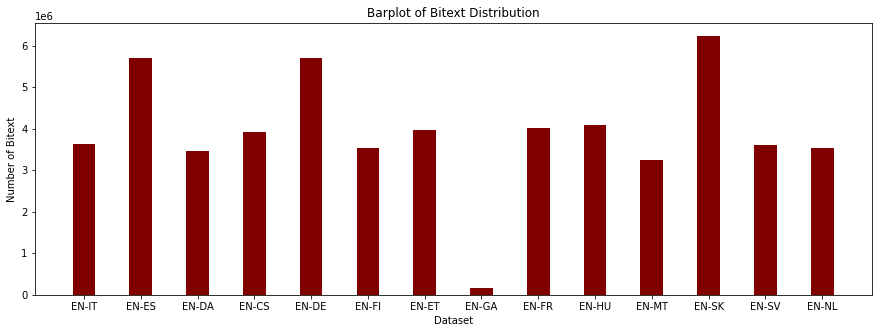

In [ ]:
import matplotlib.pyplot as plt
fig = plt.figure(figsize = (15, 5))
plt.xlabel("Dataset")
plt.ylabel("Number of Bitext")
plt.title("Barplot of Bitext Distribution")
plt.bar([x[0] for x in len_], [x[1] for x in len_], color ='maroon',
        width = 0.4)

In [ ]:
sum_ = sum([x[1] for x in len_])
sum_

54800616

**filtred number of bitext we used to run our experiment (out of 8890 * 14)**

In [ ]:
f_ = []
for i, score in enumerate(bleu_direct):
  f_.append(len(bleu_direct[i][1]))

print(sum(f_))

i_ = []
for i, score in enumerate(bleu_direct):
  i_.append((bleu_direct[i][0], len(bleu_direct[i][1])))
i_

30267


[('EN-IT', 2165),
 ('EN-ES', 1417),
 ('EN-DA', 2794),
 ('EN-CS', 2745),
 ('EN-DE', 1410),
 ('EN-FI', 2215),
 ('EN-ET', 2189),
 ('EN-GA', 2203),
 ('EN-FR', 2182),
 ('EN-HU', 2255),
 ('EN-MT', 2850),
 ('EN-SK', 1415),
 ('EN-SV', 2219),
 ('EN-NL', 2208)]

<BarContainer object of 14 artists>

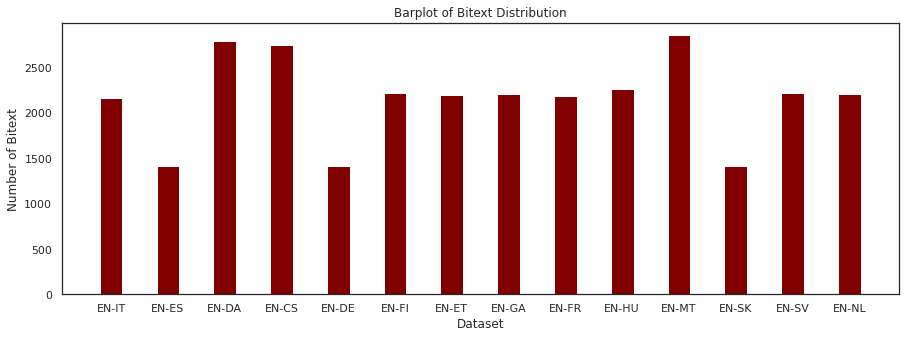

In [ ]:
import matplotlib.pyplot as plt
fig = plt.figure(figsize = (15, 5))
plt.xlabel("Dataset")
plt.ylabel("Number of Bitext")
plt.title("Barplot of Bitext Distribution")
plt.bar([x[0] for x in i_], [x[1] for x in i_], color ='maroon',
        width = 0.4)

# **BACK-TRANSLATION VALIDATION**

In [ ]:
#SUM BLEU COSIM SL/ 2

#filter bleu and cosim scores and save them into a list: each list will have 14 lists of cosim and ble scores
bl_ = []
cos_ = []
lang_ids =[]
for i,(bleu, baf) in enumerate(zip(bleu_direct, cosim_direct)):
  bl_.append(bleu_direct[i][1])
  cos_.append(cosim_direct[i][1])
  lang_ids.append(bleu_direct[i][0])


scores_bleu = []
scores_cosim = []

for i, (x, y) in enumerate(zip(bl_, cos_)):
  scores_bleu.append(bl_[i][0:])  
  scores_cosim.append(cos_[i][0:])


#WE END UP WITH 14 TUPLES OF TWO LISTS. WE NEED TO SUM THE SCORES  OF EVERY TWO LISTS IN TUPLE AND DIVIDE BY 2

f_ = []
for score1, score2 in zip(scores_bleu,scores_cosim):
  f_.append((score1, score2))


#WE NEED TO COMPUTE THE SUM OF BOTH METRICS AND DIVIDE BY 2: BAFSCORE
def compute_(tup_):
  BAF_S = []
  for el_ in tup_:
    x = tup_[0]
    y = tup_[1]
  for (a, b) in zip(x,y):
    c = (a+b)/2
    BAF_S.append(round(c, 2))

  return BAF_S

# BAFSCORE : COMPUTE THE SUM/2 :
baf_score = [compute_(tuple_) for tuple_ in f_]
lang_sum_direct = [(c,d) for c, d in zip(lang_ids, baf_score)] #(language id, sum) 


In [ ]:
#SUM BLEU COSIM SL / 2

#filter bleu and cosim scores and save them into a list: each list will have 14 lists of cosim and ble scores
bl_ = []
cos_ = []
lang_ids =[]
for i,(bleu, baf) in enumerate(zip(bleu_back, cosim_back)):
  bl_.append(bleu_back[i][1])
  cos_.append(cosim_back[i][1])
  lang_ids.append(bleu_back[i][0])


scores_bleu = []
scores_cosim = []



for i, (x, y) in enumerate(zip(bl_, cos_)):
  scores_bleu.append(bl_[i][0:])  #try it bl_[i]
  scores_cosim.append(cos_[i][0:])


#WE END UP WITH 14 TUPLES OF TWO LISTS. WE NEED TO SUM THE SCORES  OF EVERY TWO LISTS IN TUPLE AND DIVIDE BY 2

f_ = []
for score1, score2 in zip(scores_bleu,scores_cosim):
  f_.append((score1, score2))


#WE NEED TO COMPUTE THE SUM OF BOTH METRICS
def compute_(tup_):
  BAF_S = []
  for el_ in tup_:
    x = tup_[0]
    y = tup_[1]
  for (a, b) in zip(x,y):
    c = (a+b)/2
    BAF_S.append(round(c, 2))

  return BAF_S

# BAFSCORE : COMPUTE THE SUM/2 :
baf_score = [compute_(tuple_) for tuple_ in f_]
lang_sum_back = [(c,d) for c, d in zip(lang_ids, baf_score)] #(language id, sum) 


In [ ]:
lang_sum_direct[0]

('EN-IT',
 [0.98,
  0.85,
  0.98,
  0.96,
  0.92,
  0.86,
  0.57,
  0.85,
  0.65,
  0.98,
  0.85,
  0.94,
  0.97,
  0.94,
  0.8,
  0.79,
  0.83,
  0.89,
  0.99,
  0.89,
  0.97,
  0.89,
  0.86,
  0.88,
  0.93,
  0.96,
  0.85,
  0.85,
  0.97,
  0.95,
  0.96,
  0.93,
  0.98,
  0.92,
  0.74,
  0.96,
  0.9,
  0.78,
  0.98,
  0.77,
  0.78,
  0.86,
  0.85,
  0.88,
  0.88,
  0.62,
  0.92,
  0.99,
  0.9,
  0.91,
  0.88,
  0.85,
  0.92,
  0.76,
  0.95,
  0.69,
  0.41,
  0.4,
  0.48,
  0.91,
  0.85,
  0.89,
  0.87,
  0.98,
  0.99,
  0.85,
  0.86,
  0.9,
  0.8,
  0.88,
  0.87,
  0.76,
  0.96,
  0.8,
  0.82,
  0.96,
  0.85,
  0.91,
  0.95,
  0.88,
  0.96,
  0.79,
  0.69,
  0.88,
  0.89,
  0.96,
  0.81,
  0.82,
  0.86,
  0.97,
  0.77,
  0.9,
  0.97,
  0.88,
  0.87,
  0.92,
  0.99,
  0.96,
  0.96,
  0.91,
  0.88,
  0.82,
  0.88,
  0.96,
  0.96,
  0.88,
  0.8,
  0.82,
  0.88,
  0.86,
  0.79,
  0.82,
  0.91,
  0.91,
  0.9,
  0.93,
  0.89,
  0.89,
  0.89,
  0.88,
  0.89,
  0.97,
  0.97,
  0.96,
  0.85,


In [ ]:
#COMPUTE CORRELATION BETWEEN BASCORES AND BLEU
from scipy.stats import spearmanr, pearsonr

correlation_scores = []
for i, (bf_s, baf_s) in enumerate(zip(lang_sum_direct, lang_sum_back)):


  direct = lang_sum_direct[i][1]
  back = lang_sum_back[i][1]
  lang_ids = lang_sum_direct[i][0]

  
  s = spearmanr(direct, back, axis=None)
  correlation_scores.extend((lang_ids, s))

correlation_scores

['EN-IT',
 SpearmanrResult(correlation=0.3036945550124278, pvalue=1.9981589016034024e-47),
 'EN-ES',
 SpearmanrResult(correlation=0.36880717890824455, pvalue=6.832351700686939e-47),
 'EN-DA',
 SpearmanrResult(correlation=0.45680478930387947, pvalue=4.2209086965345096e-144),
 'EN-CS',
 SpearmanrResult(correlation=0.4932737352821212, pvalue=2.6192169418686505e-168),
 'EN-DE',
 SpearmanrResult(correlation=0.34527590375168954, pvalue=9.44950773106685e-41),
 'EN-FI',
 SpearmanrResult(correlation=0.4063817144491536, pvalue=7.611640018194212e-89),
 'EN-ET',
 SpearmanrResult(correlation=0.39514741793776115, pvalue=1.0232717865118875e-82),
 'EN-GA',
 SpearmanrResult(correlation=0.45589911562255353, pvalue=1.6298762061024602e-113),
 'EN-FR',
 SpearmanrResult(correlation=0.29582480478880635, pvalue=2.5528141428010503e-45),
 'EN-HU',
 SpearmanrResult(correlation=0.36605337061950083, pvalue=1.8941803666641776e-72),
 'EN-MT',
 SpearmanrResult(correlation=0.291959027942071, pvalue=4.0648443323524785e

SpearmanrResult(correlation=0.2923076923076923, pvalue=0.3105263203858819)


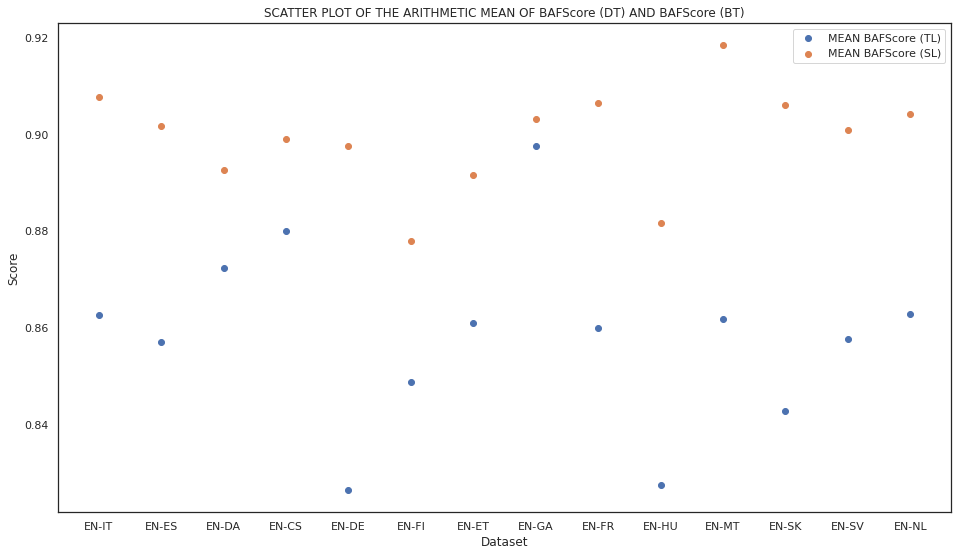

In [ ]:
from scipy.stats import spearmanr

s = spearmanr([mean(x[1]) for x in lang_sum_direct ], [mean(x[1]) for x in lang_sum_back], axis=None)
print(s)
from matplotlib import pyplot
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize = (16, 9))
pyplot.scatter([x[0] for x in lang_sum_direct], [mean(x[1]) for x in lang_sum_direct ])
pyplot.scatter([x[0] for x in lang_sum_back ], [mean(x[1])  for x in lang_sum_back ])
# pyplot.scatter([x[0] for x in mean_scar_ranking], [x[1] for x in mean_scar_ranking])
plt.xlabel("Dataset")
plt.ylabel("Score")
plt.title('SCATTER PLOT OF THE ARITHMETIC MEAN OF BAFScore (DT) AND BAFScore (BT)')
plt.legend(['MEAN BAFScore (TL)', "MEAN BAFScore (SL)"]) #, "scar bleu ranking"])
plt.show()

##HIGH CORRELATION, BUT THIS IS NOT VERY INFORMATIVE

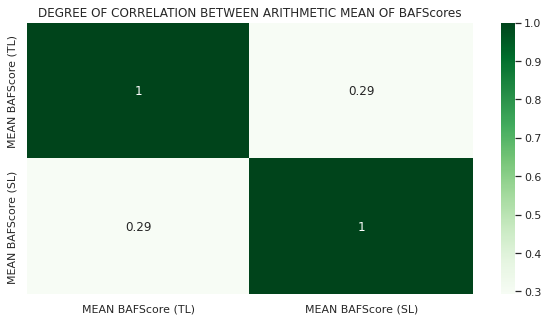

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


df = pd.DataFrame({'MEAN BAFScore (TL)': [mean(x[1]) for x in lang_sum_direct],
                   'MEAN BAFScore (SL)': [mean(x[1]) for x in lang_sum_back ]}) #,
                  #  "scar_ranking" :[x[1] for x in scar_ranking ]})

plt.figure(figsize = (10, 5))
corr = df.corr(method = 'spearman')

sns.heatmap(corr, annot = True, cmap = "Greens")
plt.title("DEGREE OF CORRELATION BETWEEN ARITHMETIC MEAN OF BAFScores")
plt.show()

# **NO OUTLIERS**

In [ ]:
import glob
directory = "/content/drive/MyDrive/tesi/chapters/1st-experimental evidence/data_scores"
data_ = [file_ for file_ in glob.iglob(f'{directory}/*.csv')]
data_

['/content/drive/MyDrive/tesi/chapters/1st-experimental evidence/data_scores/EN-IT.csv',
 '/content/drive/MyDrive/tesi/chapters/1st-experimental evidence/data_scores/EN-ES.csv',
 '/content/drive/MyDrive/tesi/chapters/1st-experimental evidence/data_scores/EN-DA.csv',
 '/content/drive/MyDrive/tesi/chapters/1st-experimental evidence/data_scores/EN-CS.csv',
 '/content/drive/MyDrive/tesi/chapters/1st-experimental evidence/data_scores/EN-DE.csv',
 '/content/drive/MyDrive/tesi/chapters/1st-experimental evidence/data_scores/EN-FI.csv',
 '/content/drive/MyDrive/tesi/chapters/1st-experimental evidence/data_scores/EN-ET.csv',
 '/content/drive/MyDrive/tesi/chapters/1st-experimental evidence/data_scores/EN-GA.csv',
 '/content/drive/MyDrive/tesi/chapters/1st-experimental evidence/data_scores/EN-FR.csv',
 '/content/drive/MyDrive/tesi/chapters/1st-experimental evidence/data_scores/EN-HU.csv',
 '/content/drive/MyDrive/tesi/chapters/1st-experimental evidence/data_scores/EN-MT.csv',
 '/content/drive/MyDr

In [ ]:
lang_id = [path.split("/")[-1][0:5] for path in data_]
lang_id

['EN-IT',
 'EN-ES',
 'EN-DA',
 'EN-CS',
 'EN-DE',
 'EN-FI',
 'EN-ET',
 'EN-GA',
 'EN-FR',
 'EN-HU',
 'EN-MT',
 'EN-SK',
 'EN-SV',
 'EN-NL']

In [ ]:
pd.read_csv(data_[0], index_col = 0).head()

,cosim_direct,cosim_back,bleu_direct,bleu_back
0,0.99,1.00,0.97,0.93
1,0.96,1.00,0.75,0.88
2,1.00,1.00,0.96,0.89
3,0.99,0.99,0.92,0.95
4,0.98,0.99,0.85,0.95


In [ ]:
cosim_direct = [(id, pd.read_csv(dataframe_, index_col = 0)["cosim_direct"].tolist()) for id, dataframe_ in zip(lang_id, data_)]
cosim_back= [(id, pd.read_csv(dataframe_, index_col = 0)["cosim_back"].tolist()) for id, dataframe_ in zip(lang_id, data_)]
bleu_direct = [(id, pd.read_csv(dataframe_, index_col = 0)["bleu_direct"].tolist()) for id, dataframe_ in zip(lang_id, data_)]
bleu_back = [(id, pd.read_csv(dataframe_, index_col = 0)["bleu_back"].tolist()) for id, dataframe_ in zip(lang_id, data_)]

In [ ]:
len(bleu_direct[0][1]) 

1834

In [ ]:
len(bleu_direct[1][1]) 

1171

In [ ]:
len(bleu_direct[1][1]) == len(bleu_back[1][1])

True

# **INFERENTIAL STATISTICS: SPEARMAN AND PEARSON CORRELATIONS**

**1ST EXPERIMENT: MEAN BLEU (DIRECT TRANSLATION VS. HUMAN JUDGMENT) AGAINST MEAN COSINE SIMILATRITY(ORIGINAL VS. BACK-TRANSLATION**

In [ ]:
from scipy.stats import pearsonr
import matplotlib.pyplot as plt 

def corrfunc(x, y, ax=None, **kws):
    """Plot the correlation coefficient in the top left hand corner of a plot."""
    r, _ = pearsonr(x, y)
    ax = ax or plt.gca()
    ax.annotate(f'ρ = {r:.2f}', xy=(.1, .9), xycoords=ax.transAxes)

**SPEARMAN**

In [ ]:
import plotly.express as px

In [ ]:
import plotly.express as px
df = pd.DataFrame({"MEAN BLEU (DT)": [mean(x[1]) for x in bleu_direct ], "MEAN COSINE SIMILARITY (RTT)": [mean(x[1]) for x in cosim_back], "DATASET": lang_id})
fig = px.line(df, x='DATASET', y=['MEAN BLEU (DT)', 'MEAN COSINE SIMILARITY (RTT)'],  markers=True, title = "SCATTER PLOT OF THE ARITHMETIC MEAN OF COSINE SIMILARITY METRIC (DT VS. RTT)" )

fig.show()

In [ ]:


#FIRST EXPERIMENT: ASSESS A CORRELATION BETWEEN COSIM COMPUTED BETWEEN SOURCE AND BACK-TRANSLATION ; AND BLEU COMPUTED BETWEEN REFERENCE AND M-TRANSLATED PAIRS
from scipy.stats import spearmanr

s = spearmanr([mean(x[1]) for x in bleu_direct ], [mean(x[1]) for x in cosim_back ], axis=None)
print(s)



SignificanceResult(statistic=0.18681318681318684, pvalue=0.5225040123791591)


**PEARSON**

PearsonRResult(statistic=0.27813416320251394, pvalue=0.33562829104471903)


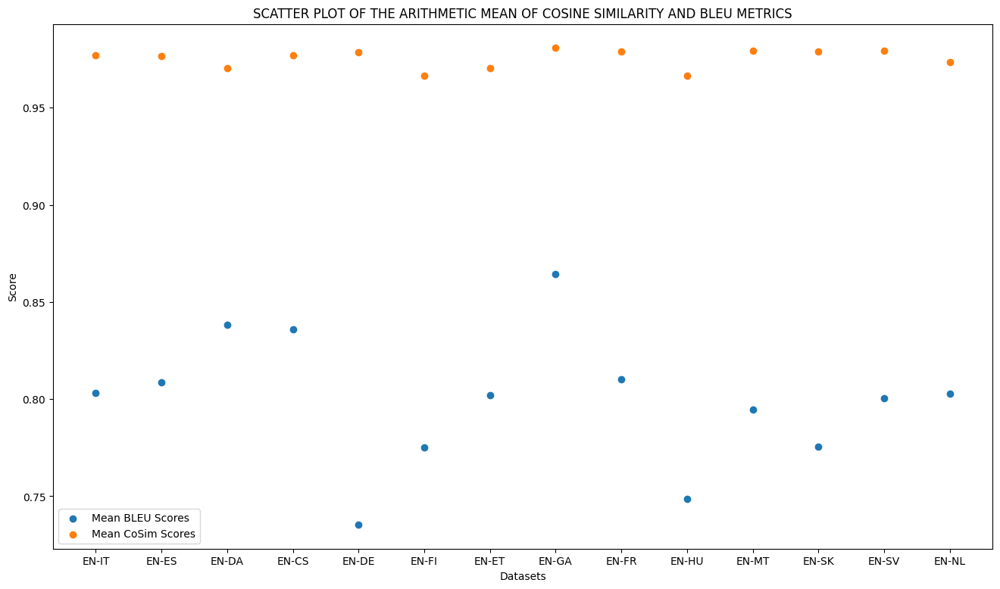

In [ ]:
#FIRST EXPERIMENT: ASSESS A CORRELATION BETWEEN COSIM COMPUTED BETWEEN SOURCE AND BACK-TRANSLATION ; AND BLEU COMPUTED BETWEEN REFERENCE AND M-TRANSLATED PAIRS
from scipy.stats import spearmanr, pearsonr

s = pearsonr([mean(x[1]) for x in bleu_direct ], [mean(x[1]) for x in cosim_back ])
print(s)
from matplotlib import pyplot
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize = (16, 9))
pyplot.scatter([x[0] for x in bleu_direct ], [mean(x[1]) for x in bleu_direct ])
pyplot.scatter([x[0] for x in cosim_back ], [mean(x[1])  for x in cosim_back ])
# pyplot.scatter([x[0] for x in mean_scar_ranking], [x[1] for x in mean_scar_ranking])
plt.xlabel("Datasets")
plt.ylabel("Score")
plt.title('SCATTER PLOT OF THE ARITHMETIC MEAN OF COSINE SIMILARITY AND BLEU METRICS')
plt.legend(['Mean BLEU Scores', "Mean CoSim Scores"]) #, "scar bleu ranking"])
plt.show()

##GOOD CORRELATION, BUT THIS IS NOT VERY INFORMATIVE

**SPEARMAN**

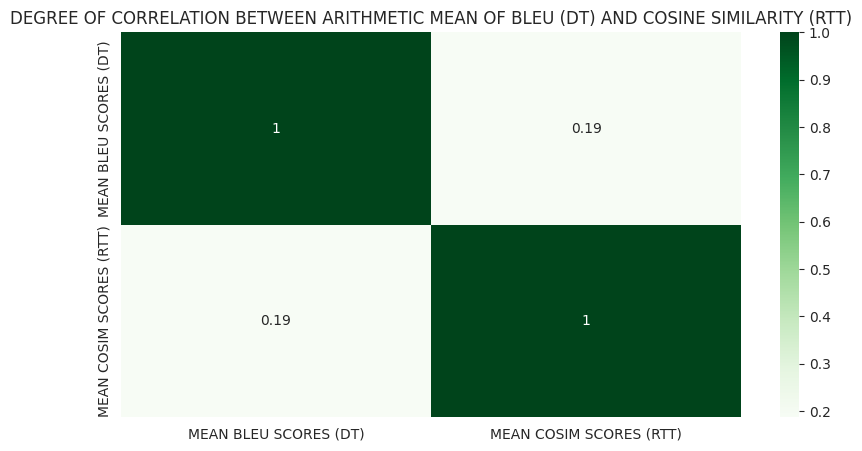

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


df = pd.DataFrame({'MEAN BLEU SCORES (DT)': [mean(x[1]) for x in bleu_direct],
                   'MEAN COSIM SCORES (RTT)': [mean(x[1]) for x in cosim_back]}) #,
                  #  "scar_ranking" :[x[1] for x in scar_ranking ]})

plt.figure(figsize = (10, 5))
corr = df.corr(method = 'spearman')

sns.heatmap(corr, annot = True, cmap = "Greens")
plt.title("DEGREE OF CORRELATION BETWEEN ARITHMETIC MEAN OF BLEU (DT) AND COSINE SIMILARITY (RTT)")
plt.show()

**PEARSON**

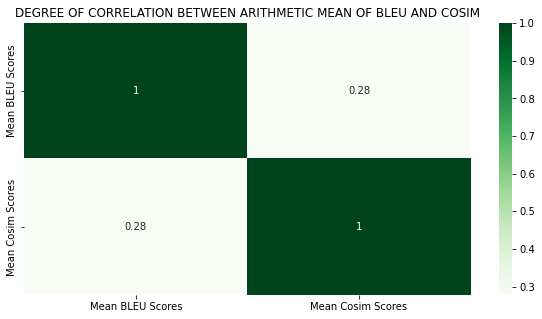

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


df = pd.DataFrame({'Mean BLEU Scores': [mean(x[1]) for x in bleu_direct],
                   'Mean Cosim Scores': [mean(x[1]) for x in cosim_back]}) #,
                  #  "scar_ranking" :[x[1] for x in scar_ranking ]})

plt.figure(figsize = (10, 5))
corr = df.corr(method = 'pearson')

sns.heatmap(corr, annot = True, cmap = "Greens")
plt.title("DEGREE OF CORRELATION BETWEEN ARITHMETIC MEAN OF BLEU AND COSIM")
plt.show()

**VERIFIY THE FIRST EXPERIMENT: COMPUTE CORRELATION IN EACH DATASET A PART**

**SPEARMAN**

In [ ]:
#bleu_direct cosim_back: original language 
from scipy.stats import spearmanr
correlation_scores = []
for i, (bleu_score, baf_score) in enumerate(zip(cosim_back, bleu_direct)):


  bleu_score = bleu_direct[i][1]
  cosim_score = cosim_back[i][1]
  lang_ids = bleu_direct[i][0]

  
  s = spearmanr(bleu_score, cosim_score, axis=None)
  correlation_scores.extend((lang_ids, s))

correlation_scores

['EN-IT',
 SignificanceResult(statistic=0.28983521682319524, pvalue=7.944051375829686e-37),
 'EN-ES',
 SignificanceResult(statistic=0.22053249167059413, pvalue=2.2989289414636305e-14),
 'EN-DA',
 SignificanceResult(statistic=0.1971168173197519, pvalue=1.5176562408159012e-21),
 'EN-CS',
 SignificanceResult(statistic=0.33292302006976376, pvalue=4.893928701106566e-59),
 'EN-DE',
 SignificanceResult(statistic=0.2777889162340425, pvalue=6.041538501258803e-22),
 'EN-FI',
 SignificanceResult(statistic=0.30495090849743295, pvalue=1.3948381970159606e-41),
 'EN-ET',
 SignificanceResult(statistic=0.304191056401411, pvalue=3.495903660398049e-41),
 'EN-GA',
 SignificanceResult(statistic=0.3465712099318074, pvalue=1.7691211704602212e-51),
 'EN-FR',
 SignificanceResult(statistic=0.23176523315127298, pvalue=2.7147328818988395e-23),
 'EN-HU',
 SignificanceResult(statistic=0.29318230869323675, pvalue=7.392955845781582e-39),
 'EN-MT',
 SignificanceResult(statistic=0.1926535370617975, pvalue=1.95455628584

**PEARSON**

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function 

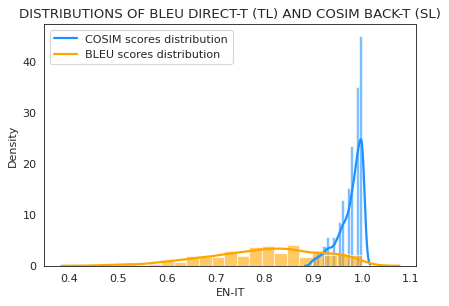

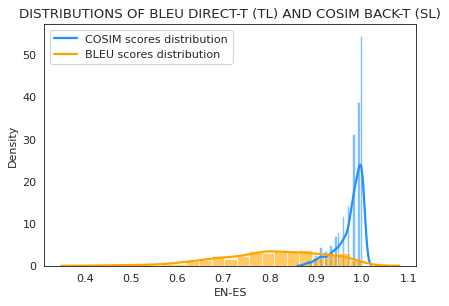

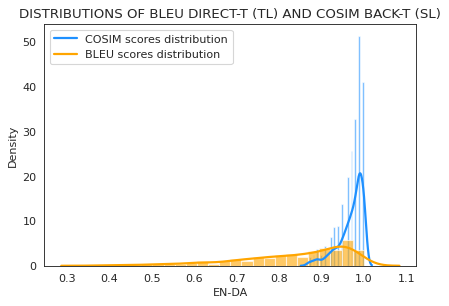

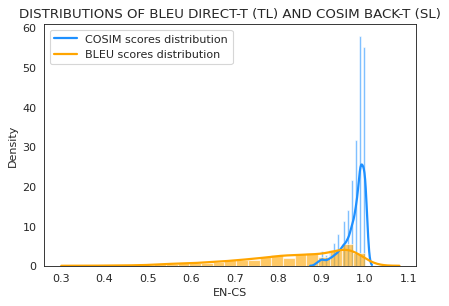

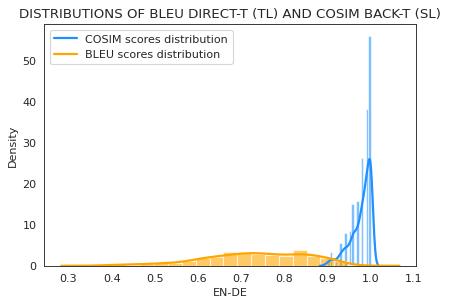

...

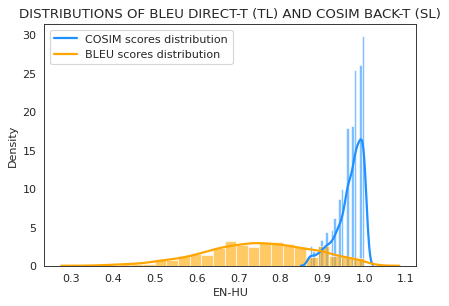

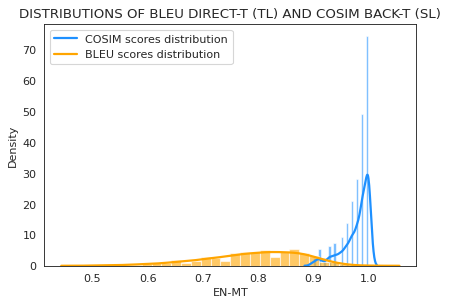

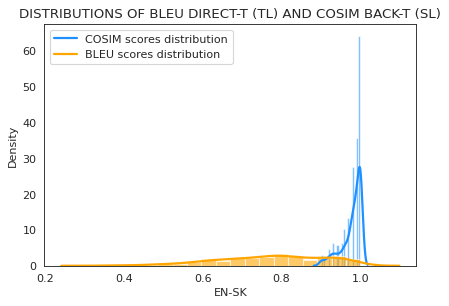

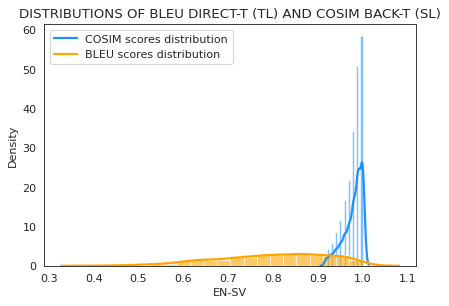

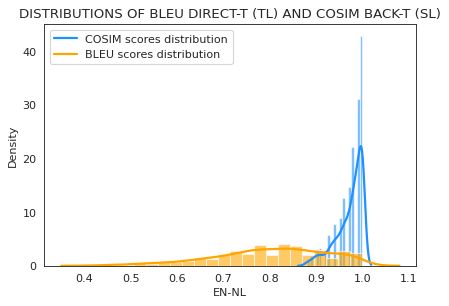

In [ ]:
import seaborn as sns
sns.set_style("white")


# figure, axis = plt.subplots(2, 2)

for i, (bleu_, cosim ) in enumerate(zip(cosim_back, bleu_direct)):
  x1 = cosim_back[i][1]
  x2 = bleu_direct[i][1]
  lang_id = bleu_back[i][0]

  # Plot

  kwargs = dict(hist_kws={'alpha':.6}, kde_kws={'linewidth':2})

  plt.figure(figsize=(6,4), dpi= 80)
  sns.distplot(x1, color="dodgerblue", label="Compact", **kwargs)
  sns.distplot(x2, color="orange", label="SUV", **kwargs)
  plt.title("DISTRIBUTIONS OF BLEU DIRECT-T (TL) AND COSIM BACK-T (SL)")
  plt.legend(["COSIM scores distribution", "BLEU scores distribution"])
  plt.xlabel(lang_id)

<Figure size 480x320 with 0 Axes>

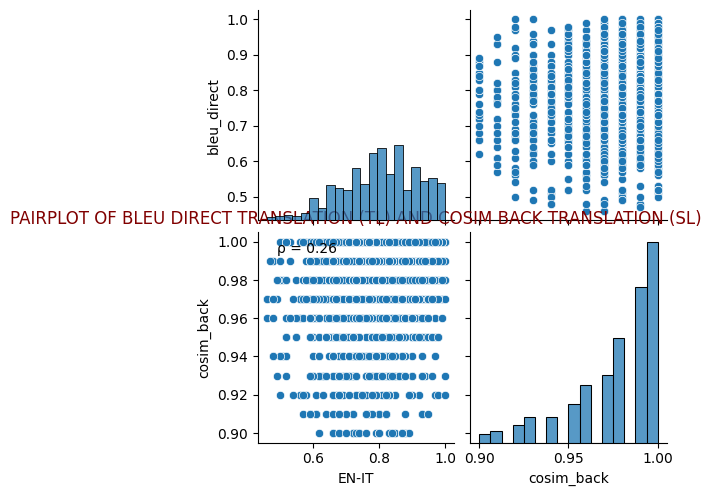

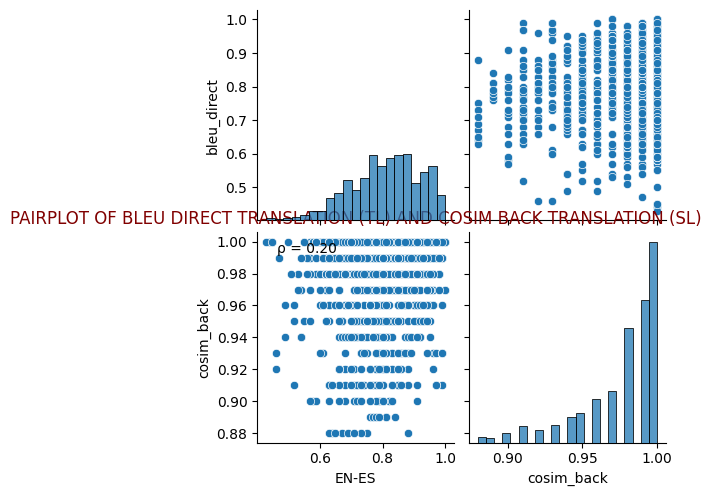

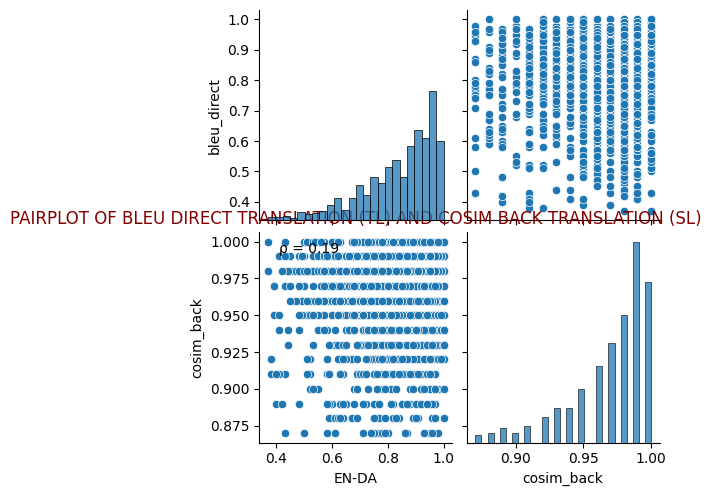

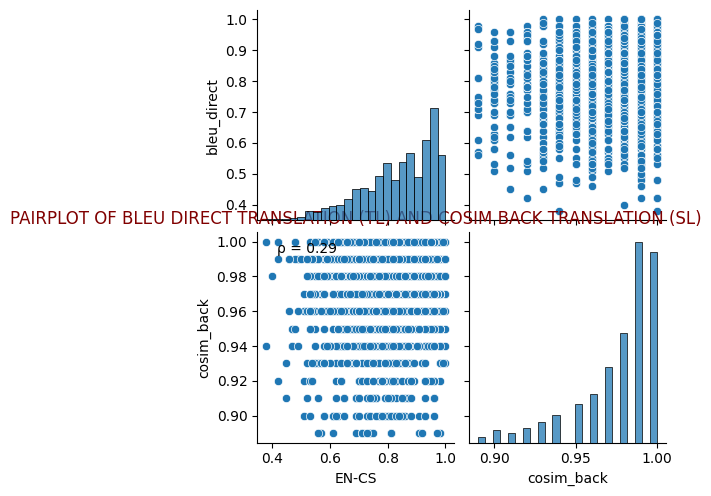

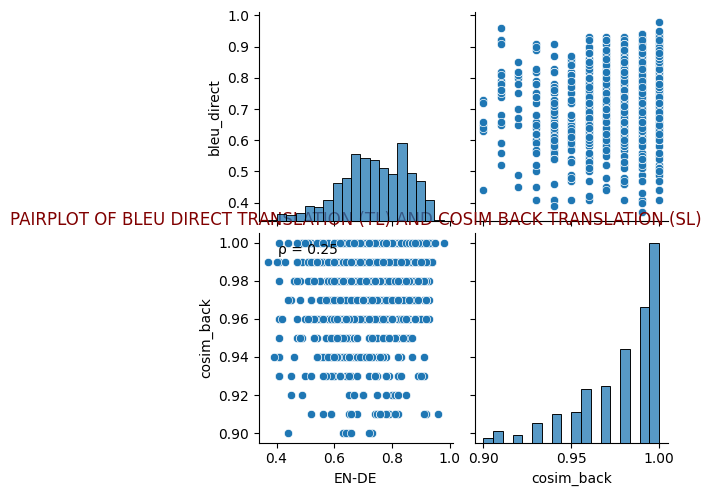

...

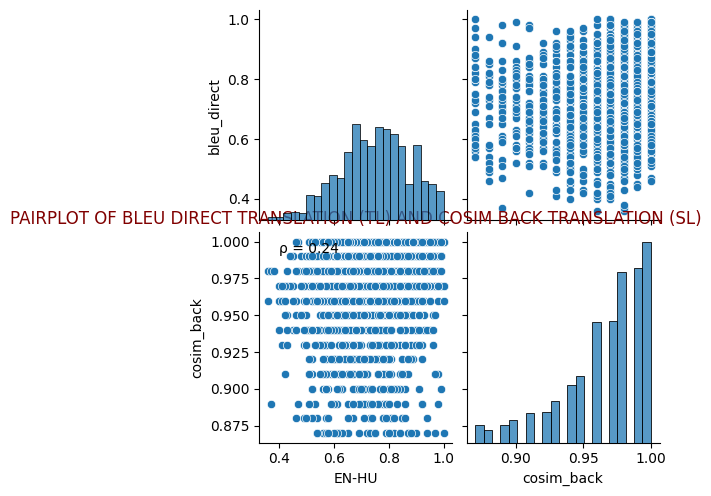

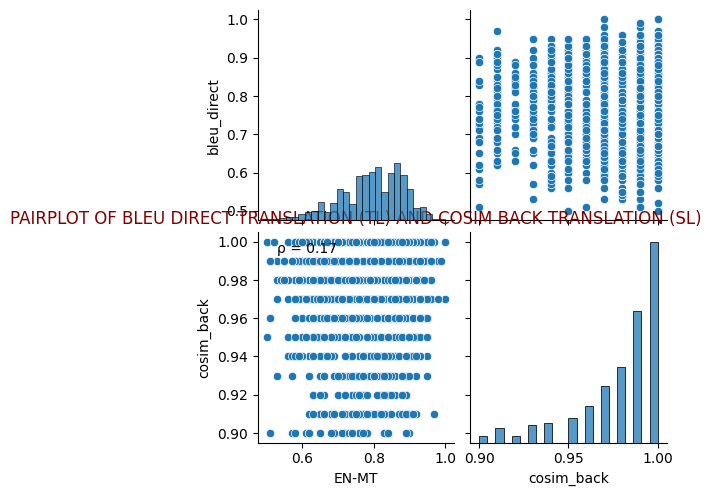

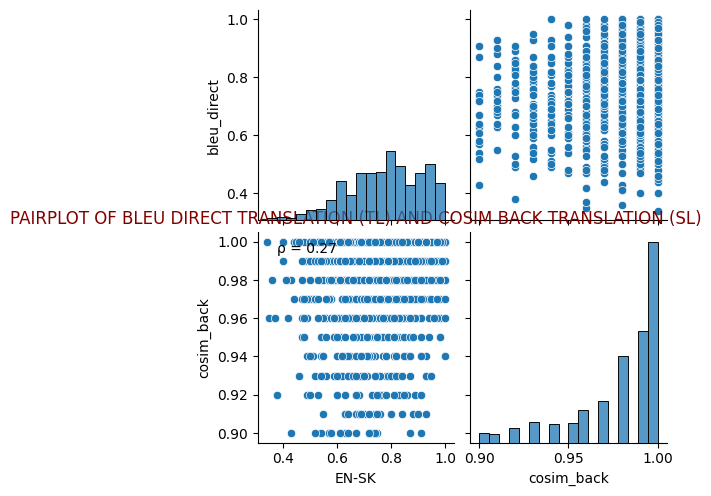

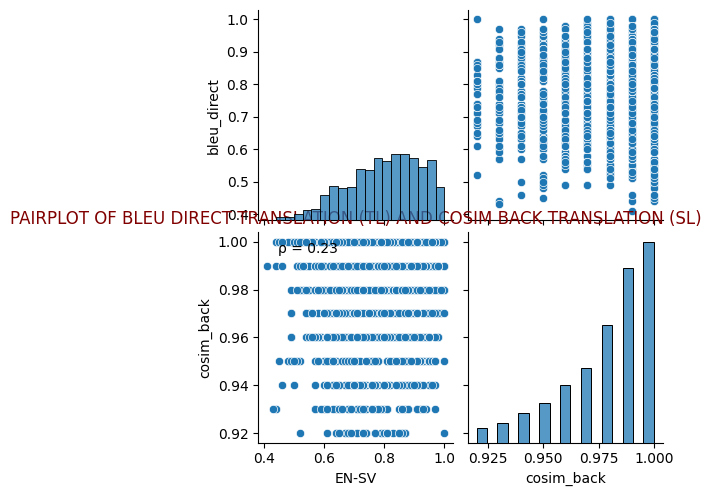

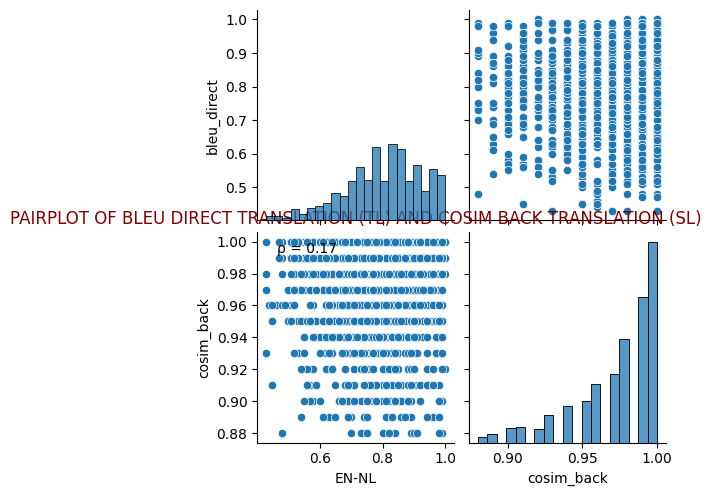

In [ ]:
plt.figure(figsize=(6,4), dpi= 80)
for i, (bleu_score, baf_score) in enumerate(zip( bleu_direct, cosim_back)):
  
  bleu_score_direct = bleu_direct[i][1]
  cosim_score_back = cosim_back[i][1]
  lang_id = bleu_direct[i][0]

  df_ = pd.DataFrame({"bleu_direct": [s for s in bleu_score_direct], "cosim_back": [s for s in cosim_score_back]})

  g = sns.pairplot(df_)
  g.map_lower(corrfunc)
  plt.title("PAIRPLOT OF BLEU DIRECT TRANSLATION (TL) AND COSIM BACK TRANSLATION (SL)", color = "maroon")
  plt.xlabel(lang_id)
  plt.show()


In [ ]:
#bleu_direct bleu_back: original language 
from scipy.stats import spearmanr, pearsonr
correlation_scores = []
for i, (bleu_score, baf_score) in enumerate(zip(bleu_direct, cosim_back)):


  bleu_score = bleu_direct[i][1]
  cosim_score = cosim_back[i][1]
  lang_ids = bleu_direct[i][0]

  
  s = pearsonr(bleu_score, cosim_score)
  correlation_scores.extend((lang_ids, s))

correlation_scores

['EN-IT',
 PearsonRResult(statistic=0.25682036402960556, pvalue=5.172237652650078e-29),
 'EN-ES',
 PearsonRResult(statistic=0.1971841233501988, pvalue=9.941185614969616e-12),
 'EN-DA',
 PearsonRResult(statistic=0.18842245030090515, pvalue=8.601394472562522e-20),
 'EN-CS',
 PearsonRResult(statistic=0.2926660082724369, pvalue=1.9962541833683583e-45),
 'EN-DE',
 PearsonRResult(statistic=0.2459651915225419, pvalue=2.100046709248638e-17),
 'EN-FI',
 PearsonRResult(statistic=0.2694542501342495, pvalue=1.6781990342531013e-32),
 'EN-ET',
 PearsonRResult(statistic=0.2592225685989685, pvalue=5.495122812224069e-30),
 'EN-GA',
 PearsonRResult(statistic=0.30483237450678324, pvalue=1.18128679734389e-39),
 'EN-FR',
 PearsonRResult(statistic=0.1973306876742106, pvalue=3.370302157531329e-17),
 'EN-HU',
 PearsonRResult(statistic=0.2387080163977937, pvalue=5.997269154506199e-26),
 'EN-MT',
 PearsonRResult(statistic=0.16643529819625574, pvalue=1.4097128845554341e-15),
 'EN-SK',
 PearsonRResult(statistic=0

**COSIM DIRECT VS COSIM BACK**

In [ ]:
#bleu_direct baf_direct: tl
from scipy.stats import spearmanr
correlation_scores= []
for i, (bleu_score, baf_score) in enumerate(zip(cosim_direct, cosim_back)):


  cosim_score_direct = cosim_direct[i][1]
  cosim_score_back = cosim_back[i][1]
  lang_ids = cosim_direct[i][0]

  
  s = spearmanr(cosim_score_direct, cosim_score_back, axis=None)
  correlation_scores.extend((lang_ids, s))

correlation_scores

['EN-IT',
 SignificanceResult(statistic=0.2752345662247593, pvalue=3.0850829083339104e-33),
 'EN-ES',
 SignificanceResult(statistic=0.3015453835300147, pvalue=4.8439412149879806e-26),
 'EN-DA',
 SignificanceResult(statistic=0.2462777998869081, pvalue=4.5593360244667645e-33),
 'EN-CS',
 SignificanceResult(statistic=0.28339223284548026, pvalue=1.3848246245904912e-42),
 'EN-DE',
 SignificanceResult(statistic=0.25853469898530007, pvalue=4.004513524943947e-19),
 'EN-FI',
 SignificanceResult(statistic=0.32039506192916906, pvalue=5.973937577245627e-46),
 'EN-ET',
 SignificanceResult(statistic=0.32072660856045726, pvalue=7.812600868927814e-46),
 'EN-GA',
 SignificanceResult(statistic=0.2997919418710406, pvalue=2.3805966688838034e-38),
 'EN-FR',
 SignificanceResult(statistic=0.2882163598762185, pvalue=1.2178518581734842e-35),
 'EN-HU',
 SignificanceResult(statistic=0.29335934511661965, pvalue=6.635642663216521e-39),
 'EN-MT',
 SignificanceResult(statistic=0.16233829222381224, pvalue=6.950785399

<ipython-input-28-61e3a9a2602d>:17: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


<ipython-input-28-61e3a9a2602d>:18: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


<ipython-input-28-61e3a9a2602d>:17: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use

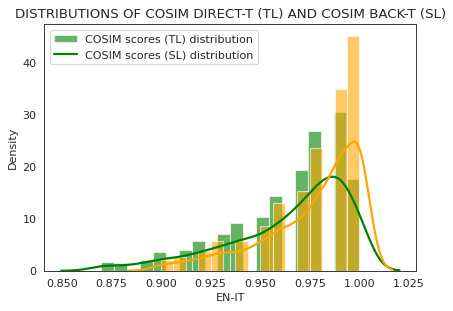

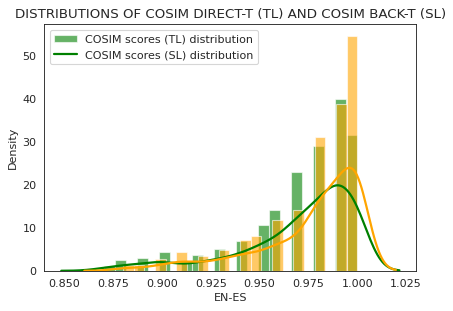

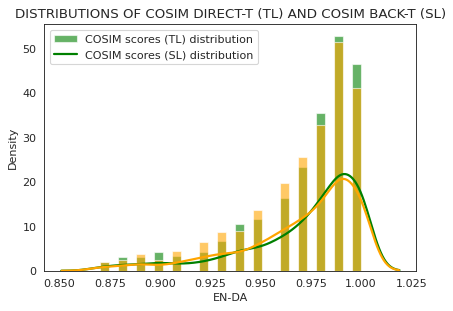

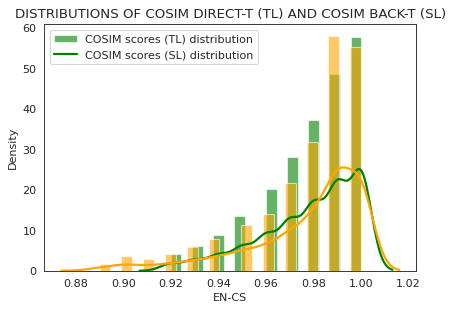

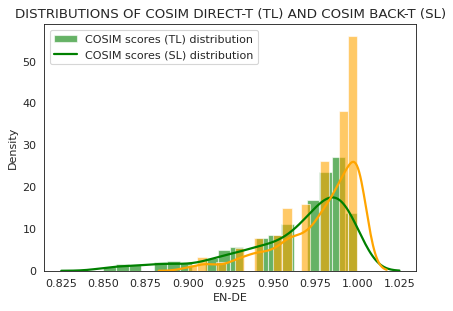

...

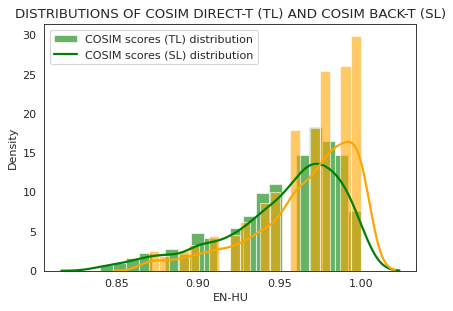

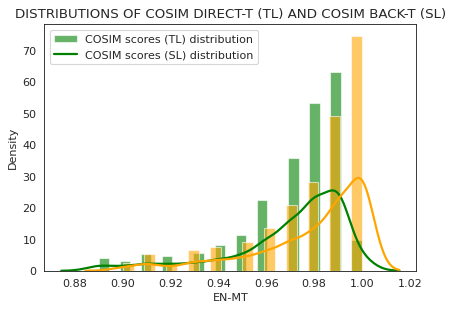

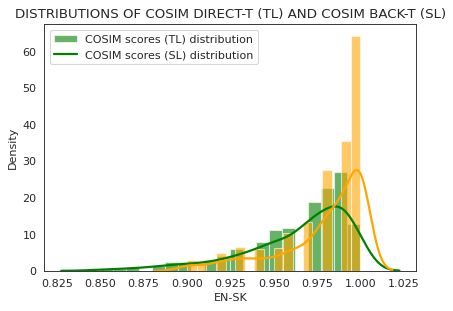

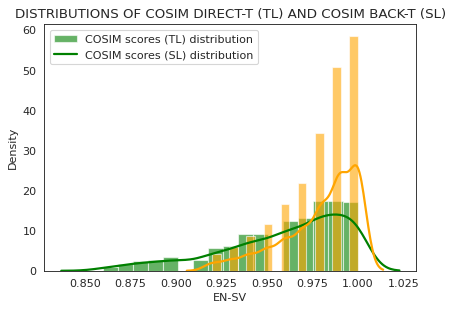

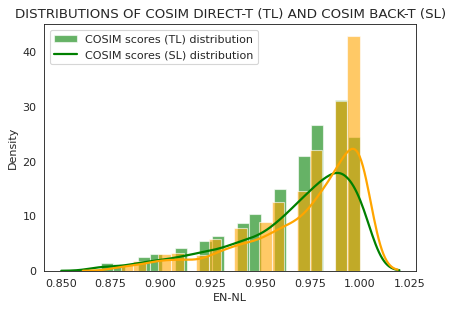

In [ ]:
import seaborn as sns
sns.set_style("white")


# figure, axis = plt.subplots(2, 2)

for i, (bleu_, cosim ) in enumerate(zip(cosim_direct, cosim_back)):
  x1 = cosim_direct[i][1]
  x2 = cosim_back[i][1]
  lang_id = cosim_direct[i][0]

  # Plot

  kwargs = dict(hist_kws={'alpha':.6}, kde_kws={'linewidth':2})

  plt.figure(figsize=(6,4), dpi= 80)
  sns.distplot(x1, color="green", label="Compact", **kwargs)
  sns.distplot(x2, color="orange", label="SUV", **kwargs)
  plt.title("DISTRIBUTIONS OF COSIM DIRECT-T (TL) AND COSIM BACK-T (SL)")
  plt.legend(["COSIM scores (TL) distribution", "COSIM scores (SL) distribution"])
  plt.xlabel(lang_id)

In [ ]:
import plotly.express as px
df = pd.DataFrame({"MEAN COSINE SIMILARITY DT": [mean(x[1]) for x in cosim_direct ], "MEAN COSINE SIMILARITY RTT": [mean(x[1]) for x in cosim_back], "DATASET": lang_id})
fig = px.line(df, x='DATASET', y=['MEAN COSINE SIMILARITY RTT', 'MEAN COSINE SIMILARITY DT'],  markers=True, title = "SCATTER PLOT OF THE ARITHMETIC MEAN OF COSINE SIMILARITY METRIC (DT VS. RTT)" )

fig.show()

In [ ]:
[mean(x[1]) for x in cosim_back]

[0.9768429661941113,
 0.9764730999146028,
 0.9702003484320557,
 0.9770049172999553,
 0.9784788245462402,
 0.966426282051282,
 0.9702147074610843,
 0.9808244531688166,
 0.9789235917456777,
 0.966441393875396,
 0.9794234154929577,
 0.9791296928327645,
 0.9794627867935086,
 0.9734789557805008]

In [ ]:
import math

dt_models_performance = [48.2, 54.9,60.4, 46.1, 47.3,25.7, 54.0 ,37.5, 50.5, 40.1, 47.5, 36.8, 60.1, 57.1 ]
rtt_modles_performance = [70.9, 59.6, 63.6, 58.0 , 55.4, 53.4, 59.9, 51.6, 57.5, 52.9, 49.0, 42.2, 64.5, 60.9]

import plotly.express as px
df = pd.DataFrame({"RTT MODEL'S PERFORMANCE * (1/100)":[x*(1/100) for x in rtt_modles_performance], "MEAN COSINE SIMILARITY RTT": [mean(x[1]) for x in cosim_back], "DATASET": lang_id})
fig = px.line(df, x='DATASET', y=[ "MEAN COSINE SIMILARITY RTT","RTT MODEL'S PERFORMANCE * (1/100)"],  markers=True, title = "SCATTER PLOT OF THE RTT MODEL'S PERFORMANCE AND THE ARITHMETIC MEAN OF COSINE SIMILARITY METRIC (RTT)" )

fig.show()

In [ ]:
import plotly.express as px

df = pd.DataFrame({"DT MODEL'S PERFORMANCE": [x for x in rtt_modles_performance ], "MEAN COSINE SIMILARITY RTT": [mean(x[1]) for x in cosim_back]})
fig = px.scatter(df, x ="DT MODEL'S PERFORMANCE", y ="MEAN COSINE SIMILARITY RTT", trendline="ols")
fig.show()

In [ ]:
import statsmodels.api as sm
x = rtt_modles_performance
y = [mean(x[1]) for x in cosim_back]

x = sm.add_constant(x)
model = sm.OLS(y, x)


results = model.fit()

results.rsquared

results.summary()

/usr/local/lib/python3.9/dist-packages/scipy/stats/_stats_py.py:1736: UserWarning:

kurtosistest only valid for n>=20 ... continuing anyway, n=14



<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.013
Model:                            OLS   Adj. R-squared:                 -0.069
Method:                 Least Squares   F-statistic:                    0.1557
Date:                Tue, 04 Apr 2023   Prob (F-statistic):              0.700
Time:                        15:32:35   Log-Likelihood:                 54.990
No. Observations:                  14   AIC:                            -106.0
Df Residuals:                      12   BIC:                            -104.7
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.9797      0.011     85.635      0.000       0.955       1.005
x1         -7.848e-05      0.000     -0.395      0.700      -0.001       0.000
==============================================================================
Omnibus:                        2.702   Durbin-Watson:                   2.260
Prob(Omnibus):                  0.259   Jarque-Bera (JB):                2.004
Skew:                          -0.858   Prob(JB):                        0.367
Kurtosis:                       2.298   Cond. No.                         479.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [ ]:
import statsmodels.api as sm

x = rtt_modles_performance
y = [mean(x[1]) for x in cosim_back]
# use GLM() function to do the Poisson regression
result_Poisson=sm.GLM(y, x, family=sm.families.Poisson()).fit()

# print out the result
print(result_Poisson.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                      y   No. Observations:                   14
Model:                            GLM   Df Residuals:                       12
Model Family:                 Poisson   Df Model:                            1
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -13.852
Date:                Tue, 04 Apr 2023   Deviance:                   0.00032611
Time:                        14:48:46   Pearson chi2:                 0.000326
No. Iterations:                     2   Pseudo R-squ. (CS):          3.018e-07
Covariance Type:            nonrobust                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0205      2.251     -0.009      0.9

In [ ]:
import math

dt_models_performance = [48.2, 54.9,60.4, 46.1, 47.3,25.7, 54.0 ,37.5, 50.5, 40.1, 47.5, 36.8, 60.1, 57.1 ]
rtt_modles_performance = [70.9, 59.6, 63.6, 58.0 , 55.4, 53.4, 59.9, 51.6, 57.5, 52.9, 49.0, 42.2, 64.5, 60.9]

import plotly.express as px
df = pd.DataFrame({"DT MODEL'S PERFORMANCE * (1/100)":[x*(1/100) for x in dt_models_performance], "MEAN COSINE SIMILARITY DT": [mean(x[1]) for x in cosim_direct], "DATASET": lang_id})
fig = px.line(df, x='DATASET', y=[ "MEAN COSINE SIMILARITY DT","DT MODEL'S PERFORMANCE * (1/100)"],  markers=True, title = "SCATTER PLOT OF THE RTT MODEL'S PERFORMANCE AND THE ARITHMETIC MEAN OF COSINE SIMILARITY METRIC (DT)" )

fig.show()

In [ ]:
#linear regression between DT model's performance and bleu DT
import plotly.express as px

df = pd.DataFrame({"DT MODEL'S PERFORMANCE": [x*(1/100) for x in dt_models_performance ], "MEAN COSINE SIMILARITY DT": [mean(x[1]) for x in cosim_direct]})
fig = px.scatter(df, x ="DT MODEL'S PERFORMANCE", y ="MEAN COSINE SIMILARITY DT", trendline="ols")
fig.show()



In [ ]:
import statsmodels.api as sm
x = dt_models_performance
y = [mean(x[1]) for x in cosim_direct]

x = sm.add_constant(x)
model = sm.OLS(y, x)


results = model.fit()

results.rsquared

results.summary()

/usr/local/lib/python3.9/dist-packages/scipy/stats/_stats_py.py:1736: UserWarning:

kurtosistest only valid for n>=20 ... continuing anyway, n=14



<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.004
Model:                            OLS   Adj. R-squared:                 -0.079
Method:                 Least Squares   F-statistic:                   0.04821
Date:                Tue, 04 Apr 2023   Prob (F-statistic):              0.830
Time:                        15:22:27   Log-Likelihood:                 48.868
No. Observations:                  14   AIC:                            -93.74
Df Residuals:                      12   BIC:                            -92.46
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.9693      0.011     89.347      0.000       0.946       0.993
x1         -4.908e-05      0.000     -0.220      0.830      -0.001       0.000
==============================================================================
Omnibus:                        0.602   Durbin-Watson:                   2.070
Prob(Omnibus):                  0.740   Jarque-Bera (JB):                0.121
Skew:                           0.225   Prob(JB):                        0.941
Kurtosis:                       2.927   Cond. No.                         247.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [ ]:
import statsmodels.api as sm

x = dt_models_performance
y = [mean(x[1]) for x in cosim_direct]
# use GLM() function to do the Poisson regression
result_Poisson=sm.GLM(y, x, family=sm.families.Poisson()).fit()

# print out the result
print(result_Poisson.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                      y   No. Observations:                   14
Model:                            GLM   Df Residuals:                       13
Model Family:                 Poisson   Df Model:                            0
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -13.802
Date:                Tue, 04 Apr 2023   Deviance:                    0.0012972
Time:                        15:02:03   Pearson chi2:                  0.00129
No. Iterations:                     2   Pseudo R-squ. (CS):         -3.621e-05
Covariance Type:            nonrobust                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
x1            -0.0007      0.006     -0.122      0.9

In [ ]:
rtt_modles_performance = [70.9, 59.6, 63.6, 58.0 , 55.4, 53.4, 59.9, 51.6, 57.5, 52.9, 49.0, 42.2, 64.5, 60.9]

In [ ]:
from scipy.stats import spearmanr

s = spearmanr([mean(x[1]) for x in cosim_back ], [mean(x[1]) for x in cosim_direct ], axis=None)
print(s)


SignificanceResult(statistic=0.04175824175824176, pvalue=0.8872869731890637)


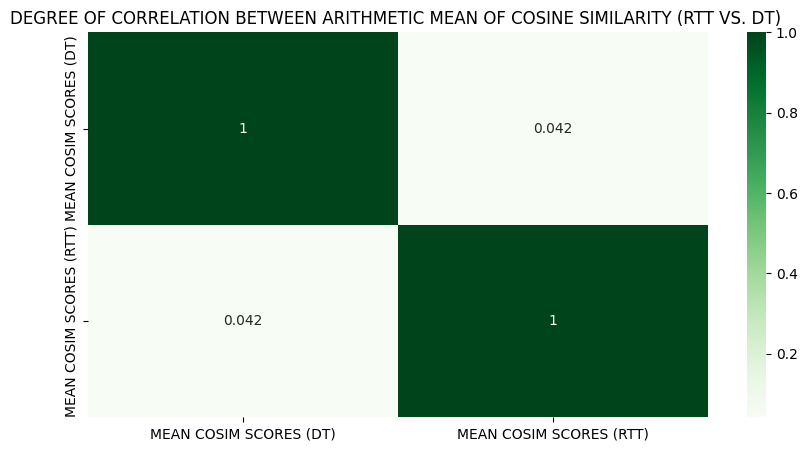

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


df = pd.DataFrame({'MEAN COSIM SCORES (DT)': [mean(x[1]) for x in cosim_direct],
                   'MEAN COSIM SCORES (RTT)': [mean(x[1]) for x in cosim_back]}) #,
                  #  "scar_ranking" :[x[1] for x in scar_ranking ]})

plt.figure(figsize = (10, 5))
corr = df.corr(method = 'spearman')

sns.heatmap(corr, annot = True, cmap = "Greens")
plt.title("DEGREE OF CORRELATION BETWEEN ARITHMETIC MEAN OF COSINE SIMILARITY (RTT VS. DT) ")
plt.show()

In [ ]:
# Import library
import scipy.stats as stats
 
# Creating data groups
data_group1 = np.array([mean(x[1]) for x in cosim_direct])
data_group2 = np.array([mean(x[1]) for x in cosim_back])
 
# Print the variance of both data groups
# print(np.var(data_group1), np.var(data_group2))
manwhite = stats.mannwhitneyu(data_group1, data_group2, alternative='two-sided')
manwhite


# wilxon_result = stats.wilcoxon(data_group1, data_group2)
# wilxon_result



MannwhitneyuResult(statistic=36.0, pvalue=0.004716530360235347)

In [ ]:
wilxon_result = stats.wilcoxon(data_group1, data_group2)
wilxon_result

WilcoxonResult(statistic=10.0, pvalue=0.0052490234375)

**2ND EXPERIMENT: BLEU (SOURCE VS. BACK) AGAINST BLEU (REFERENCE VS. HYPOTHESIS)**

**SPEARMAN**

In [ ]:
#bleu_direct baf_direct: tl
from scipy.stats import spearmanr
correlation_scores= []
for i, (bleu_score, baf_score) in enumerate(zip(bleu_direct, bleu_back)):


  bleu_score_direct = bleu_direct[i][1]
  bleu_score_back = bleu_back[i][1]
  lang_ids = bleu_direct[i][0]

  
  s = spearmanr(bleu_score_direct, bleu_score_back, axis=None)
  correlation_scores.extend((lang_ids, s))

correlation_scores

['EN-IT',
 SignificanceResult(statistic=0.267473452616625, pvalue=2.0432842494533704e-31),
 'EN-ES',
 SignificanceResult(statistic=0.2738624425155245, pvalue=1.366518848053798e-21),
 'EN-DA',
 SignificanceResult(statistic=0.4281159792295786, pvalue=5.434229194711051e-103),
 'EN-CS',
 SignificanceResult(statistic=0.47001980903114393, pvalue=2.5018473827607104e-123),
 'EN-DE',
 SignificanceResult(statistic=0.30085226957036587, pvalue=1.2408984123935581e-25),
 'EN-FI',
 SignificanceResult(statistic=0.34699890491193836, pvalue=4.234790204350132e-54),
 'EN-ET',
 SignificanceResult(statistic=0.3282850887011319, pvalue=4.6455058465896977e-48),
 'EN-GA',
 SignificanceResult(statistic=0.3677903436203083, pvalue=3.174166278321727e-58),
 'EN-FR',
 SignificanceResult(statistic=0.2522327318259957, pvalue=2.017697301486693e-27),
 'EN-HU',
 SignificanceResult(statistic=0.29453945331133685, pvalue=3.222297967332007e-39),
 'EN-MT',
 SignificanceResult(statistic=0.23136424117280527, pvalue=5.46827927136

In [ ]:
import math

dt_models_performance = [48.2, 54.9,60.4, 46.1, 47.3,25.7, 54.0 ,37.5, 50.5, 40.1, 47.5, 36.8, 60.1, 57.1 ]
rtt_modles_performance = [70.9, 59.6, 63.6, 58.0 , 55.4, 53.4, 59.9, 51.6, 57.5, 52.9, 49.0, 42.2, 64.5, 60.9]

import plotly.express as px
df = pd.DataFrame({"RTT MODEL'S PERFORMANCE * (1/100)":[x*(1/100) for x in rtt_modles_performance], "MEAN BLEU RTT": [mean(x[1]) for x in bleu_back], "DATASET": lang_id})
fig = px.line(df, x='DATASET', y=[ "MEAN BLEU RTT","RTT MODEL'S PERFORMANCE * (1/100)"],  markers=True, title = "SCATTER PLOT OF THE RTT MODEL'S PERFORMANCE AND THE ARITHMETIC MEAN THE BLEU METRIC (RTT)" )

fig.show()

In [ ]:
dt_models_performance = [48.2, 54.9,60.4, 46.1, 47.3,25.7, 54.0 ,37.5, 50.5, 40.1, 47.5, 36.8, 60.1, 57.1 ]
rtt_modles_performance = [70.9, 59.6, 63.6, 58.0 , 55.4, 53.4, 59.9, 51.6, 57.5, 52.9, 49.0, 42.2, 64.5, 60.9]
df = pd.DataFrame({"RTT MODEL'S PERFORMANCE": [x for x in rtt_modles_performance ], "MEAN BLEU RTT": [mean(x[1]) for x in bleu_back]})
fig = px.scatter(df, x ="RTT MODEL'S PERFORMANCE", y ="MEAN BLEU RTT", trendline="ols")
fig.show()

import statsmodels.api as sm
x = rtt_modles_performance 
y= [mean(x[1]) for x in bleu_back]
x = sm.add_constant(x)
model = sm.OLS(y, x)
results = model.fit()

results.rsquared

results.summary()

/usr/local/lib/python3.9/dist-packages/scipy/stats/_stats_py.py:1736: UserWarning:

kurtosistest only valid for n>=20 ... continuing anyway, n=14



<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.020
Model:                            OLS   Adj. R-squared:                 -0.062
Method:                 Least Squares   F-statistic:                    0.2398
Date:                Tue, 04 Apr 2023   Prob (F-statistic):              0.633
Time:                        15:19:54   Log-Likelihood:                 35.222
No. Observations:                  14   AIC:                            -66.44
Df Residuals:                      12   BIC:                            -65.17
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.8861      0.047     18.871      0.000       0.784       0.988
x1            -0.0004      0.001     -0.490      0.633      -0.002       0.001
==============================================================================
Omnibus:                        0.406   Durbin-Watson:                   2.090
Prob(Omnibus):                  0.816   Jarque-Bera (JB):                0.144
Skew:                          -0.223   Prob(JB):                        0.931
Kurtosis:                       2.781   Cond. No.                         479.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [ ]:
import statsmodels.api as sm

x = rtt_modles_performance 
y= [mean(x[1]) for x in bleu_back]

# use GLM() function to do the Poisson regression
result_Poisson=sm.GLM(y, x, family=sm.families.Poisson()).fit()

# print out the result
print(result_Poisson.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                      y   No. Observations:                   14
Model:                            GLM   Df Residuals:                       13
Model Family:                 Poisson   Df Model:                            0
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -13.143
Date:                Tue, 04 Apr 2023   Deviance:                    0.0087478
Time:                        15:02:56   Pearson chi2:                  0.00868
No. Iterations:                     3   Pseudo R-squ. (CS):         -0.0001733
Covariance Type:            nonrobust                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
x1            -0.0025      0.005     -0.509      0.6

In [ ]:
import math

dt_models_performance = [48.2, 54.9,60.4, 46.1, 47.3,25.7, 54.0 ,37.5, 50.5, 40.1, 47.5, 36.8, 60.1, 57.1 ]
rtt_modles_performance = [70.9, 59.6, 63.6, 58.0 , 55.4, 53.4, 59.9, 51.6, 57.5, 52.9, 49.0, 42.2, 64.5, 60.9]

import plotly.express as px
df = pd.DataFrame({"RTT MODEL'S PERFORMANCE * (1/100)":[x*(1/100) for x in dt_models_performance], "MEAN BLEU DT": [mean(x[1]) for x in bleu_direct], "DATASET": lang_id})
fig = px.line(df, x='DATASET', y=[ "MEAN BLEU DT","RTT MODEL'S PERFORMANCE * (1/100)"],  markers=True, title = "SCATTER PLOT OF THE DT MODEL'S PERFORMANCE AND THE ARITHMETIC MEAN OF COSINE SIMILARITY METRIC (DT)" )

fig.show()

In [ ]:

df = pd.DataFrame({"DT MODEL'S PERFORMANCE": [x for x in dt_models_performance ], "MEAN BLEU DT": [mean(x[1]) for x in bleu_direct]})
fig = px.scatter(df, x ="DT MODEL'S PERFORMANCE" , y="MEAN BLEU DT", trendline="ols")
fig.show()



In [ ]:
import statsmodels.api as sm
x = [x for x in dt_models_performance ]
y = [mean(x[1]) for x in bleu_direct]

x = sm.add_constant(x)
model = sm.OLS(y, x)


results = model.fit()

results.rsquared

results.summary()

/usr/local/lib/python3.9/dist-packages/scipy/stats/_stats_py.py:1736: UserWarning:

kurtosistest only valid for n>=20 ... continuing anyway, n=14



<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.068
Model:                            OLS   Adj. R-squared:                 -0.010
Method:                 Least Squares   F-statistic:                    0.8753
Date:                Tue, 04 Apr 2023   Prob (F-statistic):              0.368
Time:                        15:20:54   Log-Likelihood:                 28.422
No. Observations:                  14   AIC:                            -52.84
Df Residuals:                      12   BIC:                            -51.57
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.7567      0.047     16.193      0.000       0.655       0.859
x1             0.0009      0.001      0.936      0.368      -0.001       0.003
==============================================================================
Omnibus:                        2.203   Durbin-Watson:                   2.069
Prob(Omnibus):                  0.332   Jarque-Bera (JB):                0.465
Skew:                           0.271   Prob(JB):                        0.793
Kurtosis:                       3.709   Cond. No.                         247.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [ ]:
import statsmodels.api as sm

x = [x for x in dt_models_performance ]
y = [mean(x[1]) for x in bleu_direct]

# use GLM() function to do the Poisson regression
result_Poisson=sm.GLM(y, x, family=sm.families.Poisson()).fit()

# print out the result
print(result_Poisson.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                      y   No. Observations:                   14
Model:                            GLM   Df Residuals:                       13
Model Family:                 Poisson   Df Model:                            0
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -12.723
Date:                Tue, 04 Apr 2023   Deviance:                     0.051274
Time:                        15:03:50   Pearson chi2:                   0.0502
No. Iterations:                     3   Pseudo R-squ. (CS):          -0.002307
Covariance Type:            nonrobust                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
x1            -0.0045      0.006     -0.727      0.4

In [ ]:
import plotly.express as px
df = pd.DataFrame({"MEAN BLEU DT": [mean(x[1]) for x in bleu_direct ], "MEAN BLEU RTT": [mean(x[1]) for x in bleu_back], "DATASET": lang_id})
fig = px.line(df, x='DATASET', y=['MEAN BLEU RTT', 'MEAN BLEU DT'],  markers=True, title = "SCATTER PLOT OF THE ARITHMETIC MEAN OF THE BLEU METRIC (DT VS. RTT)" )

fig.show()

In [ ]:
from scipy.stats import spearmanr

s = spearmanr([mean(x[1]) for x in bleu_direct ], [mean(x[1]) for x in bleu_back ], axis=None)
print(s)



SignificanceResult(statistic=0.665934065934066, pvalue=0.00932299909684176)


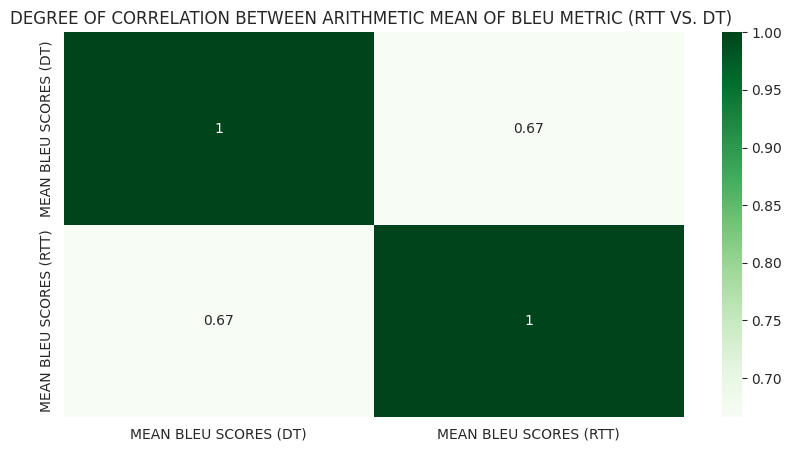

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


df = pd.DataFrame({'MEAN BLEU SCORES (DT)': [mean(x[1]) for x in bleu_direct],
                   'MEAN BLEU SCORES (RTT)': [mean(x[1]) for x in bleu_back]}) #,
                  #  "scar_ranking" :[x[1] for x in scar_ranking ]})

plt.figure(figsize = (10, 5))
corr = df.corr(method = 'spearman')

sns.heatmap(corr, annot = True, cmap = "Greens")
plt.title("DEGREE OF CORRELATION BETWEEN ARITHMETIC MEAN OF BLEU METRIC (RTT VS. DT) ")
plt.show()

In [ ]:
# Import library
import scipy.stats as stats
 
# Creating data groups
data_group1 = np.array([mean(x[1]) for x in bleu_direct])
data_group2 = np.array([mean(x[1]) for x in bleu_back])
 
# Print the variance of both data groups
# print(np.var(data_group1), np.var(data_group2))
manwhite = stats.mannwhitneyu(data_group1, data_group2, alternative='two-sided')
manwhite


# wilxon_result = stats.wilcoxon(data_group1, data_group2)
# wilxon_result

MannwhitneyuResult(statistic=11.0, pvalue=7.053487010253718e-05)

In [ ]:
wilxon_result = stats.wilcoxon(data_group1, data_group2)
wilxon_result

WilcoxonResult(statistic=0.0, pvalue=0.0001220703125)

In [ ]:
from statsmodels.stats.weightstats import ttest_ind
import numpy as np
import pingouin as pg
 
# Conducting two-sample ttest
result = pg.ttest(data_group1,
                  data_group2,
                  correction=True)
 
result

,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-5.977521,21.283108,two-sided,0.000006,"[-0.09, -0.04]",2.259291,4964.95,0.999923


**PEARSON**

<ipython-input-35-df4073747509>:17: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


<ipython-input-35-df4073747509>:18: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


<ipython-input-35-df4073747509>:17: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use

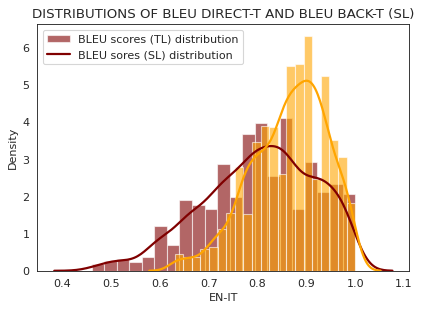

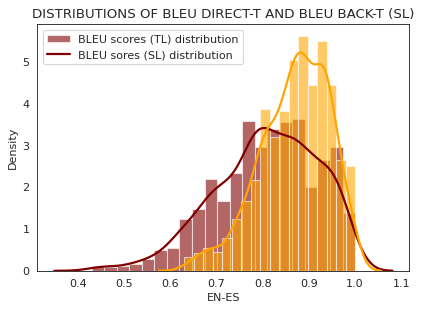

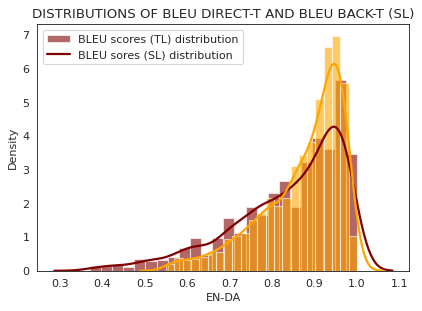

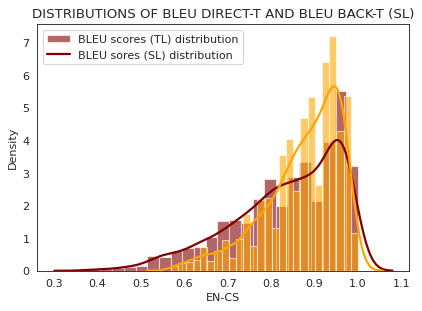

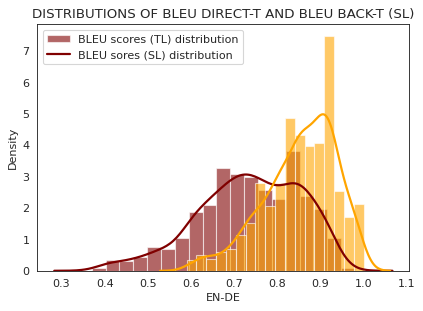

...

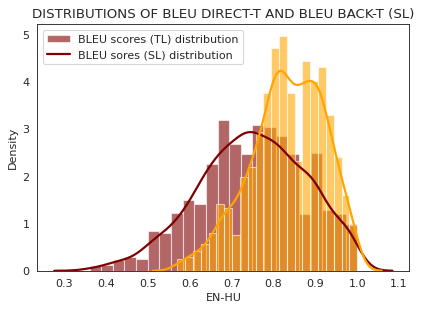

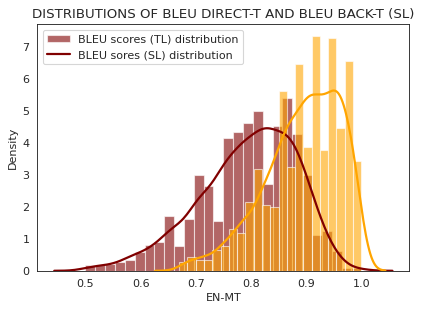

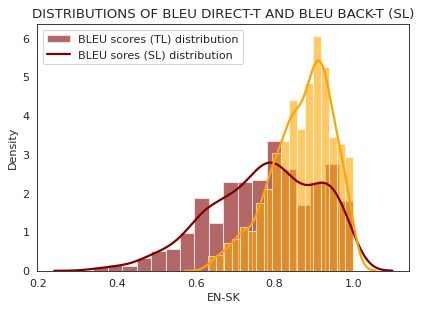

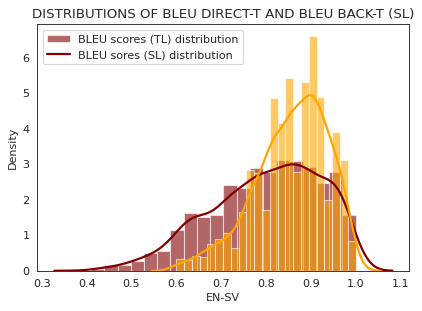

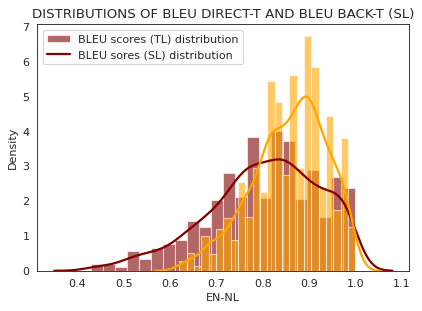

In [ ]:
import seaborn as sns
sns.set_style("white")


# figure, axis = plt.subplots(2, 2)

for i, (bleu_, cosim ) in enumerate(zip(bleu_direct, bleu_back)):
  x1 = bleu_direct[i][1]
  x2 = bleu_back[i][1]
  lang_id = bleu_direct[i][0]

  # Plot

  kwargs = dict(hist_kws={'alpha':.6}, kde_kws={'linewidth':2})

  plt.figure(figsize=(6,4), dpi= 80)
  sns.distplot(x1, color="maroon", label="Compact", **kwargs)
  sns.distplot(x2, color="orange", label="SUV", **kwargs)
  plt.title("DISTRIBUTIONS OF BLEU DIRECT-T AND BLEU BACK-T (SL)")
  plt.legend(["BLEU scores (TL) distribution", "BLEU sores (SL) distribution"])
  plt.xlabel(lang_id)


In [ ]:
#bleu_direct bleu_back
from scipy.stats import spearmanr
correlation_scores= []
for i, (bleu_score, baf_score) in enumerate(zip(bleu_direct, bleu_back)):


  bleu_score_direct = bleu_direct[i][1]
  bleu_score_back = bleu_back[i][1]
  lang_ids = bleu_direct[i][0]

  
  s = pearsonr(bleu_score_direct, bleu_score_back)
  correlation_scores.extend((lang_ids, s))

correlation_scores

['EN-IT',
 PearsonRResult(statistic=0.28001654855411723, pvalue=2.1746673703604638e-34),
 'EN-ES',
 PearsonRResult(statistic=0.24807363383170866, pvalue=6.994381989274755e-18),
 'EN-DA',
 PearsonRResult(statistic=0.40606794283373776, pvalue=7.101496747747425e-92),
 'EN-CS',
 PearsonRResult(statistic=0.4506591980866251, pvalue=2.4845712636525845e-112),
 'EN-DE',
 PearsonRResult(statistic=0.31528092473742814, pvalue=4.075147281654808e-28),
 'EN-FI',
 PearsonRResult(statistic=0.35885230752894287, pvalue=5.387130460340455e-58),
 'EN-ET',
 PearsonRResult(statistic=0.3143028826016881, pvalue=5.430152681787168e-44),
 'EN-GA',
 PearsonRResult(statistic=0.3550498468986607, pvalue=4.1095214273574784e-54),
 'EN-FR',
 PearsonRResult(statistic=0.24505218685011998, pvalue=6.27233175620675e-26),
 'EN-HU',
 PearsonRResult(statistic=0.2954048713774889, pvalue=1.8930483103331332e-39),
 'EN-MT',
 PearsonRResult(statistic=0.23743796183965107, pvalue=1.744280337391355e-30),
 'EN-SK',
 PearsonRResult(statis

**Spearman Correlation between BLEU and Cosine Similarity (reference vs. hypothesis; original vs. back-translation)**

**reference vs. hypothesis**

**SPEARMAN**

In [ ]:
for i, (bleu_score, baf_score) in enumerate(zip(bleu_direct, cosim_direct)):
  if len(bleu_direct[i]) == len(cosim_direct[i]):
    print("go")
  else:
    print("error")

go
go
go
go
go
go
go
go
go
go
go
go
go
go


In [ ]:
#bleu_direct baf_direct: tl
from scipy.stats import spearmanr
correlation_scores= []
for i, (bleu_score, baf_score) in enumerate(zip(bleu_direct, cosim_direct)):


  bleu_score_direct = bleu_direct[i][1]
  cosim_score_direct = cosim_direct[i][1]
  lang_ids = bleu_direct[i][0]

  
  s = spearmanr(bleu_score_direct, cosim_score_direct, axis=None)
  correlation_scores.extend((lang_ids, s))

correlation_scores

['EN-IT',
 SignificanceResult(statistic=0.7364948373214402, pvalue=2.43676288036e-313),
 'EN-ES',
 SignificanceResult(statistic=0.7164678592959134, pvalue=5.046465210489203e-185),
 'EN-DA',
 SignificanceResult(statistic=0.7496378199084687, pvalue=0.0),
 'EN-CS',
 SignificanceResult(statistic=0.7384373746810307, pvalue=0.0),
 'EN-DE',
 SignificanceResult(statistic=0.6985229653977492, pvalue=4.587212572357882e-170),
 'EN-FI',
 SignificanceResult(statistic=0.765124540990578, pvalue=0.0),
 'EN-ET',
 SignificanceResult(statistic=0.7474452313397811, pvalue=0.0),
 'EN-GA',
 SignificanceResult(statistic=0.7265193113160906, pvalue=1.5828693187000768e-292),
 'EN-FR',
 SignificanceResult(statistic=0.6732331388310312, pvalue=4.383456849740971e-237),
 'EN-HU',
 SignificanceResult(statistic=0.6363317238554462, pvalue=1.6181726288427105e-215),
 'EN-MT',
 SignificanceResult(statistic=0.5687007939798413, pvalue=7.592873224803681e-195),
 'EN-SK',
 SignificanceResult(statistic=0.7421486928812872, pvalue=

**PEARSON**

<ipython-input-97-3dcc6d17f3e4>:17: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


<ipython-input-97-3dcc6d17f3e4>:18: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


<ipython-input-97-3dcc6d17f3e4>:17: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use

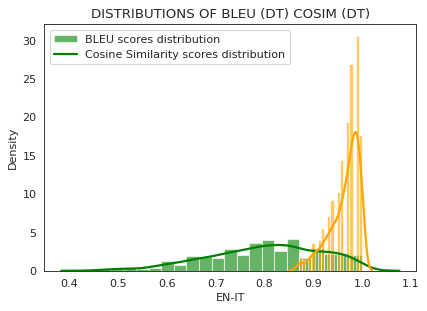

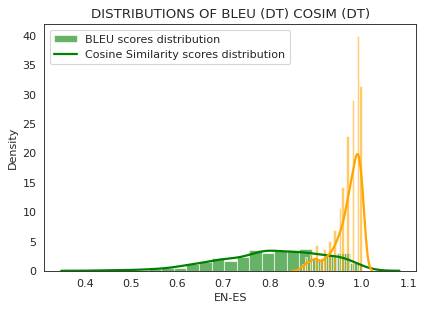

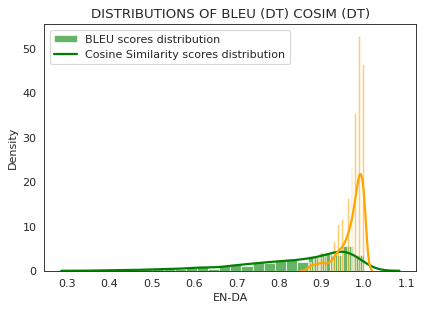

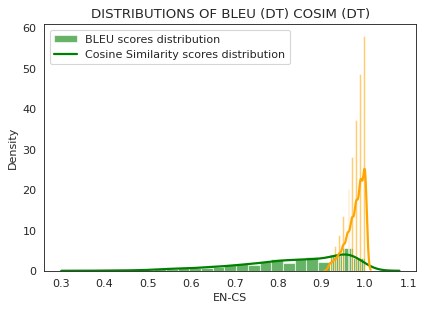

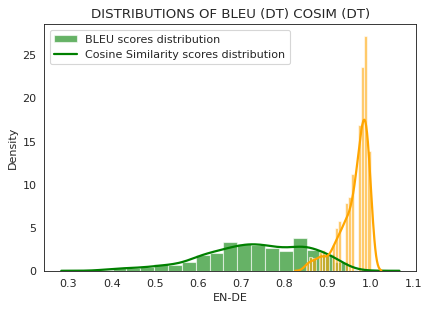

...

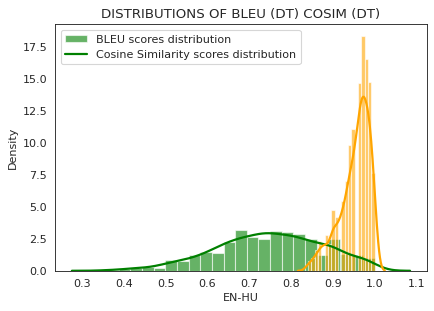

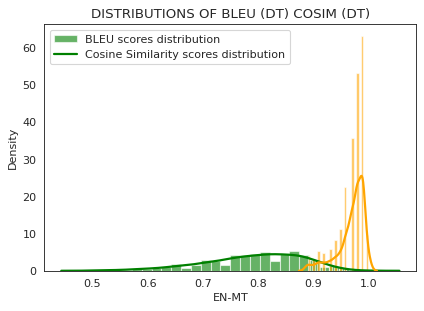

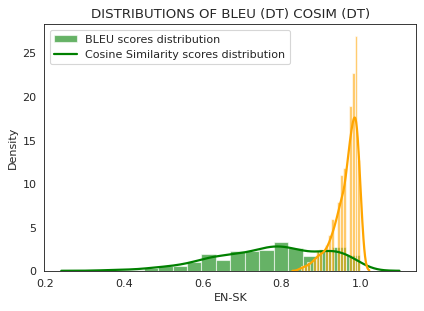

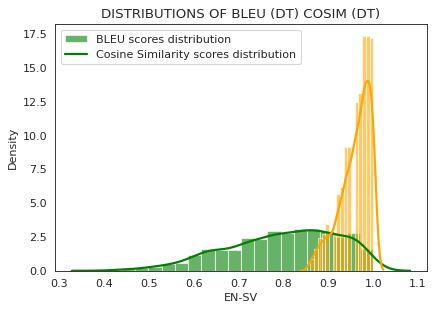

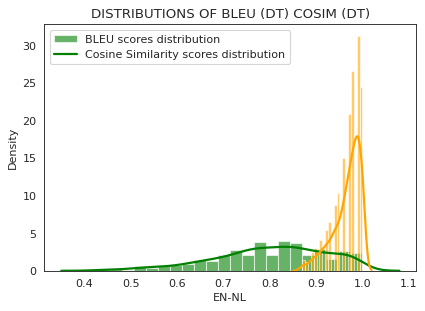

In [ ]:
import seaborn as sns
sns.set_style("white")


# figure, axis = plt.subplots(2, 2)

for i, (bleu_, cosim ) in enumerate(zip(bleu_direct, cosim_direct)):
  x1 = bleu_direct[i][1]
  x2 = cosim_direct[i][1]
  lang_id = bleu_direct[i][0]

  # Plot

  kwargs = dict(hist_kws={'alpha':.6}, kde_kws={'linewidth':2})

  plt.figure(figsize=(6,4), dpi= 80)
  sns.distplot(x1, color="green", label="Compact", **kwargs)
  sns.distplot(x2, color="orange", label="SUV", **kwargs)
  plt.title("DISTRIBUTIONS OF BLEU (DT) COSIM (DT)")
  plt.legend(["BLEU scores distribution", "Cosine Similarity scores distribution"])
  plt.xlabel(lang_id)


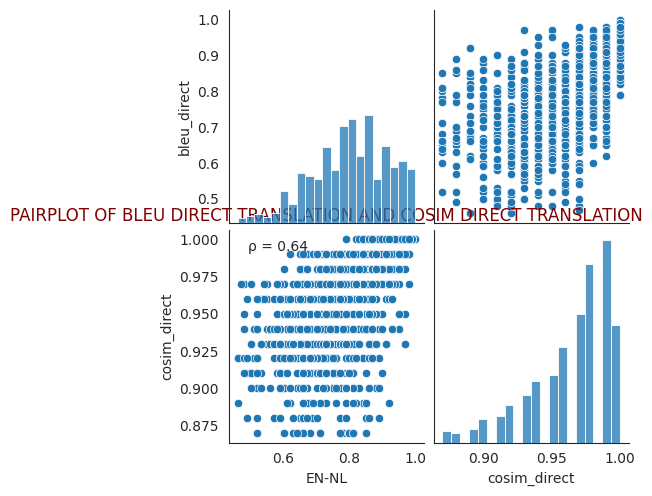

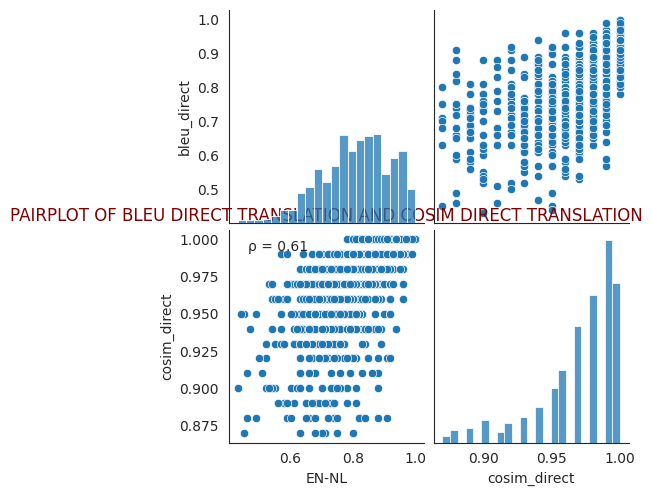

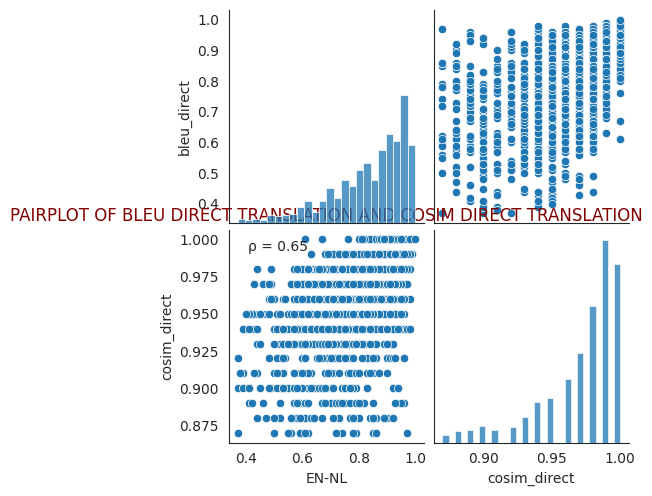

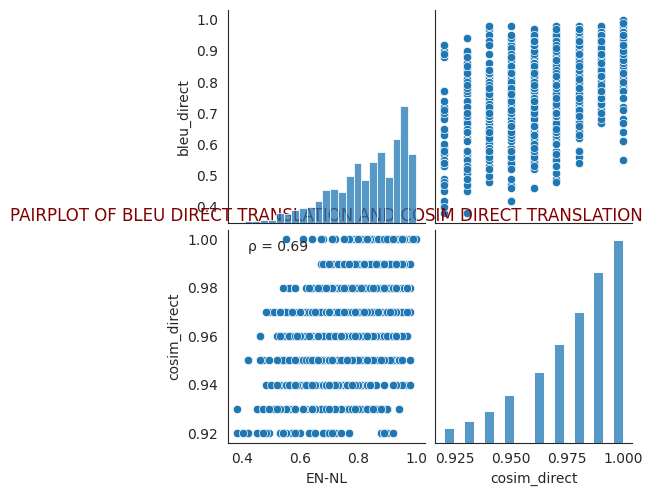

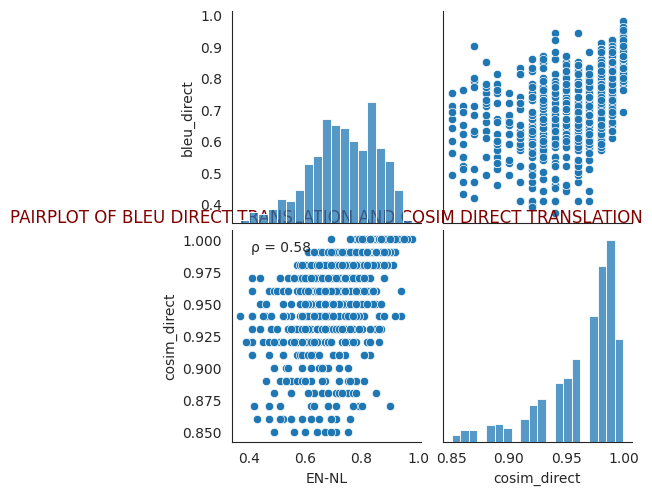

...

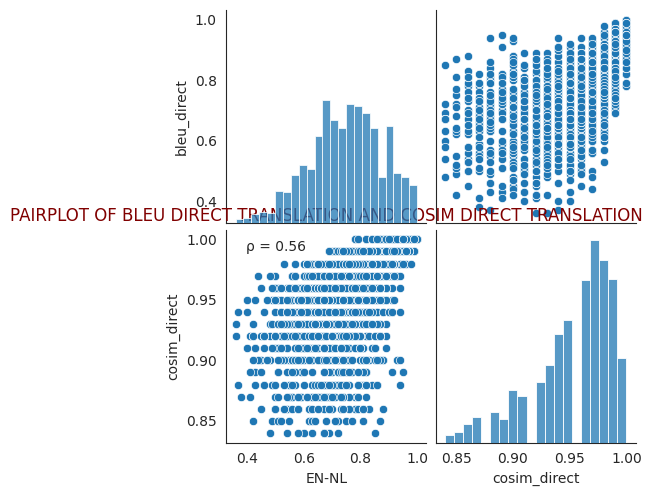

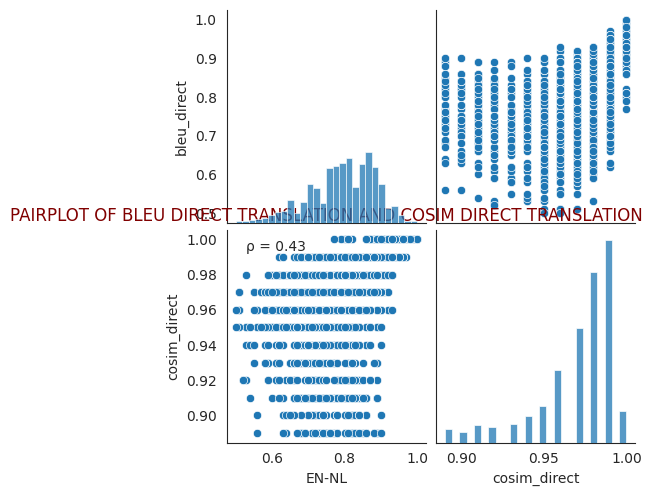

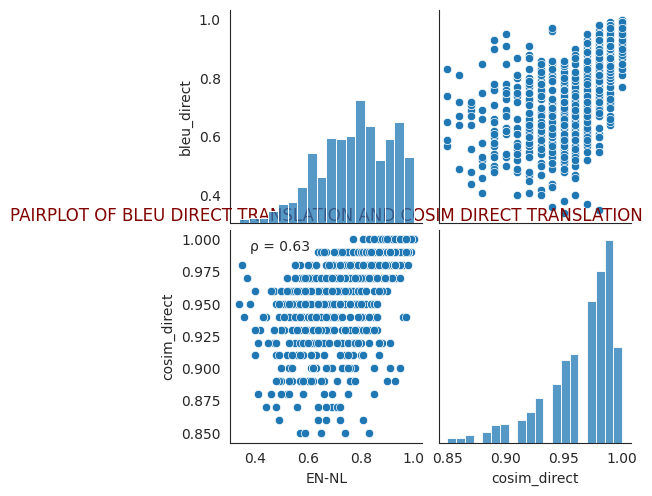

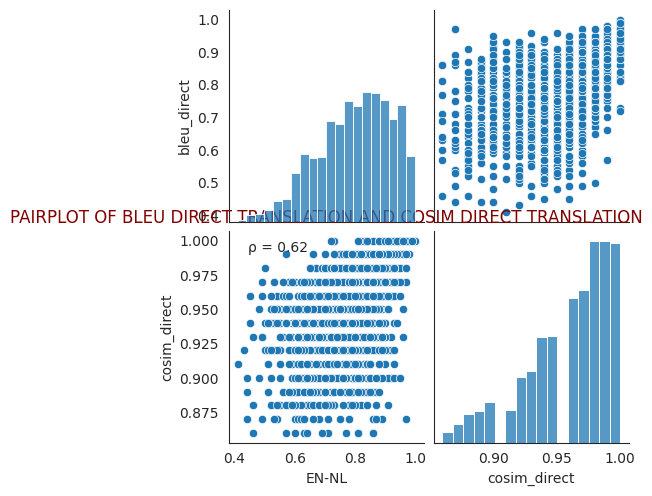

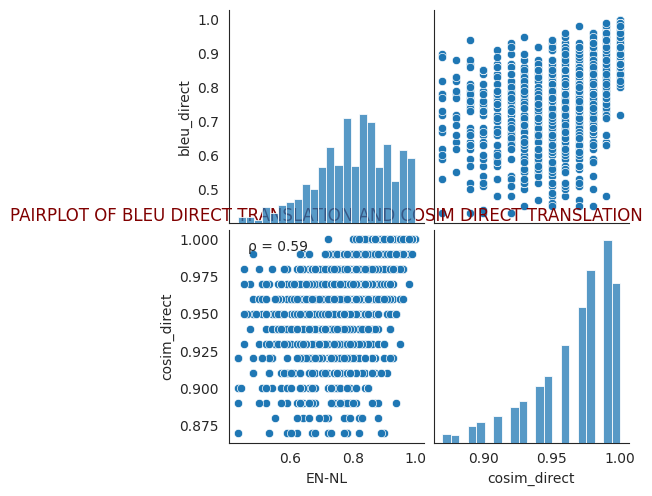

In [ ]:
for i, (bleu_score, baf_score) in enumerate(zip(bleu_direct, cosim_direct)):
  # fig, axes = plt.subplots(2, len(bleu_direct))
  bleu_score_direct = bleu_direct[i][1]
  cosim_score_direct = cosim_direct[i][1]
  lang_ids = bleu_direct[i][0]

  df_ = pd.DataFrame({"bleu_direct": [s for s in bleu_score_direct], "cosim_direct": [s for s in cosim_score_direct]})

  g = sns.pairplot(df_)
  g.map_lower(corrfunc)
  plt.title("PAIRPLOT OF BLEU DIRECT TRANSLATION AND COSIM DIRECT TRANSLATION", color = "maroon")
  plt.xlabel(lang_id)
  plt.show()


In [ ]:
#bleu_direct baf_direct: tl
from scipy.stats import spearmanr
correlation_scores= []
for i, (bleu_score, baf_score) in enumerate(zip(bleu_direct, cosim_direct)):


  bleu_score_direct = bleu_direct[i][1]
  cosim_score_direct = cosim_direct[i][1]
  lang_ids = bleu_direct[i][0]

  
  s = pearsonr(bleu_score_direct, cosim_score_direct)
  correlation_scores.extend((lang_ids, s))

correlation_scores

['EN-IT',
 (0.6366873970325381, 4.7387721080902326e-209),
 'EN-ES',
 (0.6133304734686978, 6.224748774729377e-122),
 'EN-DA',
 (0.6478714912440494, 1.937222559066219e-273),
 'EN-CS',
 (0.6906415075699489, 6.70968e-317),
 'EN-DE',
 (0.5827326741606621, 3.560679706608913e-106),
 'EN-FI',
 (0.6822794198910304, 1.1452114822825798e-256),
 'EN-ET',
 (0.6759871595466654, 4.99821296898325e-249),
 'EN-GA',
 (0.6320166154472403, 1.8910747471908989e-199),
 'EN-FR',
 (0.5825756276865212, 1.8527517449210862e-163),
 'EN-HU',
 (0.5572284226906299, 5.864170467203708e-155),
 'EN-MT',
 (0.4302204190528295, 5.000769212448222e-103),
 'EN-SK',
 (0.6254288997093091, 3.1975265994808547e-128),
 'EN-SV',
 (0.6155394197039908, 7.763817591450568e-187),
 'EN-NL',
 (0.5932226306292095, 7.905159864127825e-179)]

**SPEARMAN**

In [ ]:
import plotly.express as px
df = pd.DataFrame({"Mean BLEU Scores (DT)": [mean(x[1]) for x in bleu_direct ], "Mean Ccosine Similarity Scores (DT)": [mean(x[1]) for x in cosim_direct], "DATASET": lang_id})
fig = px.line(df, x='DATASET', y=['Mean BLEU Scores (DT)', 'Mean Ccosine Similarity Scores (DT)'],  markers=True, title = "SCATTER PLOT OF THE ARITHMETIC MEAN OF COSINE SIMILARITY AND BLEU METRICS (DT)" )

fig.show()

In [ ]:
from scipy.stats import spearmanr

s = spearmanr([mean(x[1]) for x in bleu_direct], [mean(x[1]) for x in cosim_direct], axis=None)
print(s)


SignificanceResult(statistic=0.6395604395604396, pvalue=0.013779616833463787)


**PEARSON**

(0.7547407669827265, 0.001808690121155748)


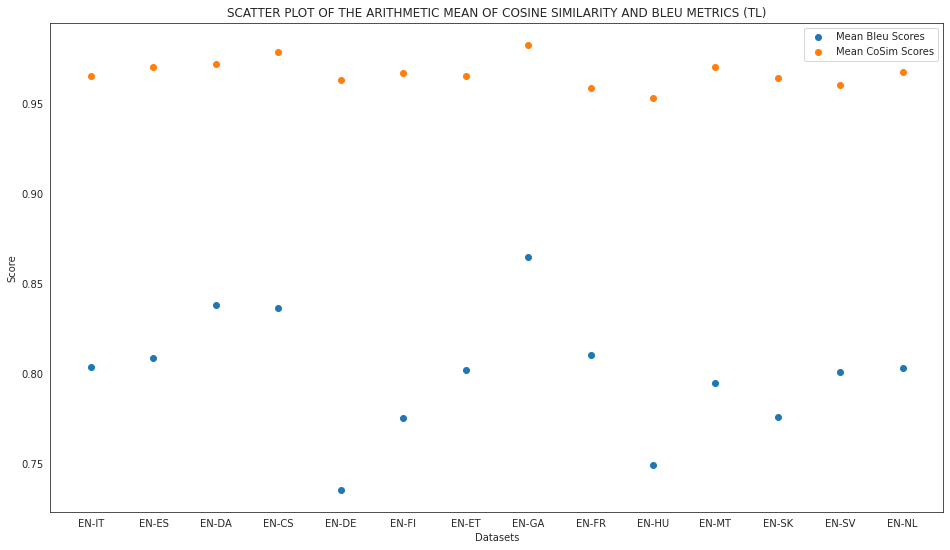

In [ ]:
from scipy.stats import spearmanr

s = pearsonr([mean(x[1]) for x in bleu_direct], [mean(x[1]) for x in cosim_direct])
print(s)
from matplotlib import pyplot
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize = (16, 9))
pyplot.scatter([x[0] for x in bleu_direct], [mean(x[1])for x in bleu_direct])
pyplot.scatter([x[0] for x in cosim_direct], [mean(x[1])  for x in cosim_direct])
# pyplot.scatter([x[0] for x in mean_scar_ranking], [x[1] for x in mean_scar_ranking])
plt.xlabel("Datasets")
plt.ylabel("Score")
plt.title('SCATTER PLOT OF THE ARITHMETIC MEAN OF COSINE SIMILARITY AND BLEU METRICS (TL)')
plt.legend(['Mean Bleu Scores', "Mean CoSim Scores"]) #, "scar bleu ranking"])
plt.show()

**SPEARMAN**

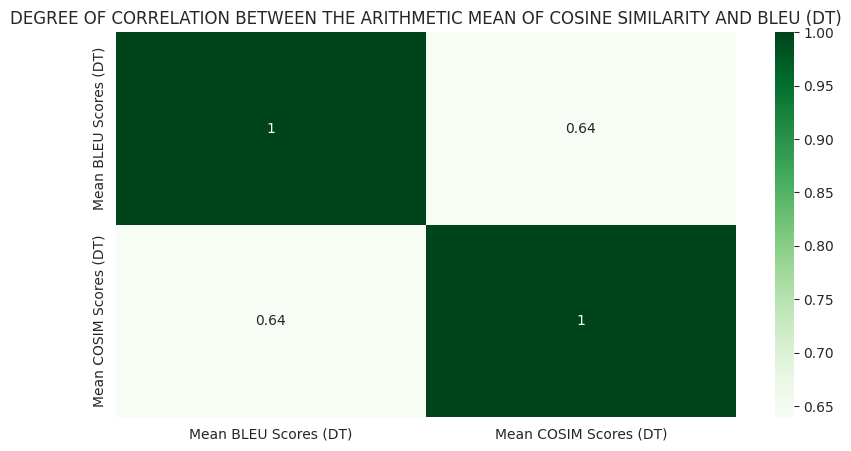

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


df = pd.DataFrame({'Mean BLEU Scores (DT)':[mean(x[1])for x in bleu_direct],
                   'Mean COSIM Scores (DT)': [mean(x[1])  for x in cosim_direct]}) #,
                  #  "scar_ranking" :[x[1] for x in scar_ranking ]})

plt.figure(figsize = (10, 5))
corr = df.corr(method = 'spearman')

sns.heatmap(corr, annot = True, cmap = "Greens")
plt.title("DEGREE OF CORRELATION BETWEEN THE ARITHMETIC MEAN OF COSINE SIMILARITY AND BLEU (DT)")
plt.show()

**PEARSON**

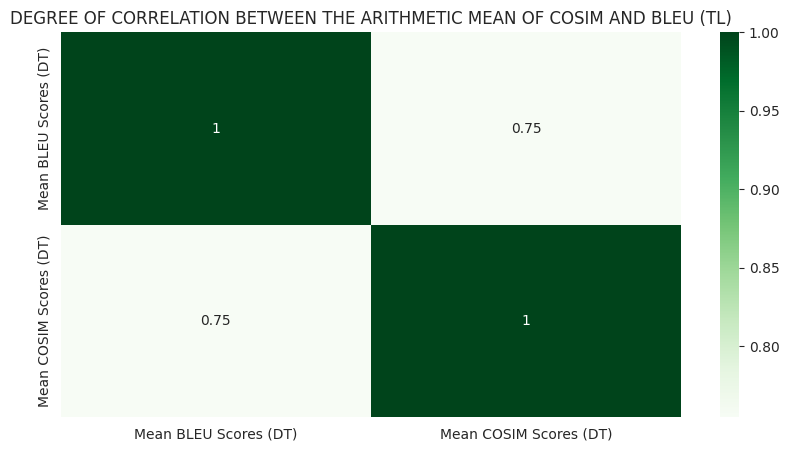

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


df = pd.DataFrame({'Mean BLEU Scores (DT)':[mean(x[1])for x in bleu_direct],
                   'Mean COSIM Scores (DT)': [mean(x[1])  for x in cosim_direct]}) #,
                  #  "scar_ranking" :[x[1] for x in scar_ranking ]})

plt.figure(figsize = (10, 5))
corr = df.corr(method = 'pearson')

sns.heatmap(corr, annot = True, cmap = "Greens")
plt.title("DEGREE OF CORRELATION BETWEEN THE ARITHMETIC MEAN OF COSIM AND BLEU (TL)")
plt.show()

**original vs. back-translation**

**SPEARMAN**

In [ ]:
#bleu_direct baf_direct: tl
from scipy.stats import spearmanr
correlation_scores= []
for i, (bleu_score, baf_score) in enumerate(zip(bleu_back , cosim_back)):


  bleu_score_back = bleu_back[i][1]
  cosim_score_back = cosim_back[i][1]
  lang_ids = bleu_back[i][0]

  
  s = spearmanr(bleu_score_back, cosim_score_back, axis=None)
  correlation_scores.extend((lang_ids, s))

correlation_scores

['EN-IT',
 SignificanceResult(statistic=0.6496136477720943, pvalue=2.4254395455655286e-220),
 'EN-ES',
 SignificanceResult(statistic=0.6411265702472967, pvalue=1.4934930927715426e-136),
 'EN-DA',
 SignificanceResult(statistic=0.6081540753391872, pvalue=2.5024776091406475e-232),
 'EN-CS',
 SignificanceResult(statistic=0.6547316850341341, pvalue=5.359760634057262e-274),
 'EN-DE',
 SignificanceResult(statistic=0.6667137755236137, pvalue=1.2529022043140797e-149),
 'EN-FI',
 SignificanceResult(statistic=0.6495483451917393, pvalue=8.253540079080627e-225),
 'EN-ET',
 SignificanceResult(statistic=0.6615792956084275, pvalue=6.319080560973951e-235),
 'EN-GA',
 SignificanceResult(statistic=0.7481325943276089, pvalue=1.4404e-319),
 'EN-FR',
 SignificanceResult(statistic=0.6428204683741712, pvalue=1.3732684845623827e-209),
 'EN-HU',
 SignificanceResult(statistic=0.6572946177127266, pvalue=1.0781803402092434e-234),
 'EN-MT',
 SignificanceResult(statistic=0.6394864630024839, pvalue=1.6487492253405902

**PEARSON**

<ipython-input-46-3fa3b85ee46d>:17: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


<ipython-input-46-3fa3b85ee46d>:18: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


<ipython-input-46-3fa3b85ee46d>:17: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use

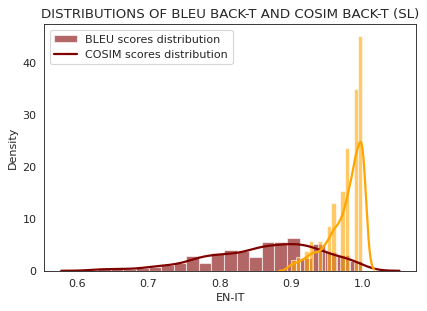

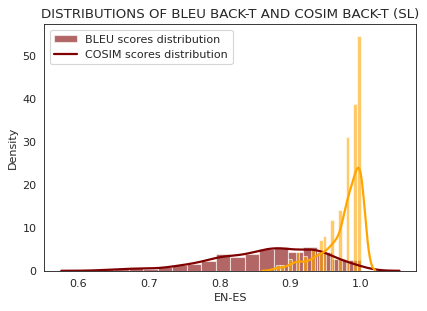

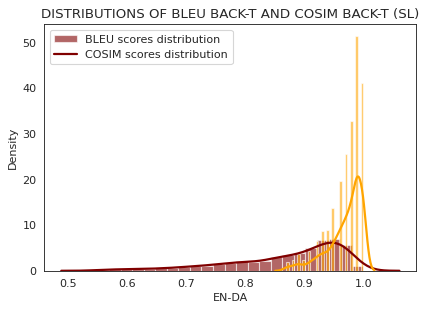

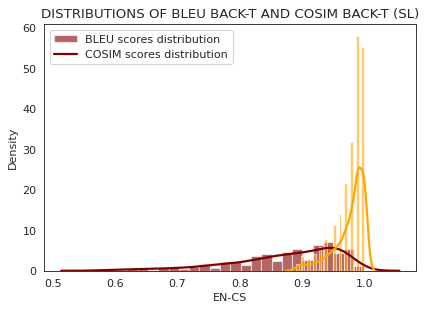

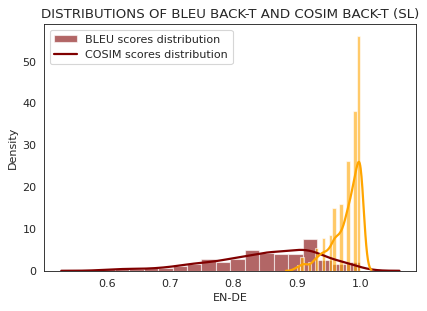

...

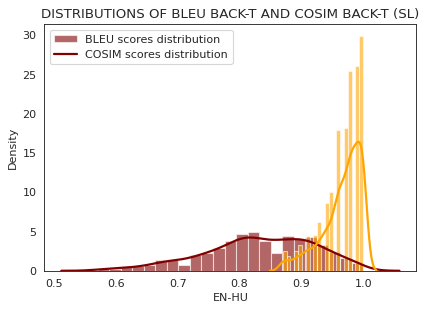

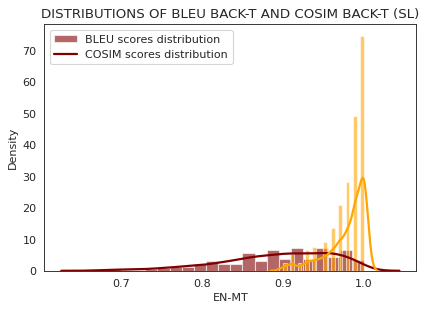

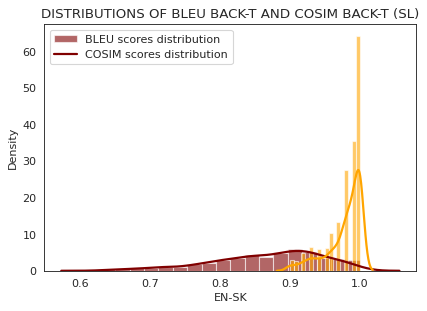

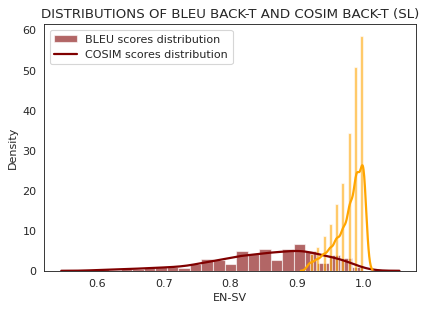

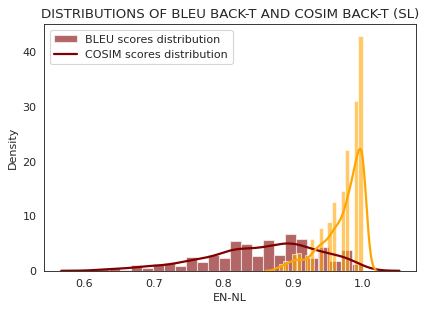

In [ ]:
import seaborn as sns
sns.set_style("white")


# figure, axis = plt.subplots(2, 2)

for i, (bleu_, cosim ) in enumerate(zip(bleu_back, cosim_back)):
  x1 = bleu_back[i][1]
  x2 = cosim_back[i][1]
  lang_id = bleu_direct[i][0]

  # Plot

  kwargs = dict(hist_kws={'alpha':.6}, kde_kws={'linewidth':2})

  plt.figure(figsize=(6,4), dpi= 80)
  sns.distplot(x1, color="maroon", label="Compact", **kwargs)
  sns.distplot(x2, color="orange", label="SUV", **kwargs)
  plt.title("DISTRIBUTIONS OF BLEU BACK-T AND COSIM BACK-T (SL)")
  plt.legend(["BLEU scores distribution", "COSIM scores distribution"])
  plt.xlabel(lang_id)


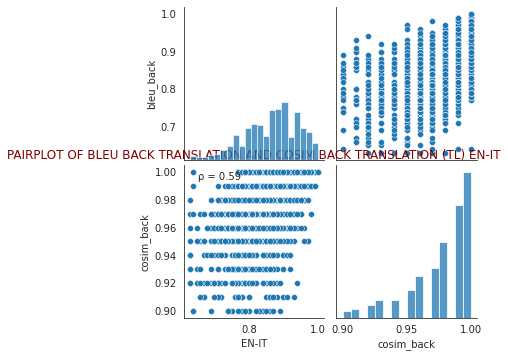

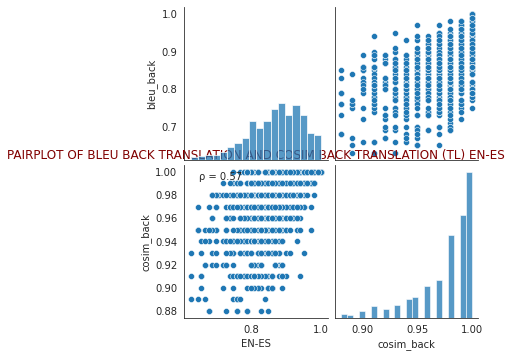

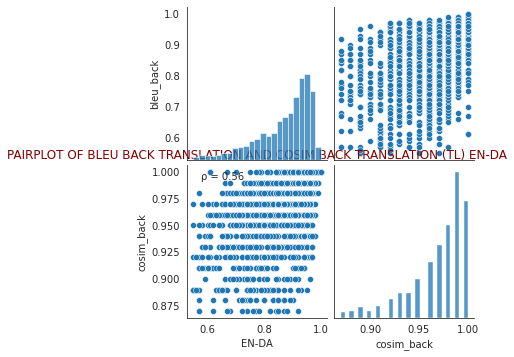

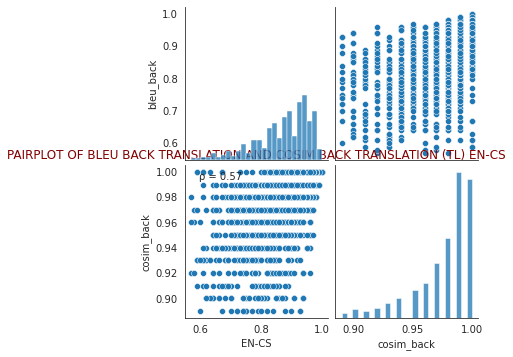

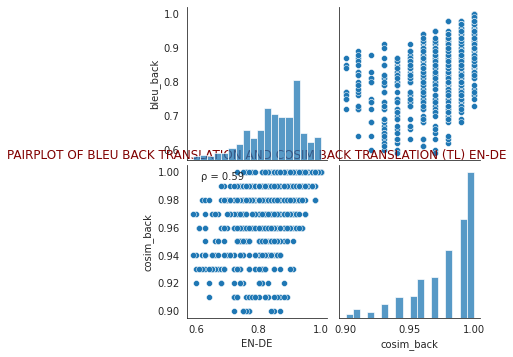

...

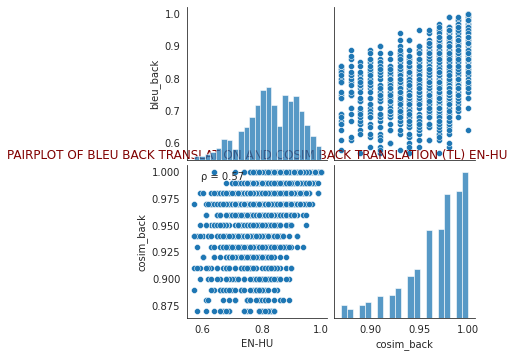

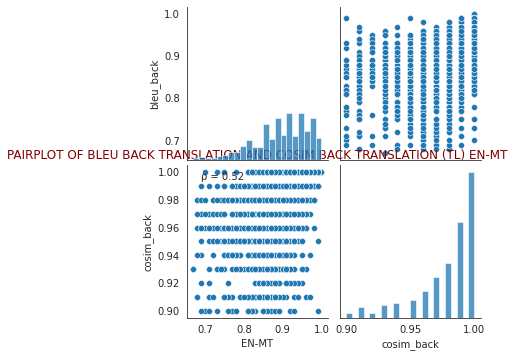

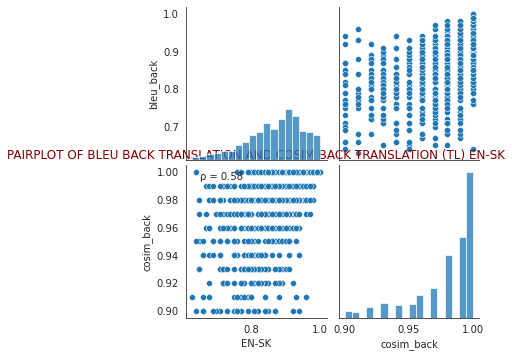

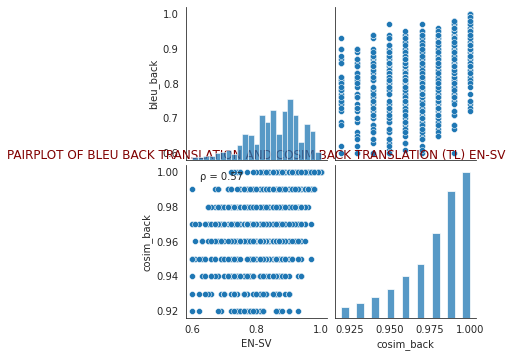

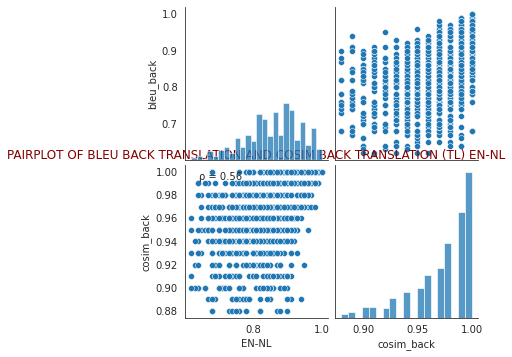

In [ ]:
for i, (bleu_score, baf_score) in enumerate(zip(bleu_back, cosim_back)):
  # fig, axes = plt.subplots(2, len(bleu_back))
  bleu_score_back = bleu_back[i][1]
  cosim_score_back = cosim_back[i][1]
  lang_id = bleu_back[i][0]

  df_ = pd.DataFrame({"bleu_back": [s for s in bleu_score_back], "cosim_back": [s for s in cosim_score_back]})

  g = sns.pairplot(df_)
  g.map_lower(corrfunc)
  plt.title(f"PAIRPLOT OF BLEU BACK TRANSLATION AND COSIM BACK TRANSLATION (TL) {lang_id}", color = "maroon")

  plt.xlabel(lang_id)
  plt.show()

In [ ]:
#bleu_direct baf_direct: tl
from scipy.stats import spearmanr
correlation_scores= []
for i, (bleu_score, baf_score) in enumerate(zip(bleu_back , cosim_back)):


  bleu_score_back = bleu_back[i][1]
  cosim_score_back = cosim_back[i][1]
  lang_ids = bleu_back[i][0]

  
  s = pearsonr(bleu_score_back, cosim_score_back)
  correlation_scores.extend((lang_ids, s))

correlation_scores

['EN-IT',
 (0.5948422811980891, 5.871199295345127e-176),
 'EN-ES',
 (0.5669005218600845, 1.588012690450777e-100),
 'EN-DA',
 (0.5600128266500444, 1.039186376679372e-189),
 'EN-CS',
 (0.5748750984898094, 5.715573673482653e-197),
 'EN-DE',
 (0.5943927496571971, 1.8864113896104923e-111),
 'EN-FI',
 (0.5840368305256187, 1.2471475507708014e-171),
 'EN-ET',
 (0.5826465286107991, 8.070444112993929e-170),
 'EN-GA',
 (0.6213946407152822, 5.807878168760197e-191),
 'EN-FR',
 (0.5876291886757681, 5.846509262505019e-167),
 'EN-HU',
 (0.5705613018448945, 5.001360913827311e-164),
 'EN-MT',
 (0.5246779857526989, 6.1938569452738185e-161),
 'EN-SK',
 (0.5786335303320334, 1.059927446332362e-105),
 'EN-SV',
 (0.5740089671855103, 3.8502092203120314e-157),
 'EN-NL',
 (0.5607473883665227, 6.458696697983628e-156)]

**SPEARMAN**

In [ ]:
import plotly.express as px
df = pd.DataFrame({"Mean BLEU Scores (RTT)": [mean(x[1]) for x in bleu_back], "Mean Ccosine Similarity Scores (RTT)": [mean(x[1]) for x in cosim_back], "DATASET": lang_id})
fig = px.line(df, x='DATASET', y=['Mean BLEU Scores (RTT)', 'Mean Ccosine Similarity Scores (RTT)'],  markers=True, title = "SCATTER PLOT OF THE ARITHMETIC MEAN OF COSINE SIMILARITY AND BLEU METRICS (RTT)" )

fig.show()

SignificanceResult(statistic=0.5912087912087912, pvalue=0.025970813668962523)


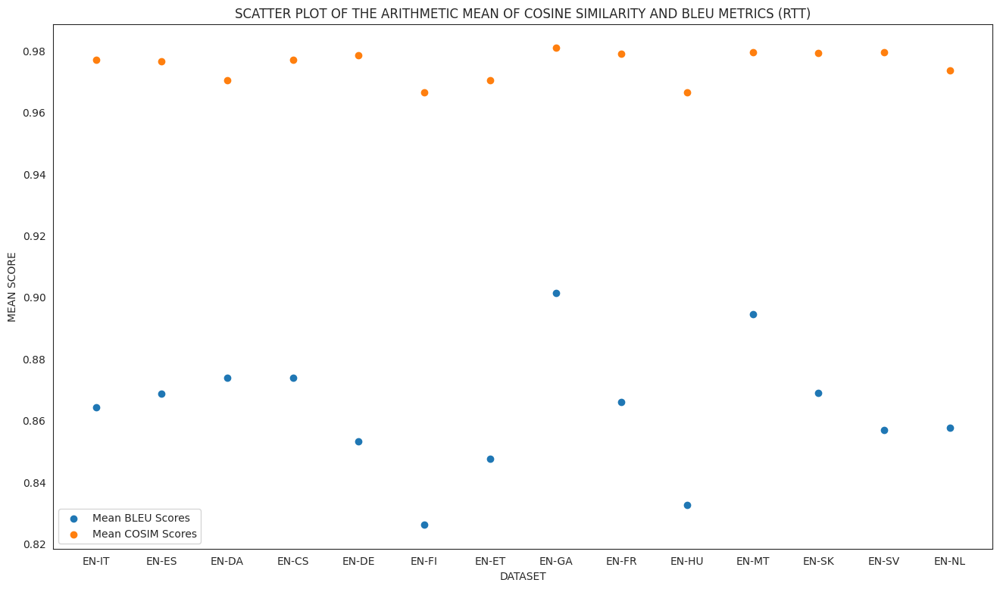

In [ ]:
from scipy.stats import spearmanr

s = spearmanr([mean(x[1]) for x in bleu_back], [mean(x[1]) for x in cosim_back], axis=None)
print(s)
from matplotlib import pyplot
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize = (16, 9))
pyplot.scatter([x[0] for x in bleu_back], [mean(x[1])for x in bleu_back])
pyplot.scatter([x[0] for x in cosim_back], [mean(x[1])  for x in cosim_back])
# pyplot.scatter([x[0] for x in mean_scar_ranking], [x[1] for x in mean_scar_ranking])
plt.xlabel("DATASET")
plt.ylabel("MEAN SCORE")
plt.title('SCATTER PLOT OF THE ARITHMETIC MEAN OF COSINE SIMILARITY AND BLEU METRICS (RTT)')
plt.legend(['Mean BLEU Scores', "Mean COSIM Scores"]) #, "scar bleu ranking"])
plt.show()

**PEARSON**

(0.7366001631090013, 0.00265816059173057)


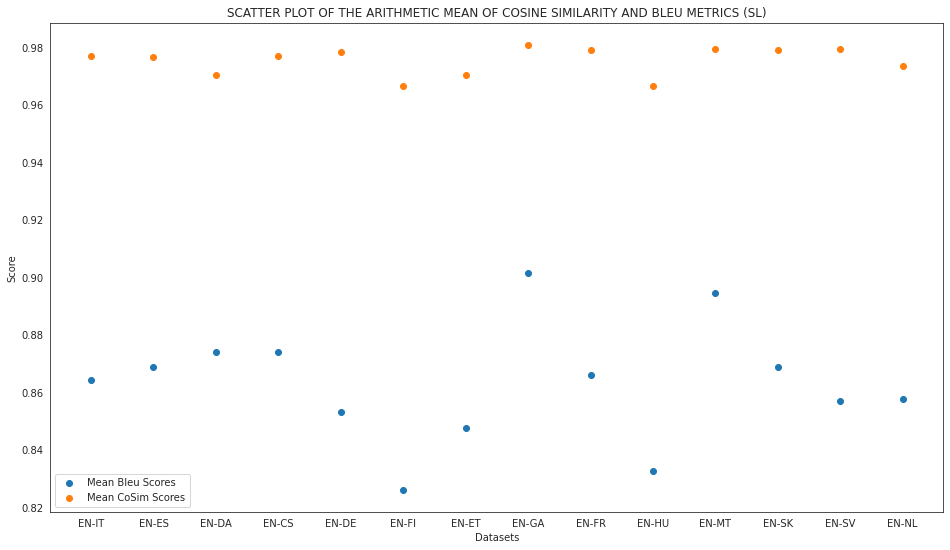

In [ ]:
from scipy.stats import spearmanr

s = pearsonr([mean(x[1]) for x in bleu_back], [mean(x[1]) for x in cosim_back])
print(s)
from matplotlib import pyplot
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize = (16, 9))
pyplot.scatter([x[0] for x in bleu_back], [mean(x[1])for x in bleu_back])
pyplot.scatter([x[0] for x in cosim_back], [mean(x[1])  for x in cosim_back])
# pyplot.scatter([x[0] for x in mean_scar_ranking], [x[1] for x in mean_scar_ranking])
plt.xlabel("Datasets")
plt.ylabel("Score")
plt.title('SCATTER PLOT OF THE ARITHMETIC MEAN OF COSINE SIMILARITY AND BLEU METRICS (SL)')
plt.legend(['Mean Bleu Scores', "Mean CoSim Scores"]) #, "scar bleu ranking"])
plt.show()

**SPEARMAN**

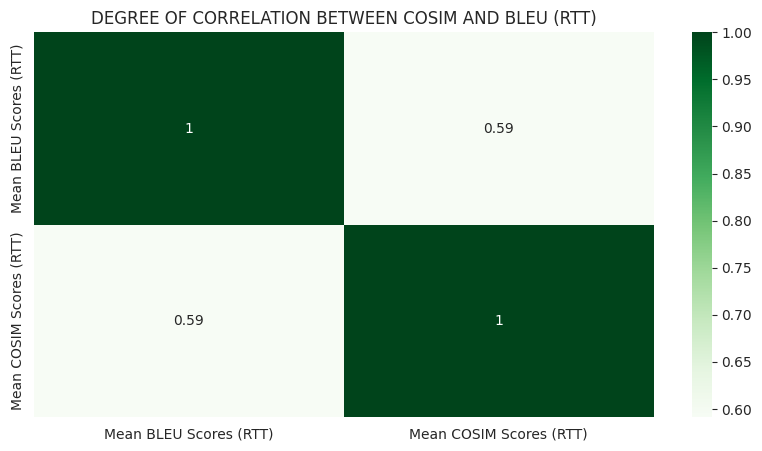

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


df = pd.DataFrame({'Mean BLEU Scores (RTT)':[mean(x[1])for x in bleu_back],
                   'Mean COSIM Scores (RTT)': [mean(x[1])  for x in cosim_back]}) #,
                  #  "scar_ranking" :[x[1] for x in scar_ranking ]})

plt.figure(figsize = (10, 5))
corr = df.corr(method = 'spearman')

sns.heatmap(corr, annot = True, cmap = "Greens")
plt.title("DEGREE OF CORRELATION BETWEEN COSIM AND BLEU (RTT)")
plt.show()

**PEARSON**

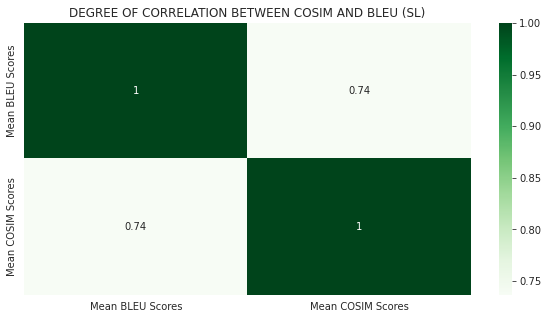

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


df = pd.DataFrame({'Mean BLEU Scores':[mean(x[1])for x in bleu_back],
                   'Mean COSIM Scores': [mean(x[1])  for x in cosim_back]}) #,
                  #  "scar_ranking" :[x[1] for x in scar_ranking ]})

plt.figure(figsize = (10, 5))
corr = df.corr(method = 'pearson')

sns.heatmap(corr, annot = True, cmap = "Greens")
plt.title("DEGREE OF CORRELATION BETWEEN COSIM AND BLEU (SL)")
plt.show()

**LEXSEM metric (SL)**

**SPEARMAN**

In [ ]:
#SUM BLEU COSIM SL / 2

#filter bleu and cosim scores and save them into a list: each list will have 14 lists of cosim and ble scores
bl_ = []
cos_ = []
lang_ids =[]
for i,(bleu, baf) in enumerate(zip(bleu_back, cosim_back)):
  bl_.append(bleu_back[i][1])
  cos_.append(cosim_back[i][1])
  lang_ids.append(bleu_back[i][0])


scores_bleu = []
scores_cosim = []



for i, (x, y) in enumerate(zip(bl_, cos_)):
  scores_bleu.append(bl_[i][0:])  #try it bl_[i]
  scores_cosim.append(cos_[i][0:])


#WE END UP WITH 14 TUPLES OF TWO LISTS. WE NEED TO SUM THE SCORES  OF EVERY TWO LISTS IN TUPLE AND DIVIDE BY 2

f_ = []
for score1, score2 in zip(scores_bleu,scores_cosim):
  f_.append((score1, score2))


#WE NEED TO COMPUTE THE SUM OF BOTH METRICS
def compute_(tup_):
  BAF_S = []
  for el_ in tup_:
    x = tup_[0]
    y = tup_[1]
  for (a, b) in zip(x,y):
    c = (a+b)/2
    BAF_S.append(round(c, 2))

  return BAF_S

# BAFSCORE : COMPUTE THE SUM/2 :
baf_score = [compute_(tuple_) for tuple_ in f_]
lang_sum = [(c,d) for c, d in zip(lang_ids, baf_score)] #(language id, sum) 


#COMPUTE CORRELATION BETWEEN BAFSCORES AND BLEU
from scipy.stats import spearmanr, pearsonr

correlation_scores = []
for i, (bleu_s, baf_s) in enumerate(zip(bleu_back, lang_sum)):


  bleu_scores = bleu_back[i][1]
  baf_scores = lang_sum[i][1]
  lang_ids = bleu_back[i][0]

  
  s = spearmanr(bleu_scores, baf_scores, axis=None)
  correlation_scores.extend((lang_ids, s))

correlation_scores

['EN-IT',
 SignificanceResult(statistic=0.975621185709847, pvalue=0.0),
 'EN-ES',
 SignificanceResult(statistic=0.9705444014255241, pvalue=0.0),
 'EN-DA',
 SignificanceResult(statistic=0.9631923240534139, pvalue=0.0),
 'EN-CS',
 SignificanceResult(statistic=0.9759491716011348, pvalue=0.0),
 'EN-DE',
 SignificanceResult(statistic=0.9803011708576511, pvalue=0.0),
 'EN-FI',
 SignificanceResult(statistic=0.9746630918670438, pvalue=0.0),
 'EN-ET',
 SignificanceResult(statistic=0.9728849085226368, pvalue=0.0),
 'EN-GA',
 SignificanceResult(statistic=0.9797683050101758, pvalue=0.0),
 'EN-FR',
 SignificanceResult(statistic=0.9782948113138987, pvalue=0.0),
 'EN-HU',
 SignificanceResult(statistic=0.9712775677137547, pvalue=0.0),
 'EN-MT',
 SignificanceResult(statistic=0.9665294550183917, pvalue=0.0),
 'EN-SK',
 SignificanceResult(statistic=0.9750004790243814, pvalue=0.0),
 'EN-SV',
 SignificanceResult(statistic=0.9799295543322991, pvalue=0.0),
 'EN-NL',
 SignificanceResult(statistic=0.9704558055

**PEARSON**

<ipython-input-51-b178333b46ec>:17: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


<ipython-input-51-b178333b46ec>:18: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


<ipython-input-51-b178333b46ec>:17: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use

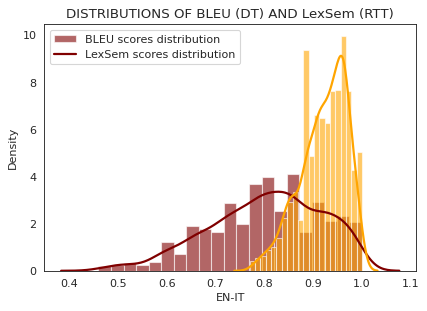

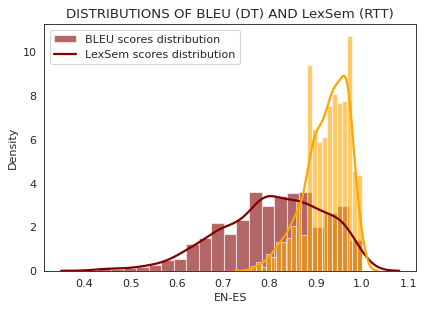

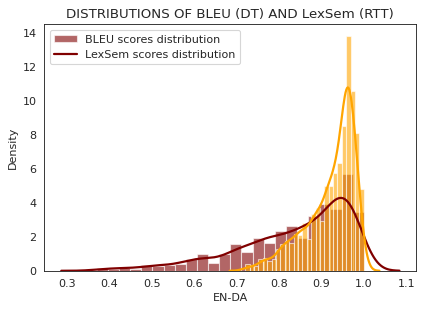

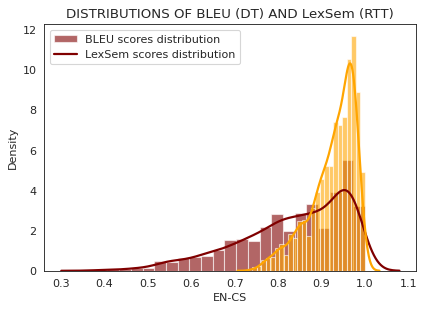

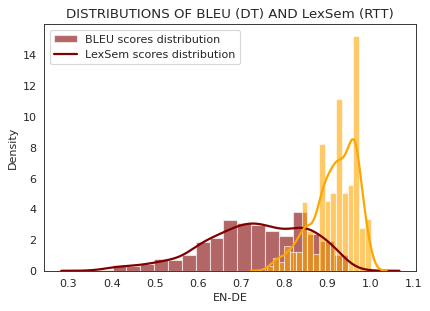

...

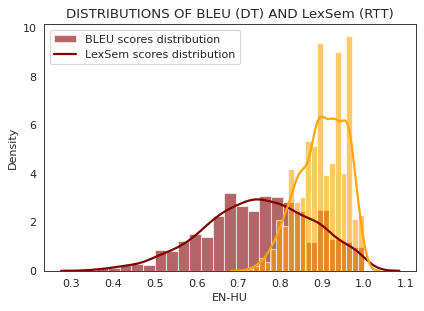

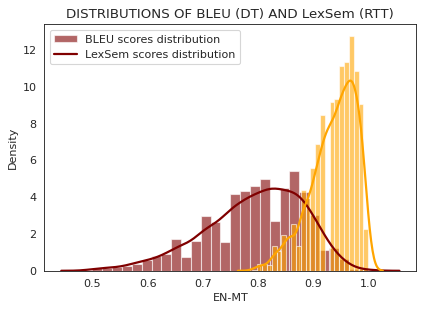

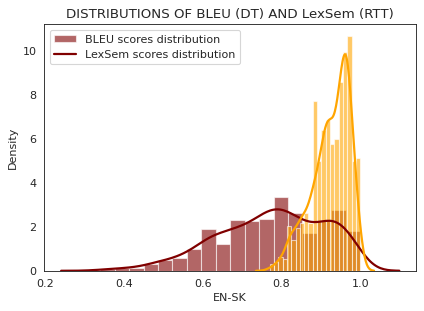

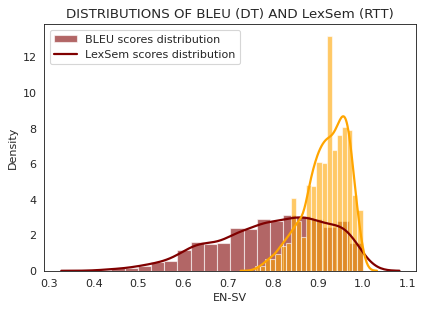

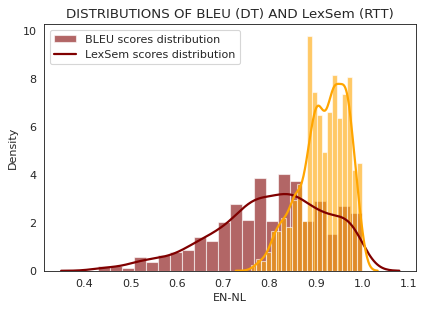

In [ ]:
import seaborn as sns
sns.set_style("white")


# figure, axis = plt.subplots(2, 2)

for i, (bleu_, cosim ) in enumerate(zip(bleu_back, lang_sum)):
  x1 = bleu_direct[i][1]
  x2 = lang_sum[i][1]
  lang_id = bleu_direct[i][0]

  # Plot

  kwargs = dict(hist_kws={'alpha':.6}, kde_kws={'linewidth':2})

  plt.figure(figsize=(6,4), dpi= 80)
  sns.distplot(x1, color="maroon", label="Compact", **kwargs)
  sns.distplot(x2, color="orange", label="SUV", **kwargs)
  plt.title("DISTRIBUTIONS OF BLEU (DT) AND LexSem (RTT)")
  plt.legend(["BLEU scores distribution", "LexSem scores distribution"])
  plt.xlabel(lang_id)


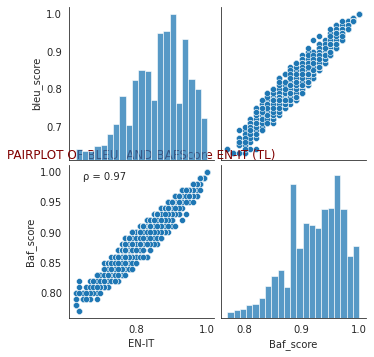

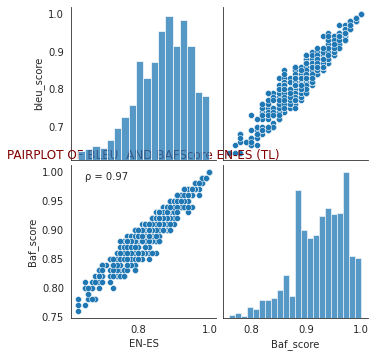

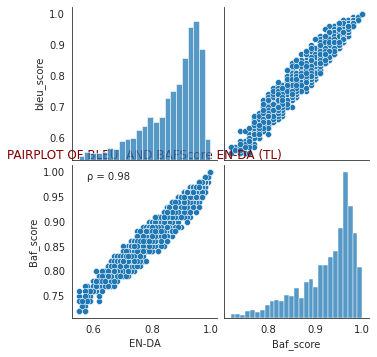

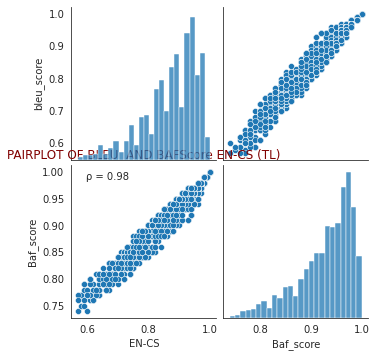

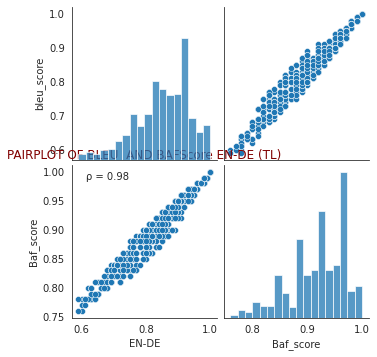

...

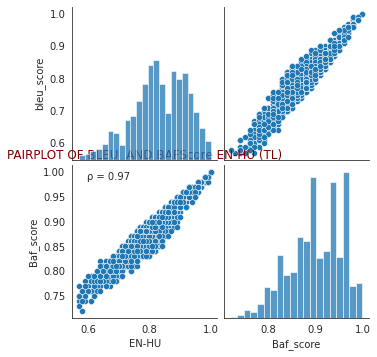

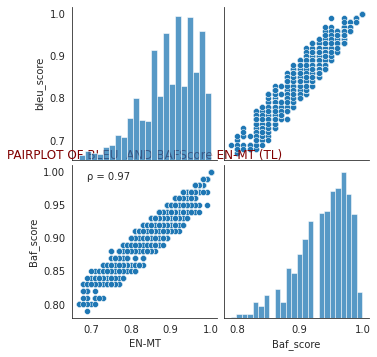

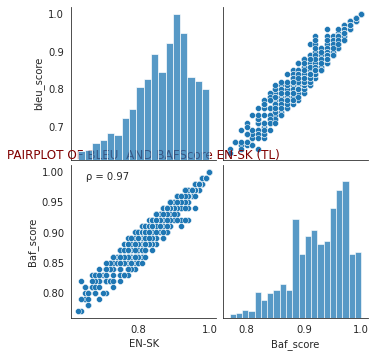

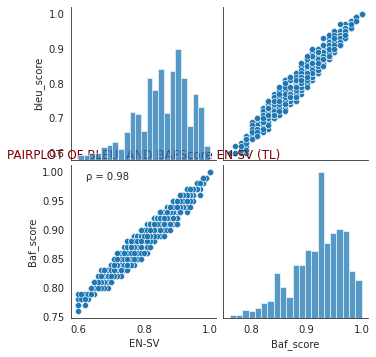

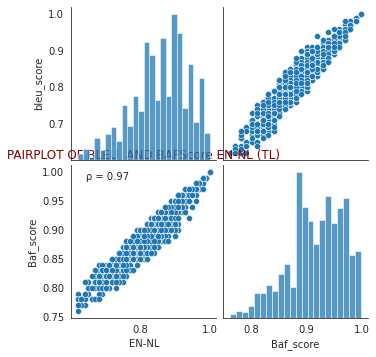

In [ ]:
for i, (bleu_score, baf_score) in enumerate(zip(bleu_back ,baf_scores)):
  #fig, axes = plt.subplots(2, len(bleu_back))
  b_score = bleu_back[i][1]
  c_score = lang_sum[i][1]
  lang_id = bleu_back[i][0]

  df_ = pd.DataFrame({"bleu_score": [s for s in b_score], "Baf_score": [s for s in c_score]})

  g = sns.pairplot(df_)
  g.map_lower(corrfunc)
  plt.title(f"PAIRPLOT OF BLEU  AND BAFScore {lang_id} (TL)", color = "maroon")

  plt.xlabel(lang_id)
  plt.show()

In [ ]:
#SUM BLEU COSIM SL / 2

#filter bleu and cosim scores and save them into a list: each list will have 14 lists of cosim and ble scores
bl_ = []
cos_ = []
lang_ids =[]
for i,(bleu, baf) in enumerate(zip(bleu_back, cosim_back)):
  bl_.append(bleu_back[i][1])
  cos_.append(cosim_back[i][1])
  lang_ids.append(bleu_back[i][0])


scores_bleu = []
scores_cosim = []



for i, (x, y) in enumerate(zip(bl_, cos_)):
  scores_bleu.append(bl_[i][0:])  #try it bl_[i]
  scores_cosim.append(cos_[i][0:])


#WE END UP WITH 14 TUPLES OF TWO LISTS. WE NEED TO SUM THE SCORES  OF EVERY TWO LISTS IN TUPLE AND DIVIDE BY 2

f_ = []
for score1, score2 in zip(scores_bleu,scores_cosim):
  f_.append((score1, score2))


#WE NEED TO COMPUTE THE SUM OF BOTH METRICS
def compute_(tup_):
  BAF_S = []
  for el_ in tup_:
    x = tup_[0]
    y = tup_[1]
  for (a, b) in zip(x,y):
    c = (a+b)/2
    BAF_S.append(round(c, 2))

  return BAF_S

# BAFSCORE : COMPUTE THE SUM/2 :
baf_score = [compute_(tuple_) for tuple_ in f_]
lang_sum = [(c,d) for c, d in zip(lang_ids, baf_score)] #(language id, sum) 


#COMPUTE CORRELATION BETWEEN BAFSCORES AND BLEU
from scipy.stats import spearmanr, pearsonr

correlation_scores = []
for i, (bleu_s, baf_s) in enumerate(zip(bleu_back, lang_sum)):


  bleu_scores = bleu_back[i][1]
  baf_scores = lang_sum[i][1]
  lang_ids = bleu_back[i][0]

  
  s = pearsonr(bleu_scores, baf_scores)
  correlation_scores.extend((lang_ids, s))

correlation_scores

['EN-IT',
 PearsonRResult(statistic=0.9732026294428545, pvalue=0.0),
 'EN-ES',
 PearsonRResult(statistic=0.9664207021413278, pvalue=0.0),
 'EN-DA',
 PearsonRResult(statistic=0.9750335252855296, pvalue=0.0),
 'EN-CS',
 PearsonRResult(statistic=0.9778833908022367, pvalue=0.0),
 'EN-DE',
 PearsonRResult(statistic=0.9787539560206274, pvalue=0.0),
 'EN-FI',
 PearsonRResult(statistic=0.9729309588126407, pvalue=0.0),
 'EN-ET',
 PearsonRResult(statistic=0.9720186896424974, pvalue=0.0),
 'EN-GA',
 PearsonRResult(statistic=0.9745550628889998, pvalue=0.0),
 'EN-FR',
 PearsonRResult(statistic=0.9796984476836602, pvalue=0.0),
 'EN-HU',
 PearsonRResult(statistic=0.968655365092436, pvalue=0.0),
 'EN-MT',
 PearsonRResult(statistic=0.9651833479154937, pvalue=0.0),
 'EN-SK',
 PearsonRResult(statistic=0.9718906123207921, pvalue=0.0),
 'EN-SV',
 PearsonRResult(statistic=0.9806294773762458, pvalue=0.0),
 'EN-NL',
 PearsonRResult(statistic=0.9682282837915046, pvalue=0.0)]

**SPEARMAN**

SignificanceResult(statistic=0.6571428571428571, pvalue=0.010661967747329804)


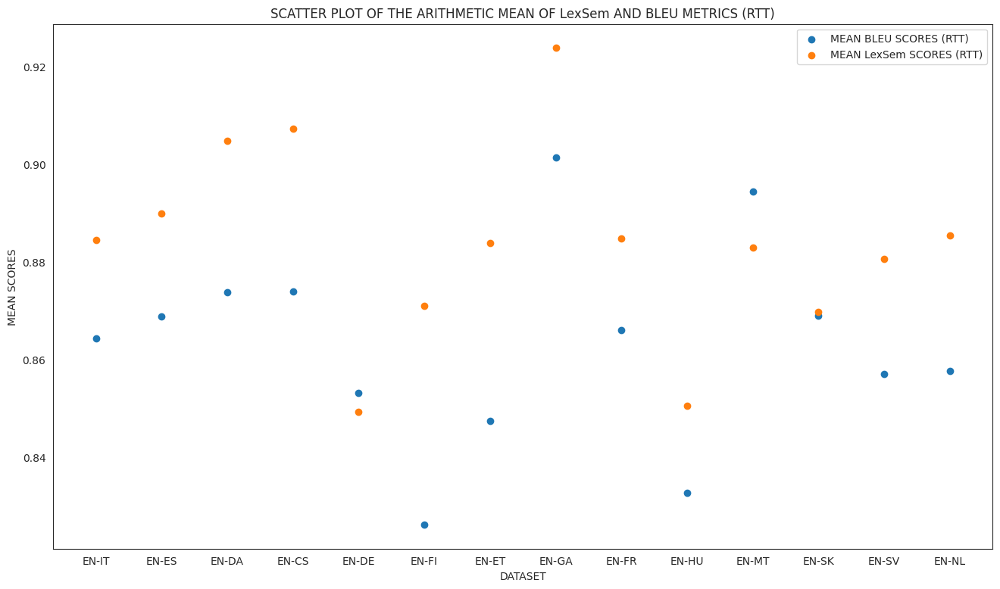

In [ ]:
from scipy.stats import spearmanr

s = spearmanr([mean(x[1]) for x in bleu_back], [mean(x[1]) for x in lang_sum], axis=None)
print(s)
from matplotlib import pyplot
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize = (16, 9))
pyplot.scatter([x[0] for x in bleu_back], [mean(x[1])for x in bleu_back])
pyplot.scatter([x[0] for x in bleu_back], [mean(x)  for x in baf_score])
# pyplot.scatter([x[0] for x in mean_scar_ranking], [x[1] for x in mean_scar_ranking])
plt.xlabel("DATASET")
plt.ylabel("MEAN SCORES")
plt.title('SCATTER PLOT OF THE ARITHMETIC MEAN OF LexSem AND BLEU METRICS (RTT)')
plt.legend(['MEAN BLEU SCORES (RTT)', "MEAN LexSem SCORES (RTT)"]) #, "scar bleu ranking"])
plt.show()

**PEARSON**

(0.9863296583025498, 9.149806419596974e-11)


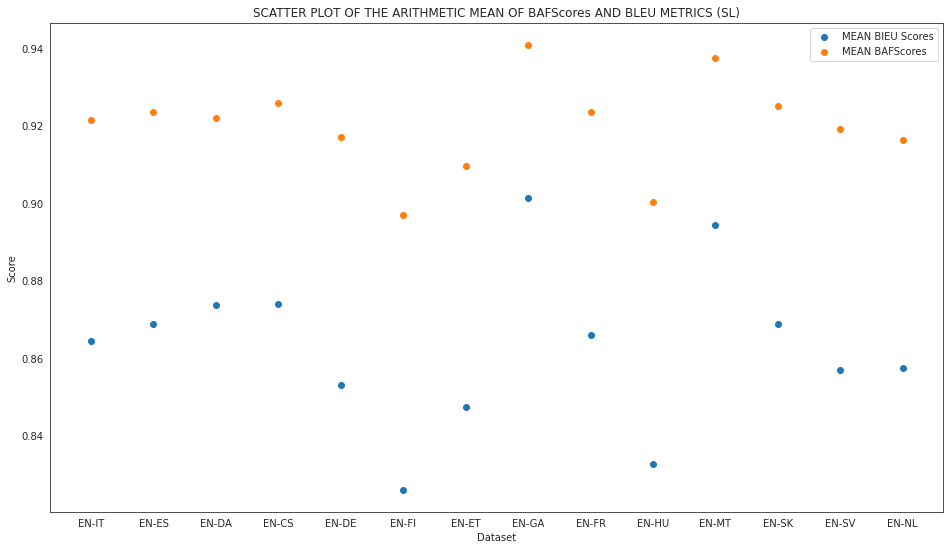

In [ ]:
from scipy.stats import spearmanr

s = pearsonr([mean(x[1]) for x in bleu_back], [mean(x[1]) for x in lang_sum])
print(s)
from matplotlib import pyplot
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize = (16, 9))
pyplot.scatter([x[0] for x in bleu_back], [mean(x[1])for x in bleu_back])
pyplot.scatter([x[0] for x in bleu_back], [mean(x)  for x in baf_score])
# pyplot.scatter([x[0] for x in mean_scar_ranking], [x[1] for x in mean_scar_ranking])
plt.xlabel("Dataset")
plt.ylabel("Score")
plt.title('SCATTER PLOT OF THE ARITHMETIC MEAN OF BAFScores AND BLEU METRICS (SL)')
plt.legend(['MEAN BlEU Scores', "MEAN BAFScores"]) #, "scar bleu ranking"])
plt.show()

**SPEARMAN**

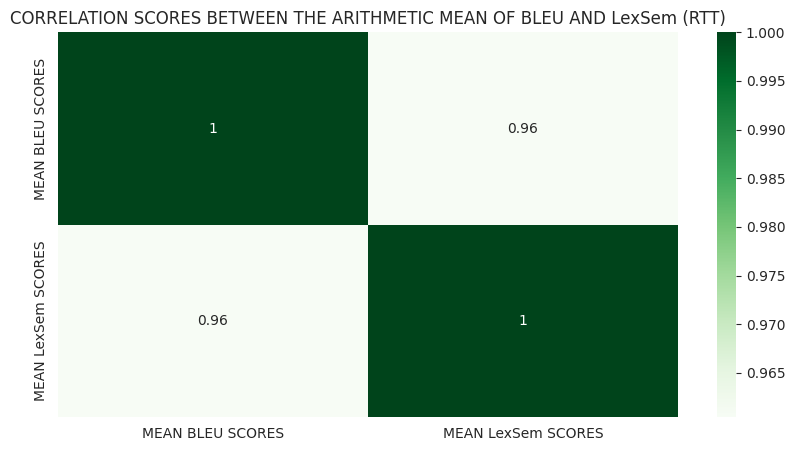

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt



df = pd.DataFrame({'MEAN BLEU SCORES': [mean(x[1]) for  x in bleu_back],
                   'MEAN LexSem SCORES': [mean(x[1]) for  x in lang_sum]}) #,
                  #  "scar_ranking" :[x[1] for x in scar_ranking ]})

plt.figure(figsize = (10, 5))
corr = df.corr(method = 'spearman')

sns.heatmap(corr, annot = True, cmap = "Greens")
plt.title("CORRELATION SCORES BETWEEN THE ARITHMETIC MEAN OF BLEU AND LexSem (RTT)")
plt.show()

**PEARSON**

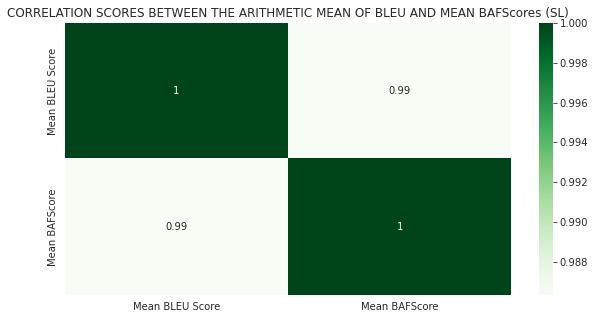

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt



df = pd.DataFrame({'Mean BLEU Score': [mean(x[1]) for  x in bleu_back],
                   'Mean BAFScore': [mean(x[1]) for  x in lang_sum]}) #,
                  #  "scar_ranking" :[x[1] for x in scar_ranking ]})

plt.figure(figsize = (10, 5))
corr = df.corr(method = 'pearson')

sns.heatmap(corr, annot = True, cmap = "Greens")
plt.title("CORRELATION SCORES BETWEEN THE ARITHMETIC MEAN OF BLEU AND MEAN BAFScores (SL)")
plt.show()

**BAFScore metrics (TL)**

**SPEARMAN**

In [ ]:
#SUM BLEU COSIM TL/ 2

#filter bleu and cosim scores and save them into a list: each list will have 14 lists of cosim and ble scores
bl_ = []
cos_ = []
lang_ids =[]
for i,(bleu, baf) in enumerate(zip(bleu_direct, cosim_direct)):
  bl_.append(bleu_direct[i][1])
  cos_.append(cosim_direct[i][1])
  lang_ids.append(bleu_direct[i][0])


scores_bleu = []
scores_cosim = []

for i, (x, y) in enumerate(zip(bl_, cos_)):
  scores_bleu.append(bl_[i][0:])  
  scores_cosim.append(cos_[i][0:])


#WE END UP WITH 14 TUPLES OF TWO LISTS. WE NEED TO SUM THE SCORES  OF EVERY TWO LISTS IN TUPLE AND DIVIDE BY 2

f_ = []
for score1, score2 in zip(scores_bleu,scores_cosim):
  f_.append((score1, score2))


#WE NEED TO COMPUTE THE SUM OF BOTH METRICS AND DIVIDE BY 2: BAFSCORE
def compute_(tup_):
  BAF_S = []
  for el_ in tup_:
    x = tup_[0]
    y = tup_[1]
  for (a, b) in zip(x,y):
    c = (a+b)/2
    BAF_S.append(round(c, 2))

  return BAF_S

# BAFSCORE : COMPUTE THE SUM/2 :
baf_score = [compute_(tuple_) for tuple_ in f_]
lang_sum = [(c,d) for c, d in zip(lang_ids, baf_score)] #(language id, sum) 


#COMPUTE CORRELATION BETWEEN BASCORES AND BLEU
from scipy.stats import spearmanr, pearsonr

correlation_scores = []
for i, (bleu_s, baf_s) in enumerate(zip(bleu_direct, lang_sum)):


  bleu_scores = bleu_direct[i][1]
  baf_scores = lang_sum[i][1]
  lang_ids = bleu_direct[i][0]

  
  s = spearmanr(bleu_scores, baf_scores, axis=None) #LEXSEM SCORE
  correlation_scores.extend((lang_ids, s))

correlation_scores

['EN-IT',
 SignificanceResult(statistic=0.9843488615909024, pvalue=0.0),
 'EN-ES',
 SignificanceResult(statistic=0.9844733873020473, pvalue=0.0),
 'EN-DA',
 SignificanceResult(statistic=0.9857123334786071, pvalue=0.0),
 'EN-CS',
 SignificanceResult(statistic=0.9911593488085005, pvalue=0.0),
 'EN-DE',
 SignificanceResult(statistic=0.9803520339105322, pvalue=0.0),
 'EN-FI',
 SignificanceResult(statistic=0.9903926520707501, pvalue=0.0),
 'EN-ET',
 SignificanceResult(statistic=0.987914866132309, pvalue=0.0),
 'EN-GA',
 SignificanceResult(statistic=0.9889489511659768, pvalue=0.0),
 'EN-FR',
 SignificanceResult(statistic=0.9749926003671141, pvalue=0.0),
 'EN-HU',
 SignificanceResult(statistic=0.9781576348440262, pvalue=0.0),
 'EN-MT',
 SignificanceResult(statistic=0.9727103856793671, pvalue=0.0),
 'EN-SK',
 SignificanceResult(statistic=0.988409450779875, pvalue=0.0),
 'EN-SV',
 SignificanceResult(statistic=0.982537748836317, pvalue=0.0),
 'EN-NL',
 SignificanceResult(statistic=0.983629571339

**PEARSON**

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function 

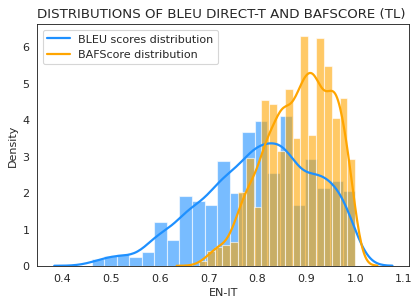

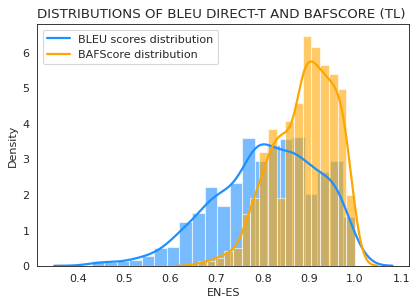

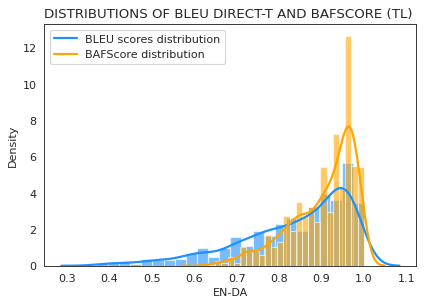

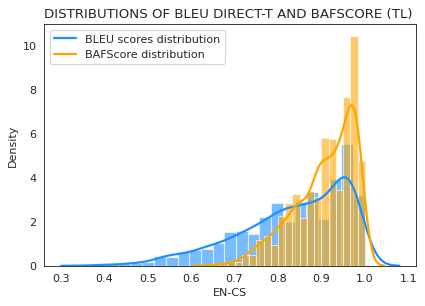

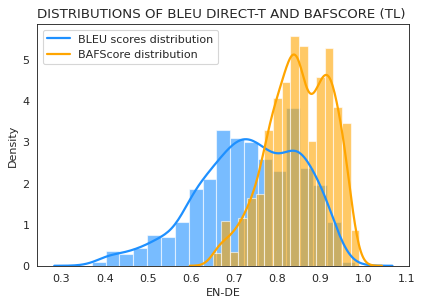

...

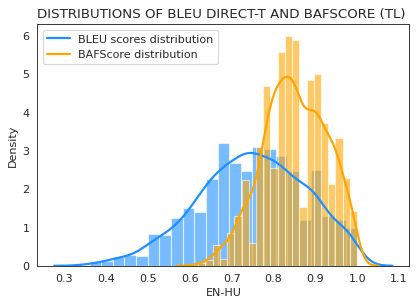

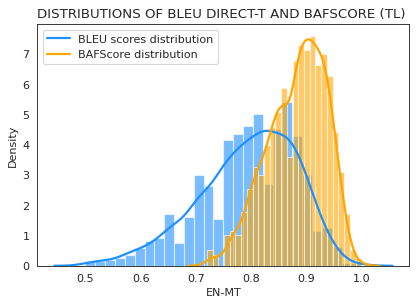

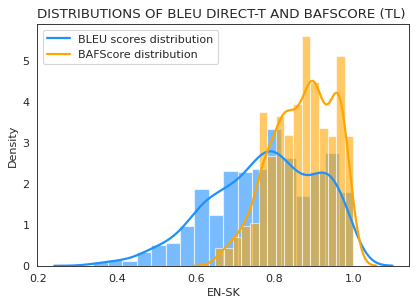

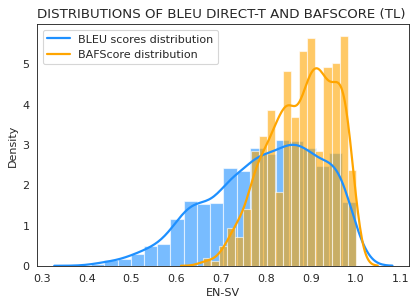

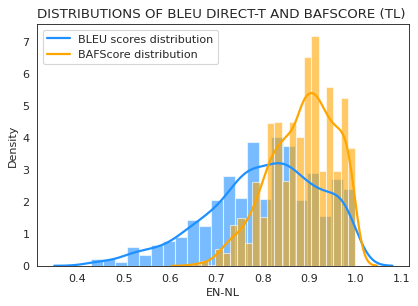

In [ ]:
import seaborn as sns
sns.set_style("white")


# figure, axis = plt.subplots(2, 2)

for i, (bleu_, cosim ) in enumerate(zip(bleu_direct, lang_sum)):
  x1 = bleu_direct[i][1]
  x2 = lang_sum[i][1]
  lang_id = bleu_direct[i][0]

  # Plot

  kwargs = dict(hist_kws={'alpha':.6}, kde_kws={'linewidth':2})

  plt.figure(figsize=(6,4), dpi= 80)
  sns.distplot(x1, color="dodgerblue", label="Compact", **kwargs)
  sns.distplot(x2, color="orange", label="SUV", **kwargs)
  plt.title("DISTRIBUTIONS OF BLEU DIRECT-T AND BAFSCORE (TL) ")
  plt.legend(["BLEU scores distribution", "BAFScore distribution"])
  plt.xlabel(lang_id)


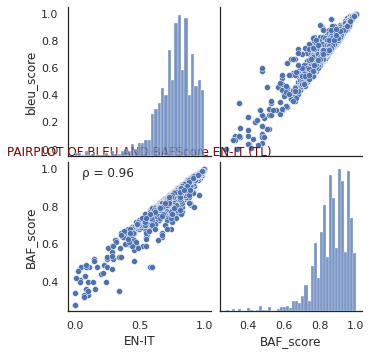

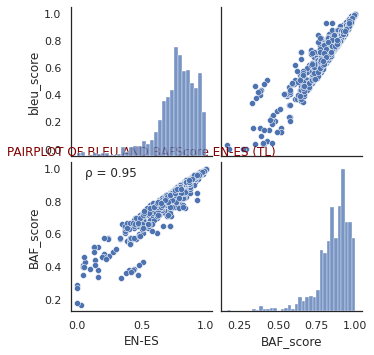

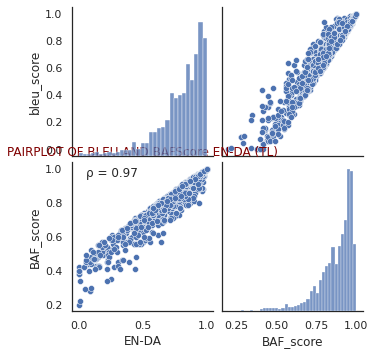

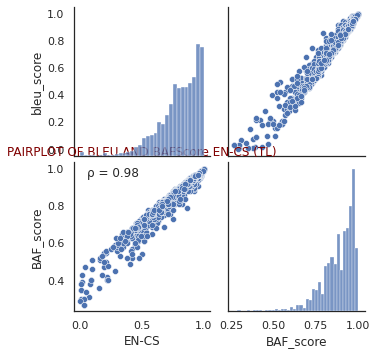

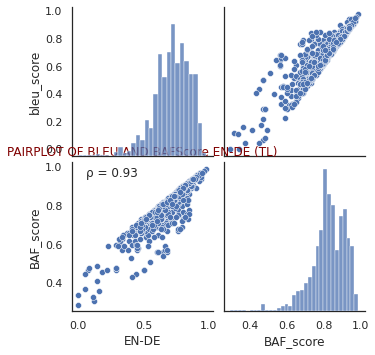

...

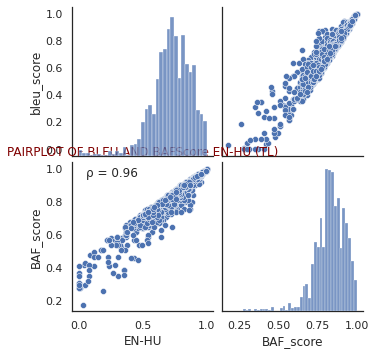

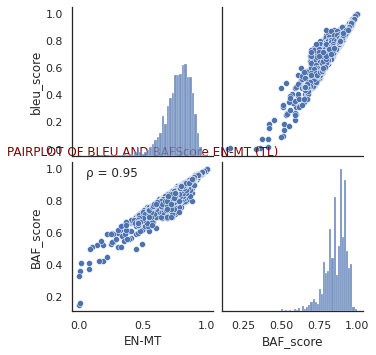

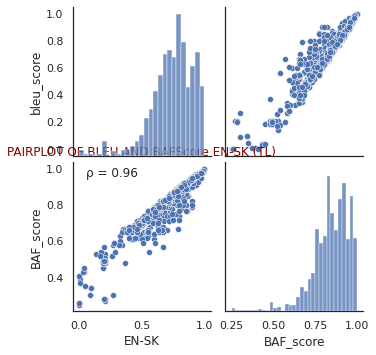

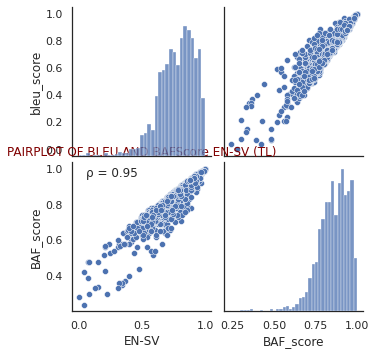

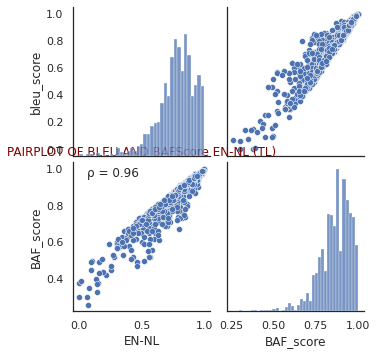

In [ ]:
for i, (bleu_score, baf_score) in enumerate(zip(bleu_direct ,lang_sum)):
  # fig, axes = plt.subplots(2, len(bleu_direct))
  b_score = bleu_direct[i][1]
  c_score = lang_sum[i][1]
  lang_id = bleu_direct[i][0]

  df_ = pd.DataFrame({"bleu_score": [s for s in b_score], "BAF_score": [s for s in c_score]})

  g = sns.pairplot(df_)
  g.map_lower(corrfunc)
  plt.title(f"PAIRPLOT OF BLEU AND BAFScore {lang_id} (TL)", color = "maroon")

  plt.xlabel(lang_id)
  plt.show()

In [ ]:
#SUM BLEU COSIM TL/ 2

#filter bleu and cosim scores and save them into a list: each list will have 14 lists of cosim and ble scores
bl_ = []
cos_ = []
lang_ids =[]
for i,(bleu, baf) in enumerate(zip(bleu_direct, cosim_direct)):
  bl_.append(bleu_direct[i][1])
  cos_.append(cosim_direct[i][1])
  lang_ids.append(bleu_direct[i][0])


scores_bleu = []
scores_cosim = []

for i, (x, y) in enumerate(zip(bl_, cos_)):
  scores_bleu.append(bl_[i][0:])  #try it bl_[i]
  scores_cosim.append(cos_[i][0:])


#WE END UP WITH 14 TUPLES OF TWO LISTS. WE NEED TO SUM THE SCORES  OF EVERY TWO LISTS IN TUPLE AND DIVIDE BY 2

f_ = []
for score1, score2 in zip(scores_bleu,scores_cosim):
  f_.append((score1, score2))


#WE NEED TO COMPUTE THE SUM OF BOTH METRICS AND DIVIDE BY 2: BAFSCORE
def compute_(tup_):
  BAF_S = []
  for el_ in tup_:
    x = tup_[0]
    y = tup_[1]
  for (a, b) in zip(x,y):
    c = (a+b)/2
    BAF_S.append(round(c, 2))

  return BAF_S

# BAFSCORE : COMPUTE THE SUM/2 :
baf_score = [compute_(tuple_) for tuple_ in f_]
lang_sum = [(c,d) for c, d in zip(lang_ids, baf_score)] #(language id, sum) 


#COMPUTE CORRELATION BETWEEN BASCORES AND BLEU
from scipy.stats import spearmanr, pearsonr

correlation_scores = []
for i, (bleu_s, baf_s) in enumerate(zip(bleu_direct, lang_sum)):


  bleu_scores = bleu_direct[i][1]
  baf_scores = lang_sum[i][1]
  lang_ids = bleu_direct[i][0]

  
  s = pearsonr(bleu_scores, baf_scores)
  correlation_scores.extend((lang_ids, s))

correlation_scores

['EN-IT',
 PearsonRResult(statistic=0.9839480990752738, pvalue=0.0),
 'EN-ES',
 PearsonRResult(statistic=0.9827183999557939, pvalue=0.0),
 'EN-DA',
 PearsonRResult(statistic=0.9875496738456332, pvalue=0.0),
 'EN-CS',
 PearsonRResult(statistic=0.9932241828800614, pvalue=0.0),
 'EN-DE',
 PearsonRResult(statistic=0.9804759594176906, pvalue=0.0),
 'EN-FI',
 PearsonRResult(statistic=0.99054384658821, pvalue=0.0),
 'EN-ET',
 PearsonRResult(statistic=0.987749799990289, pvalue=0.0),
 'EN-GA',
 PearsonRResult(statistic=0.9889989547974589, pvalue=0.0),
 'EN-FR',
 PearsonRResult(statistic=0.9742162623688313, pvalue=0.0),
 'EN-HU',
 PearsonRResult(statistic=0.979436271008651, pvalue=0.0),
 'EN-MT',
 PearsonRResult(statistic=0.9744215106510313, pvalue=0.0),
 'EN-SK',
 PearsonRResult(statistic=0.9872854908371413, pvalue=0.0),
 'EN-SV',
 PearsonRResult(statistic=0.9822487800212313, pvalue=0.0),
 'EN-NL',
 PearsonRResult(statistic=0.9839799081124059, pvalue=0.0)]

**SPEARMAN**

SignificanceResult(statistic=0.9648351648351648, pvalue=2.5304057544450237e-08)


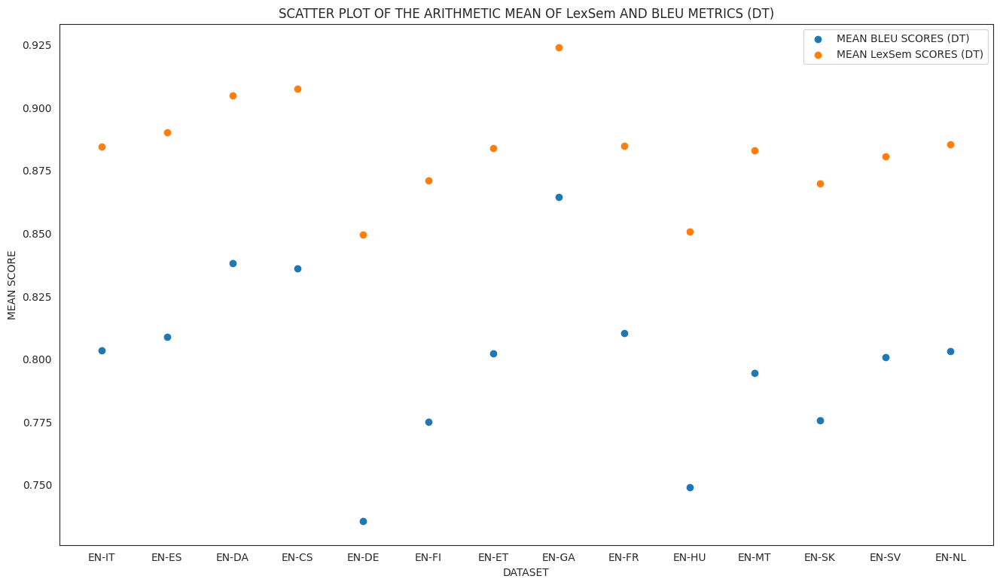

In [ ]:
from scipy.stats import spearmanr

s = spearmanr([mean(x[1]) for x in bleu_direct], [mean(x[1]) for x in lang_sum], axis=None)
print(s)
from matplotlib import pyplot
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize = (16, 9))
pyplot.scatter([x[0] for x in bleu_direct], [mean(x[1]) for x in bleu_direct])
pyplot.scatter([x[0] for x in bleu_direct], [mean(x[1])  for x in lang_sum])
# pyplot.scatter([x[0] for x in mean_scar_ranking], [x[1] for x in mean_scar_ranking])
plt.xlabel("DATASET")
plt.ylabel("MEAN SCORE")
plt.title('SCATTER PLOT OF THE ARITHMETIC MEAN OF LexSem AND BLEU METRICS (DT)')
plt.legend(['MEAN BLEU SCORES (DT)', "MEAN LexSem SCORES (DT)"]) #, "scar bleu ranking"])
plt.show()

**PEARSON**

(0.9919917390148709, 3.743318882930693e-12)


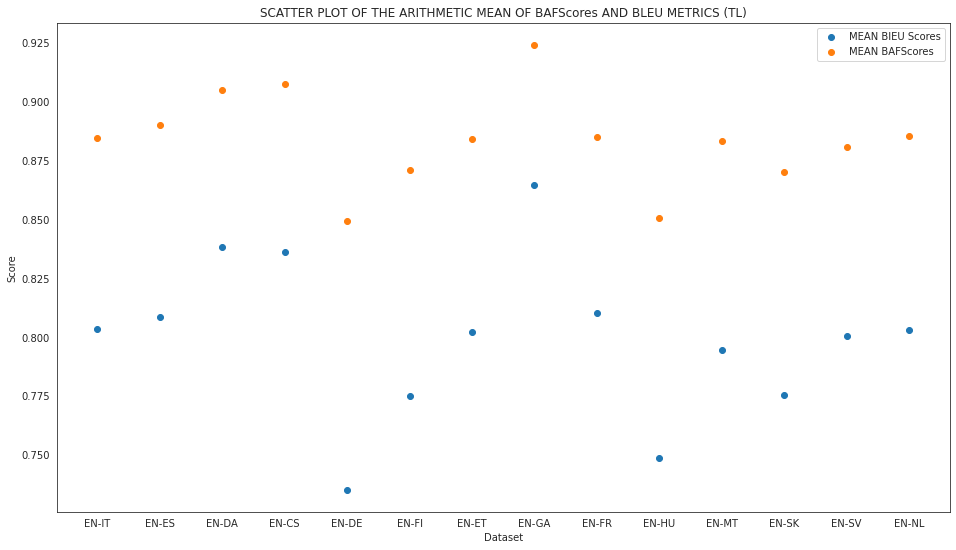

In [ ]:
from scipy.stats import spearmanr

s = pearsonr([mean(x[1]) for x in bleu_direct], [mean(x[1]) for x in lang_sum])
print(s)
from matplotlib import pyplot
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize = (16, 9))
pyplot.scatter([x[0] for x in bleu_direct], [mean(x[1]) for x in bleu_direct])
pyplot.scatter([x[0] for x in bleu_direct], [mean(x[1])  for x in lang_sum])
# pyplot.scatter([x[0] for x in mean_scar_ranking], [x[1] for x in mean_scar_ranking])
plt.xlabel("Dataset")
plt.ylabel("Score")
plt.title('SCATTER PLOT OF THE ARITHMETIC MEAN OF BAFScores AND BLEU METRICS (TL)')
plt.legend(['MEAN BlEU Scores', "MEAN BAFScores"]) #, "scar bleu ranking"])
plt.show()

**SPEARMAN**

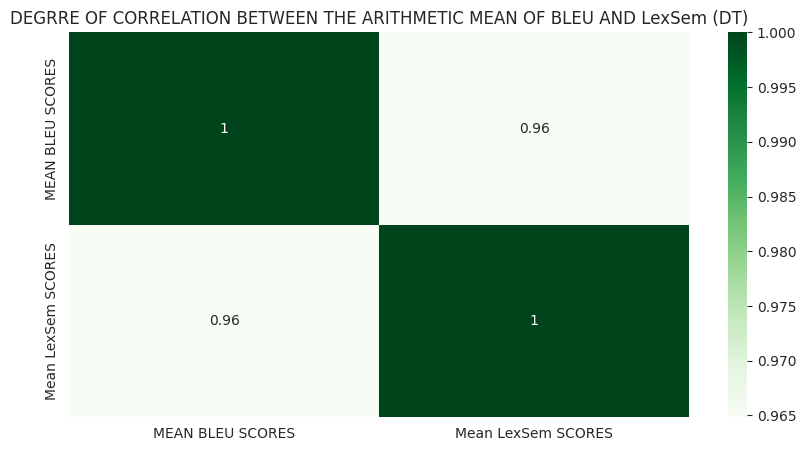

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt



df = pd.DataFrame({'MEAN BLEU SCORES': [mean(x[1]) for  x in bleu_direct],
                   'Mean LexSem SCORES': [mean(x[1]) for  x in lang_sum]}) #,
                  #  "scar_ranking" :[x[1] for x in scar_ranking ]})

plt.figure(figsize = (10, 5))
corr = df.corr(method = 'spearman')

sns.heatmap(corr, annot = True, cmap = "Greens")
plt.title("DEGRRE OF CORRELATION BETWEEN THE ARITHMETIC MEAN OF BLEU AND LexSem (DT)")
plt.show()

**PEARSON**

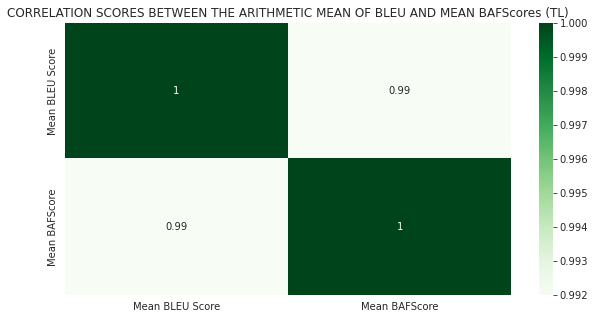

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt



df = pd.DataFrame({'Mean BLEU Score': [mean(x[1]) for  x in bleu_direct],
                   'Mean BAFScore': [mean(x[1]) for  x in lang_sum]}) #,
                  #  "scar_ranking" :[x[1] for x in scar_ranking ]})

plt.figure(figsize = (10, 5))
corr = df.corr(method = 'pearson')

sns.heatmap(corr, annot = True, cmap = "Greens")
plt.title("CORRELATION SCORES BETWEEN THE ARITHMETIC MEAN OF BLEU AND MEAN BAFScores (TL)")
plt.show()

# **T-TEST  AT A DATASET LEVEL**

**COSIM VS COSIM**

<ipython-input-59-09e9f32d1b6a>:17: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


<ipython-input-59-09e9f32d1b6a>:18: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


<ipython-input-59-09e9f32d1b6a>:17: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use

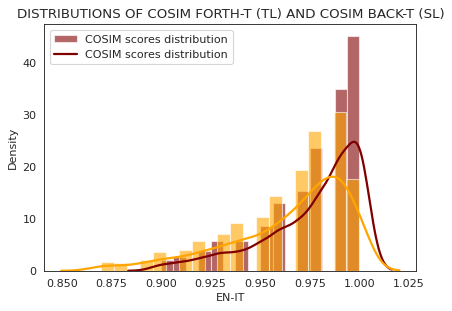

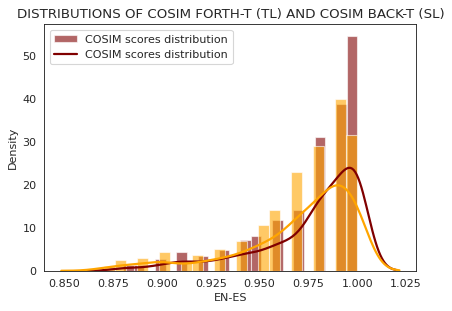

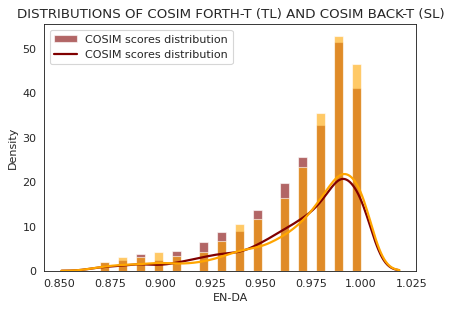

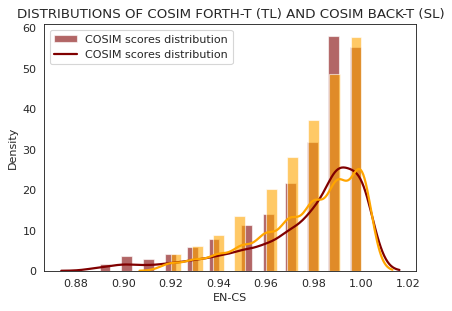

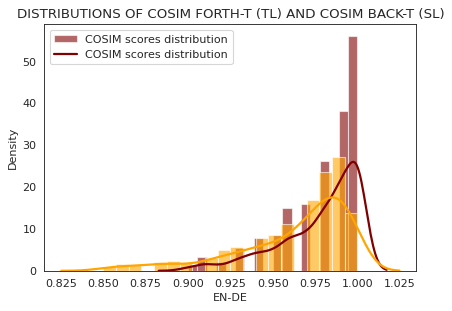

...

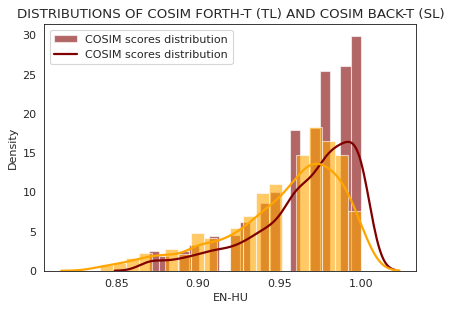

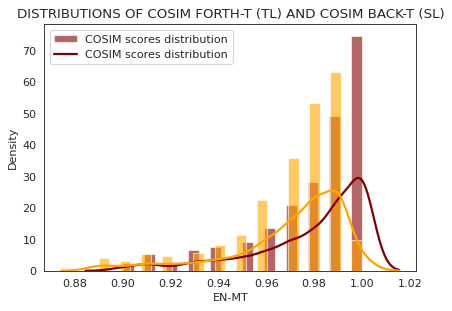

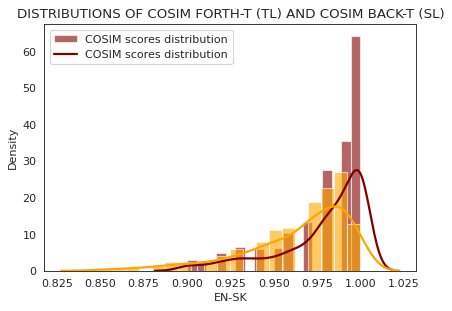

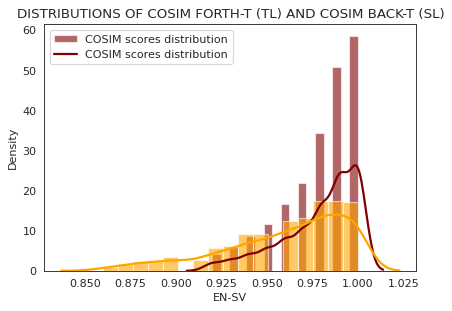

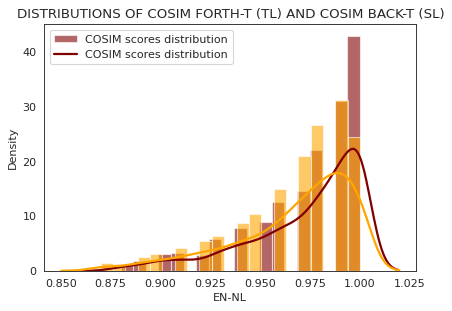

In [ ]:
import seaborn as sns
sns.set_style("white")


# figure, axis = plt.subplots(2, 2)

for i, (bleu_, cosim ) in enumerate(zip(cosim_back, cosim_direct)):
  x1 = cosim_back[i][1]
  x2 = cosim_direct[i][1]
  lang_id = bleu_back[i][0]

  # Plot

  kwargs = dict(hist_kws={'alpha':.6}, kde_kws={'linewidth':2})

  plt.figure(figsize=(6,4), dpi= 80)
  sns.distplot(x1, color="maroon", label="Compact", **kwargs)
  sns.distplot(x2, color="orange", label="SUV", **kwargs)
  plt.title("DISTRIBUTIONS OF COSIM FORTH-T (TL) AND COSIM BACK-T (SL)")
  plt.legend(["COSIM scores distribution", "COSIM scores distribution"])
  plt.xlabel(lang_id)

In [ ]:
type(data_group1[1])

list

In [ ]:
from statsmodels.stats.weightstats import ttest_ind
import numpy as np
import pingouin as pg
t_test = []
for i, (bleu_, cosim ) in enumerate(zip(cosim_back, cosim_direct)):
  cos_back = cosim_back[i][1]
  cos_direct = cosim_direct[i][1]
  lang_id = bleu_back[i][0]

  data_group1 = np.array(cos_back)
  data_group2 = np.array(cos_direct)

  result = pg.ttest(data_group1,
                   data_group2,
                   correction=True)
  
  t_test.append((lang_id, result))



In [ ]:
t_test

[('EN-IT',
                  T          dof alternative         p-val         CI95%  \
  T-test  12.805577  3520.596378   two-sided  9.948975e-37  [0.01, 0.01]   
  
           cohen-d       BF10  power  
  T-test  0.422877  1.919e+33    1.0  ),
 ('EN-ES',
                 T          dof alternative         p-val        CI95%  \
  T-test  5.142141  2322.195564   two-sided  2.943314e-07  [0.0, 0.01]   
  
           cohen-d       BF10     power  
  T-test  0.212511  2.199e+04  0.999264  ),
 ('EN-DA',
                T          dof alternative     p-val        CI95%   cohen-d  \
  T-test -1.81275  4589.590286   two-sided  0.069936  [-0.0, 0.0]  0.053502   
  
           BF10     power  
  T-test  0.171  0.441413  ),
 ('EN-CS',
                 T         dof alternative     p-val         CI95%   cohen-d  \
  T-test -2.038152  4304.55913   two-sided  0.041596  [-0.0, -0.0]  0.060942   
  
           BF10     power  
  T-test  0.267  0.531019  ),
 ('EN-DE',
                  T          dof 

In [ ]:
from statsmodels.stats.weightstats import ttest_ind
import numpy as np
import pingouin as pg
import scipy.stats as stats
t_test = []
for i, (bleu_, cosim ) in enumerate(zip(cosim_back, cosim_direct)):
  cos_back = cosim_back[i][1]
  cos_direct = cosim_direct[i][1]
  lang_id = bleu_back[i][0]

  data_group1 = np.array(cos_back)
  data_group2 = np.array(cos_direct)

  result = stats.ttest_ind(a=data_group1, b=data_group2, equal_var=True)

  
  t_test.append((lang_id, result))



In [ ]:
t_test

[('EN-IT',
  Ttest_indResult(statistic=12.80557692640282, pvalue=9.255677624486919e-37)),
 ('EN-ES',
  Ttest_indResult(statistic=5.142140622198867, pvalue=2.9415295962260274e-07)),
 ('EN-DA',
  Ttest_indResult(statistic=-1.8127498574967666, pvalue=0.06993571113602237)),
 ('EN-CS',
  Ttest_indResult(statistic=-2.038151838870707, pvalue=0.04159346895629973)),
 ('EN-DE',
  Ttest_indResult(statistic=12.775362085835194, pvalue=3.648700117917602e-36)),
 ('EN-FI',
  Ttest_indResult(statistic=-0.3364115097690698, pvalue=0.7365794345716524)),
 ('EN-ET',
  Ttest_indResult(statistic=5.037887779551959, pvalue=4.93049095632151e-07)),
 ('EN-GA',
  Ttest_indResult(statistic=-2.249936577455662, pvalue=0.02451373610919701)),
 ('EN-FR',
  Ttest_indResult(statistic=20.354695080870346, pvalue=3.020584548429934e-87)),
 ('EN-HU',
  Ttest_indResult(statistic=12.447825721192636, pvalue=6.862062055480389e-35)),
 ('EN-MT',
  Ttest_indResult(statistic=12.782502360725319, pvalue=8.778663234661246e-37)),
 ('EN-SK'

**BLEU VS BLEU**

<ipython-input-64-f196b4f72183>:17: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


<ipython-input-64-f196b4f72183>:18: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


<ipython-input-64-f196b4f72183>:17: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use

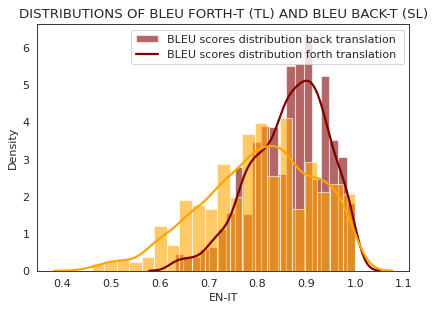

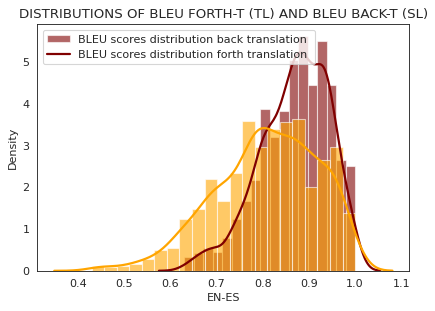

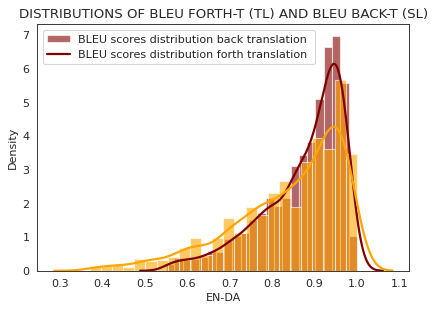

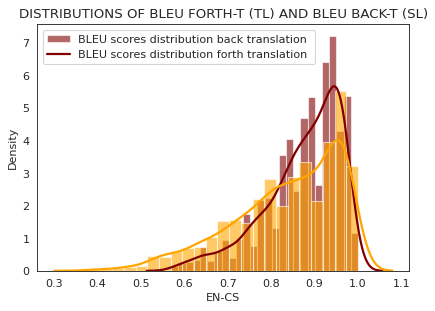

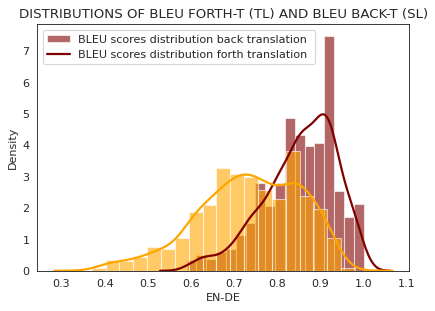

...

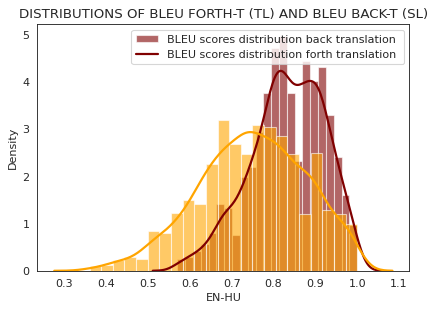

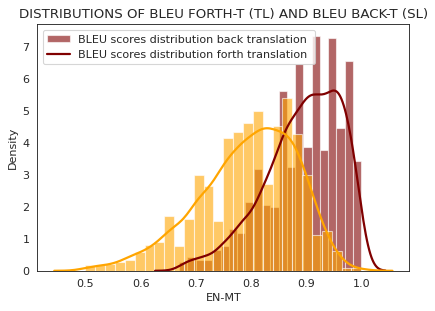

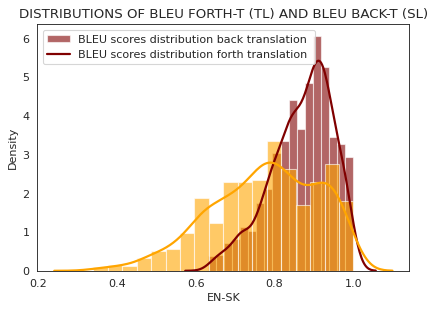

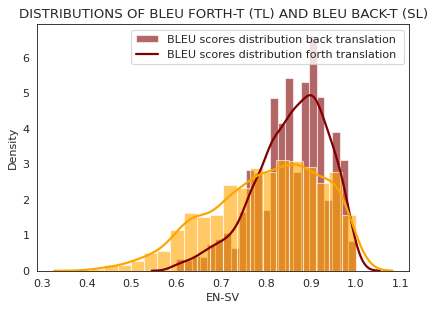

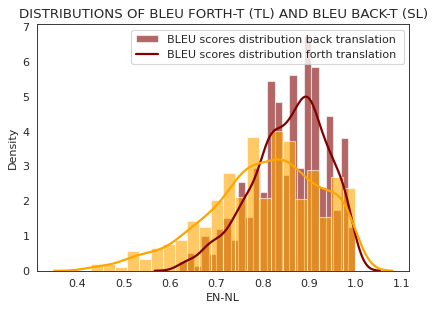

In [ ]:
import seaborn as sns
sns.set_style("white")


# figure, axis = plt.subplots(2, 2)

for i, (bleu_, cosim ) in enumerate(zip(bleu_back, bleu_direct)):
  bl_back = bleu_back[i][1]
  bl_direct = bleu_direct[i][1]
  lang_id = bleu_back[i][0]

    # Plot

  kwargs = dict(hist_kws={'alpha':.6}, kde_kws={'linewidth':2})

  plt.figure(figsize=(6,4), dpi= 80)
  sns.distplot(bl_back, color="maroon", label="Compact", **kwargs) #dodgerblue
  sns.distplot(bl_direct, color="orange", label="SUV", **kwargs)
  plt.title("DISTRIBUTIONS OF BLEU FORTH-T (TL) AND BLEU BACK-T (SL)")
  plt.legend(["BLEU scores distribution back translation ", "BLEU scores distribution forth translation"])
  plt.xlabel(lang_id)

In [ ]:
t_test = []
for i, (bleu_, cosim ) in enumerate(zip(bleu_back, bleu_direct)):
  bl_back = bleu_back[i][1]
  bl_direct = bleu_direct[i][1]
  lang_id = bleu_back[i][0]

  data_group1 = np.array(bl_back)
  data_group2 = np.array(bl_direct)

  result = pg.ttest(data_group1,
                   data_group2,
                   correction=True)
  
  t_test.append((lang_id, result))

/usr/local/lib/python3.8/dist-packages/pingouin/bayesian.py:152: RuntimeWarning: divide by zero encountered in double_scalars
  bf10 = 1 / ((1 + t**2 / df) ** (-(df + 1) / 2) / integr)


In [ ]:
t_test

[('EN-IT',
                  T          dof alternative         p-val         CI95%  \
  T-test  18.922787  3224.684916   two-sided  8.205355e-76  [0.05, 0.07]   
  
           cohen-d       BF10  power  
  T-test  0.624885  3.379e+72    1.0  ),
 ('EN-ES',
                  T          dof alternative         p-val         CI95%  \
  T-test  15.445462  2049.495398   two-sided  5.391805e-51  [0.05, 0.07]   
  
           cohen-d       BF10  power  
  T-test  0.638319  5.765e+47    1.0  ),
 ('EN-DA',
                  T          dof alternative         p-val         CI95%  \
  T-test  10.507881  4201.049421   two-sided  1.642181e-25  [0.03, 0.04]   
  
          cohen-d       BF10  power  
  T-test  0.31013  1.392e+22    1.0  ),
 ('EN-CS',
                  T          dof alternative         p-val         CI95%  \
  T-test  11.809411  4030.970523   two-sided  1.154192e-31  [0.03, 0.04]   
  
          cohen-d       BF10  power  
  T-test  0.35311  1.816e+28    1.0  ),
 ('EN-DE',
         

In [ ]:
t_test = []
for i, (bleu_, cosim ) in enumerate(zip(bleu_back, bleu_direct)):
  bl_back = bleu_back[i][1]
  bl_direct = bleu_direct[i][1]
  lang_id = bleu_back[i][0]

  data_group1 = np.array(bl_back)
  data_group2 = np.array(bl_direct)

  result = stats.ttest_ind(a=data_group1, b=data_group2, equal_var=True)
  
  t_test.append((lang_id, result))

In [ ]:
t_test

[('EN-IT',
  Ttest_indResult(statistic=18.92278681547507, pvalue=2.860616760378624e-76)),
 ('EN-ES',
  Ttest_indResult(statistic=15.44546244699776, pvalue=2.5298739810824673e-51)),
 ('EN-DA',
  Ttest_indResult(statistic=10.507881181951793, pvalue=1.545691045308386e-25)),
 ('EN-CS',
  Ttest_indResult(statistic=11.809411281982223, pvalue=1.0282134583238496e-31)),
 ('EN-DE',
  Ttest_indResult(statistic=27.56763212189833, pvalue=6.884044393179991e-145)),
 ('EN-FI',
  Ttest_indResult(statistic=13.85639528823424, pvalue=1.2913885608616702e-42)),
 ('EN-ET',
  Ttest_indResult(statistic=12.94915454811176, pvalue=1.5179046921979267e-37)),
 ('EN-GA',
  Ttest_indResult(statistic=12.753734224649422, pvalue=1.840534793835373e-36)),
 ('EN-FR',
  Ttest_indResult(statistic=17.32138485857482, pvalue=1.2952598163392606e-64)),
 ('EN-HU',
  Ttest_indResult(statistic=23.575125159379215, pvalue=8.869733825979381e-115)),
 ('EN-MT', Ttest_indResult(statistic=42.6137168503293, pvalue=0.0)),
 ('EN-SK',
  Ttest_i

**COSIM VS. BLEU**

<ipython-input-65-96778d1354a7>:17: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


<ipython-input-65-96778d1354a7>:18: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


<ipython-input-65-96778d1354a7>:17: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use

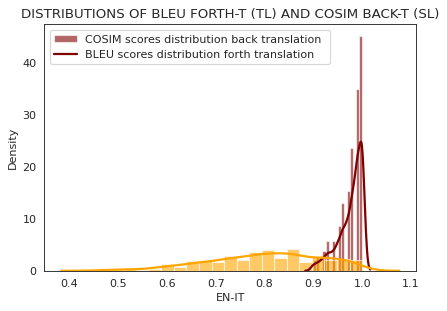

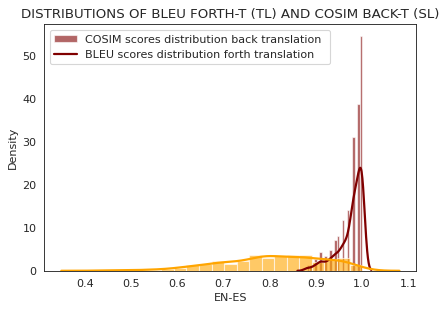

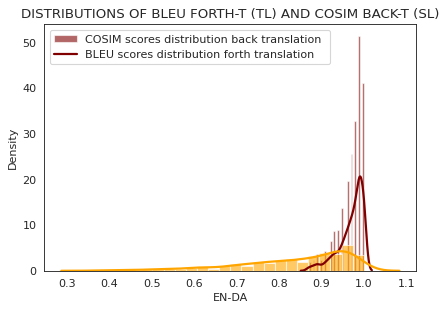

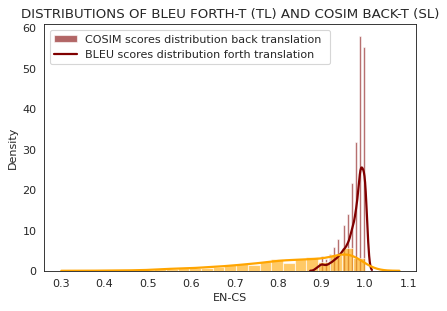

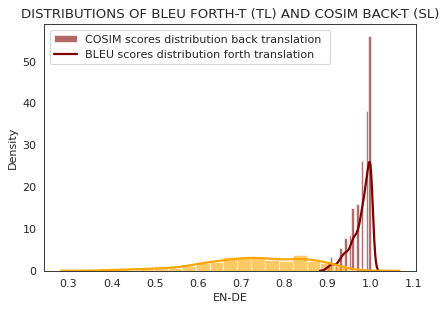

...

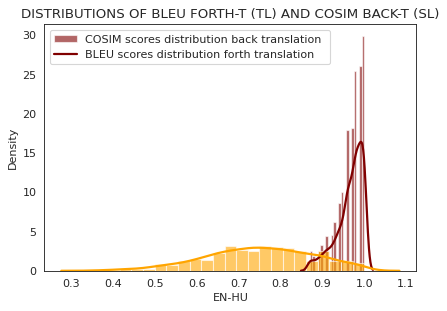

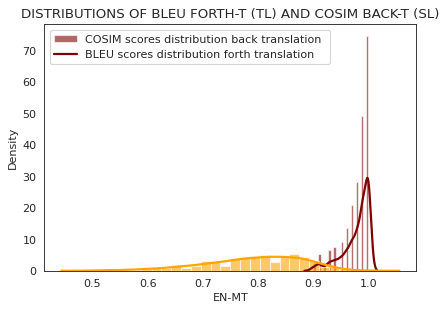

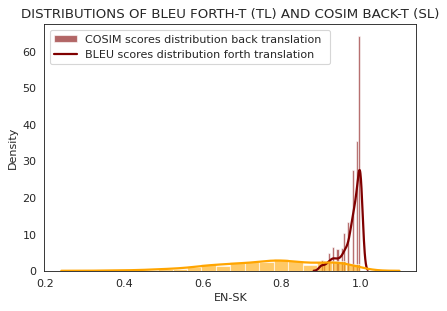

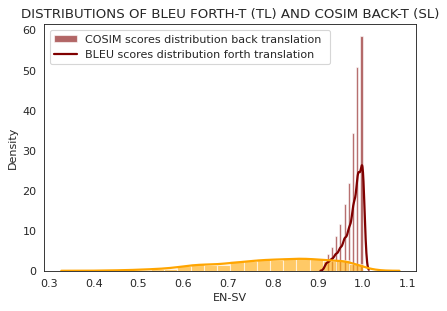

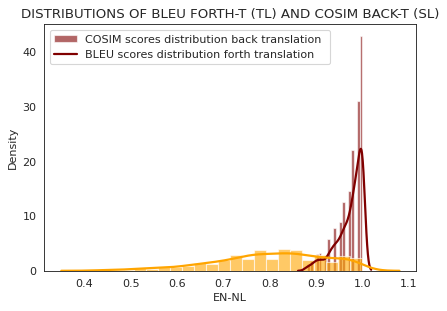

In [ ]:
import seaborn as sns
sns.set_style("white")


# figure, axis = plt.subplots(2, 2)

for i, (bleu_, cosim ) in enumerate(zip(cosim_back, bleu_direct)):
  cos_back = cosim_back[i][1]
  bl_direct = bleu_direct[i][1]
  lang_id = bleu_direct[i][0]

    # Plot

  kwargs = dict(hist_kws={'alpha':.6}, kde_kws={'linewidth':2})

  plt.figure(figsize=(6,4), dpi= 80)
  sns.distplot(cos_back, color="maroon", label="Compact", **kwargs) #dodgerblue
  sns.distplot(bl_direct, color="orange", label="SUV", **kwargs)
  plt.title("DISTRIBUTIONS OF BLEU FORTH-T (TL) AND COSIM BACK-T (SL)")
  plt.legend(["COSIM scores distribution back translation ", "BLEU scores distribution forth translation"])
  plt.xlabel(lang_id)

In [ ]:
t_test = []
for i, (bleu_, cosim ) in enumerate(zip(cosim_back, bleu_direct)):
  cos_back = cosim_back[i][1]
  bl_direct = bleu_direct[i][1]
  lang_id = bleu_back[i][0]

  data_group1 = np.array(cos_back)
  data_group2 = np.array(bl_direct)

  result = stats.ttest_ind(a=data_group1, b=data_group2, equal_var=True)
  
  t_test.append((lang_id, result))

In [ ]:
t_test

[('EN-IT', Ttest_indResult(statistic=63.51727262629807, pvalue=0.0)),
 ('EN-ES', Ttest_indResult(statistic=50.449946807381366, pvalue=0.0)),
 ('EN-DA', Ttest_indResult(statistic=46.944514403535166, pvalue=0.0)),
 ('EN-CS', Ttest_indResult(statistic=52.75279692264924, pvalue=0.0)),
 ('EN-DE', Ttest_indResult(statistic=68.39978957140426, pvalue=0.0)),
 ('EN-FI', Ttest_indResult(statistic=62.695870422342246, pvalue=0.0)),
 ('EN-ET', Ttest_indResult(statistic=57.938483607621855, pvalue=0.0)),
 ('EN-GA', Ttest_indResult(statistic=51.29086041163414, pvalue=0.0)),
 ('EN-FR', Ttest_indResult(statistic=62.59743651528604, pvalue=0.0)),
 ('EN-HU', Ttest_indResult(statistic=72.30048437828255, pvalue=0.0)),
 ('EN-MT', Ttest_indResult(statistic=96.14425290892483, pvalue=0.0)),
 ('EN-SK', Ttest_indResult(statistic=50.58835308261438, pvalue=0.0)),
 ('EN-SV', Ttest_indResult(statistic=60.820771057039956, pvalue=0.0)),
 ('EN-NL', Ttest_indResult(statistic=59.85074075650788, pvalue=0.0))]

# **Wilcoxon Signed-Rank Test**

**cosim bleu**

In [ ]:
import numpy as np
import scipy.stats as stats
w_test = []
for i, (bleu_, cosim ) in enumerate(zip(cosim_back, bleu_direct)):
  cos_back = cosim_back[i][1]
  bl_direct = bleu_direct[i][1]
  lang_id = bleu_back[i][0]

  data_group1 = np.array(cos_back)
  data_group2 = np.array(bl_direct)

  result = stats.wilcoxon(data_group1, data_group2)
  
  w_test.append((lang_id, result))

w_test

[('EN-IT', WilcoxonResult(statistic=2995.5, pvalue=1.2422784860921478e-295)),
 ('EN-ES', WilcoxonResult(statistic=1303.0, pvalue=2.1153160019672752e-187)),
 ('EN-DA', WilcoxonResult(statistic=78799.5, pvalue=0.0)),
 ('EN-CS', WilcoxonResult(statistic=20611.0, pvalue=0.0)),
 ('EN-DE', WilcoxonResult(statistic=15.5, pvalue=1.1912294658975688e-190)),
 ('EN-FI', WilcoxonResult(statistic=3339.5, pvalue=3.840860650724138e-300)),
 ('EN-ET', WilcoxonResult(statistic=9044.5, pvalue=2.6220431275362406e-294)),
 ('EN-GA', WilcoxonResult(statistic=9936.5, pvalue=1.0458115974815932e-277)),
 ('EN-FR', WilcoxonResult(statistic=2972.0, pvalue=6.359763216231316e-289)),
 ('EN-HU', WilcoxonResult(statistic=3235.0, pvalue=2.747211352445658e-306)),
 ('EN-MT', WilcoxonResult(statistic=196.0, pvalue=0.0)),
 ('EN-SK', WilcoxonResult(statistic=743.0, pvalue=1.1543544559637165e-189)),
 ('EN-SV', WilcoxonResult(statistic=2049.0, pvalue=8.351400367554021e-287)),
 ('EN-NL', WilcoxonResult(statistic=9715.5, pvalue=5

**cosim cosim**

In [ ]:
w_test = []
for i, (bleu_, cosim ) in enumerate(zip(cosim_back, cosim_direct)):
  cos_back = cosim_back[i][1]
  cos_direct = cosim_direct[i][1]
  lang_id = bleu_back[i][0]

  data_group1 = np.array(cos_back)
  data_group2 = np.array(cos_direct)

  result = stats.wilcoxon(data_group1, data_group2)
  
  w_test.append((lang_id, result))

w_test

[('EN-IT', WilcoxonResult(statistic=336277.0, pvalue=3.392244925509512e-41)),
 ('EN-ES', WilcoxonResult(statistic=163724.0, pvalue=6.234313923834304e-09)),
 ('EN-DA', WilcoxonResult(statistic=764067.0, pvalue=0.008813097908095646)),
 ('EN-CS', WilcoxonResult(statistic=691659.0, pvalue=0.2886614025380855)),
 ('EN-DE', WilcoxonResult(statistic=129419.0, pvalue=6.80697519114447e-39)),
 ('EN-FI', WilcoxonResult(statistic=593122.0, pvalue=0.6216003935595895)),
 ('EN-ET', WilcoxonResult(statistic=478147.0, pvalue=1.573920567183223e-10)),
 ('EN-GA', WilcoxonResult(statistic=413483.0, pvalue=0.7542164849925855)),
 ('EN-FR', WilcoxonResult(statistic=225898.5, pvalue=2.989444277315727e-91)),
 ('EN-HU', WilcoxonResult(statistic=425427.5, pvalue=4.210948677807511e-43)),
 ('EN-MT', WilcoxonResult(statistic=594197.5, pvalue=5.426708875773371e-44)),
 ('EN-SK', WilcoxonResult(statistic=118327.5, pvalue=1.6358882981402498e-42)),
 ('EN-SV', WilcoxonResult(statistic=203185.5, pvalue=7.005943876277554e-92

In [ ]:
w_test = []
for i, (bleu_, cosim ) in enumerate(zip(cosim_back, cosim_direct)):
  cos_back = cosim_back[i][1]
  cos_direct = cosim_direct[i][1]
  lang_id = bleu_back[i][0]

  data_group1 = np.array(cos_back)
  data_group2 = np.array(cos_direct)

  result = stats.mannwhitneyu(data_group1, data_group2, alternative='two-sided')
  
  w_test.append((lang_id, result))

w_test

[('EN-IT',
  MannwhitneyuResult(statistic=2101962.0, pvalue=4.018337924897271e-40)),
 ('EN-ES',
  MannwhitneyuResult(statistic=787504.5, pvalue=2.5710886540270664e-10)),
 ('EN-DA',
  MannwhitneyuResult(statistic=2520450.0, pvalue=0.009261745346011983)),
 ('EN-CS', MannwhitneyuResult(statistic=2528849.0, pvalue=0.5278990909303629)),
 ('EN-DE',
  MannwhitneyuResult(statistic=870978.5, pvalue=5.622862694962333e-37)),
 ('EN-FI',
  MannwhitneyuResult(statistic=1831337.5, pvalue=0.015755239535232356)),
 ('EN-ET',
  MannwhitneyuResult(statistic=1984130.5, pvalue=2.085123322130485e-14)),
 ('EN-GA',
  MannwhitneyuResult(statistic=1722261.5, pvalue=8.42160252482658e-06)),
 ('EN-FR',
  MannwhitneyuResult(statistic=2160671.0, pvalue=8.965159243381509e-73)),
 ('EN-HU',
  MannwhitneyuResult(statistic=2236567.5, pvalue=4.975147473493974e-40)),
 ('EN-MT',
  MannwhitneyuResult(statistic=3364031.0, pvalue=2.206000198882788e-72)),
 ('EN-SK',
  MannwhitneyuResult(statistic=922623.5, pvalue=3.5414055798416

**bleu bleu**

In [ ]:
w_test = []
for i, (bleu_, cosim ) in enumerate(zip(bleu_back, bleu_direct)):
  bl_back = bleu_back[i][1]
  bl_direct = bleu_direct[i][1]
  lang_id = bleu_back[i][0]

  data_group1 = np.array(bl_back)
  data_group2 = np.array(bl_direct)

  result = stats.wilcoxon(data_group1, data_group2)
  
  w_test.append((lang_id, result))

w_test

[('EN-IT', WilcoxonResult(statistic=359943.0, pvalue=3.884756714305347e-84)),
 ('EN-ES', WilcoxonResult(statistic=140242.0, pvalue=1.2584440794510176e-56)),
 ('EN-DA', WilcoxonResult(statistic=783238.0, pvalue=3.1690176995853504e-33)),
 ('EN-CS', WilcoxonResult(statistic=697113.5, pvalue=1.0994806966748727e-42)),
 ('EN-DE', WilcoxonResult(statistic=47920.0, pvalue=2.914549620177489e-134)),
 ('EN-FI', WilcoxonResult(statistic=466163.5, pvalue=2.973597670491511e-53)),
 ('EN-ET', WilcoxonResult(statistic=480992.5, pvalue=8.291743296139138e-47)),
 ('EN-GA', WilcoxonResult(statistic=338040.0, pvalue=4.8931697173524576e-55)),
 ('EN-FR', WilcoxonResult(statistic=372511.0, pvalue=1.9666721971695738e-72)),
 ('EN-HU', WilcoxonResult(statistic=291984.0, pvalue=3.1590776392201242e-127)),
 ('EN-MT', WilcoxonResult(statistic=169194.5, pvalue=3.4119461380140007e-273)),
 ('EN-SK', WilcoxonResult(statistic=98577.0, pvalue=1.9320524152228286e-88)),
 ('EN-SV', WilcoxonResult(statistic=382648.5, pvalue=1.

In [ ]:
w_test = []
for i, (bleu_, cosim ) in enumerate(zip(bleu_back, bleu_direct)):
  bl_back = bleu_back[i][1]
  bl_direct = bleu_direct[i][1]
  lang_id = bleu_back[i][0]

  data_group1 = np.array(bl_back)
  data_group2 = np.array(bl_direct)

  result = result = stats.mannwhitneyu(data_group1, data_group2, alternative='two-sided')
  w_test.append((lang_id, result))

w_test

[('EN-IT',
  MannwhitneyuResult(statistic=2211118.5, pvalue=2.8807757985259916e-61)),
 ('EN-ES',
  MannwhitneyuResult(statistic=907154.0, pvalue=8.307789128044349e-42)),
 ('EN-DA',
  MannwhitneyuResult(statistic=2973178.5, pvalue=5.6344074958897773e-14)),
 ('EN-CS',
  MannwhitneyuResult(statistic=2866498.0, pvalue=3.135985521912385e-17)),
 ('EN-DE',
  MannwhitneyuResult(statistic=1056187.0, pvalue=3.753357770218148e-128)),
 ('EN-FI',
  MannwhitneyuResult(statistic=2159119.0, pvalue=8.062388146208596e-35)),
 ('EN-ET',
  MannwhitneyuResult(statistic=2097586.5, pvalue=2.545718490443138e-28)),
 ('EN-GA',
  MannwhitneyuResult(statistic=1987193.0, pvalue=2.438090603969639e-38)),
 ('EN-FR',
  MannwhitneyuResult(statistic=2080857.5, pvalue=1.027189391512852e-52)),
 ('EN-HU',
  MannwhitneyuResult(statistic=2507677.5, pvalue=5.676946758915913e-100)),
 ('EN-MT',
  MannwhitneyuResult(statistic=4220313.0, pvalue=3.2486964136326984e-301)),
 ('EN-SK',
  MannwhitneyuResult(statistic=971302.0, pvalue=1

**there is a significant difference between the medians OF TL AND SL**

# **T-TEST MEAN SCORES** 

**Two sample t-test has the following hypothesis**

**H0 => µ1 = µ2 (population mean of dataset1 is equal to dataset2)**

**HA => µ1 ≠µ2 (population mean of dataset1 is different from dataset2)**

**COSIM BACK VS. BLEU DIRECT**

SignificanceResult(statistic=0.18681318681318684, pvalue=0.5225040123791591)


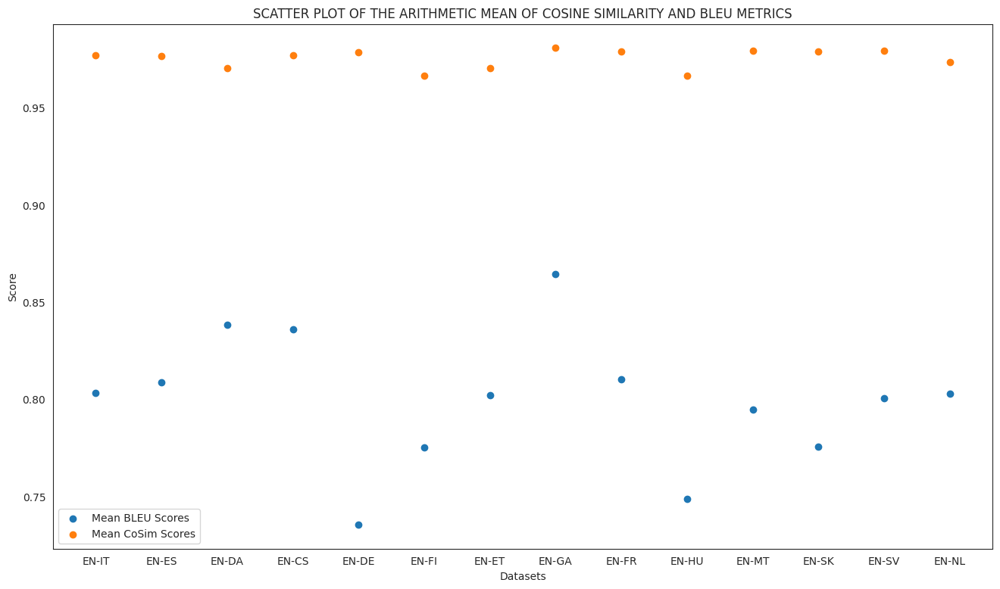

In [ ]:
#FIRST EXPERIMENT: ASSESS A CORRELATION BETWEEN COSIM COMPUTED BETWEEN SOURCE AND BACK-TRANSLATION ; AND BLEU COMPUTED BETWEEN REFERENCE AND M-TRANSLATED PAIRS
from scipy.stats import spearmanr

s = spearmanr([mean(x[1]) for x in bleu_direct ], [mean(x[1]) for x in cosim_back ], axis=None)
print(s)
from matplotlib import pyplot
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize = (16, 9))
pyplot.scatter([x[0] for x in bleu_direct ], [mean(x[1]) for x in bleu_direct ])
pyplot.scatter([x[0] for x in cosim_back ], [mean(x[1])  for x in cosim_back ])
# pyplot.scatter([x[0] for x in mean_scar_ranking], [x[1] for x in mean_scar_ranking])
plt.xlabel("Datasets")
plt.ylabel("Score")
plt.title('SCATTER PLOT OF THE ARITHMETIC MEAN OF COSINE SIMILARITY AND BLEU METRICS')
plt.legend(['Mean BLEU Scores', "Mean CoSim Scores"]) #, "scar bleu ranking"])
plt.show()

<ipython-input-77-4b70de1a1b9d>:17: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


<ipython-input-77-4b70de1a1b9d>:18: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




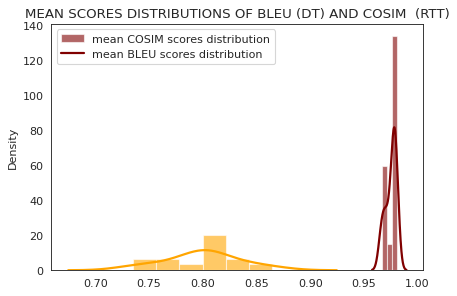

In [ ]:
import seaborn as sns
sns.set_style("white")


# figure, axis = plt.subplots(2, 2)

# for i, (bleu_, cosim ) in enumerate(zip(cosim_back, bleu_direct)):
mean_cosim_back = [mean(x[1]) for x in cosim_back ]
mean_bleu_direct = [mean(x[1]) for x in bleu_direct ]
# lang_id = bleu_back[i][0]

  # Plot

kwargs = dict(hist_kws={'alpha':.6}, kde_kws={'linewidth':2})

plt.figure(figsize=(6,4), dpi= 80)
sns.distplot(mean_cosim_back, color="maroon", label="Compact", **kwargs)
sns.distplot(mean_bleu_direct, color="orange", label="SUV", **kwargs)
plt.title("MEAN SCORES DISTRIBUTIONS OF BLEU (DT) AND COSIM  (RTT)")
plt.legend(["mean COSIM scores distribution", "mean BLEU scores distribution"])
# plt.xlabel(lang_id)

**Mann-Whitney U Test - WILXON**

In [ ]:
# Import library
import scipy.stats as stats
 
# Creating data groups
data_group1 = np.array(mean_cosim_back)
data_group2 = np.array(mean_bleu_direct)
 
# Print the variance of both data groups
# print(np.var(data_group1), np.var(data_group2))
manwhite = stats.mannwhitneyu(data_group1, data_group2, alternative='two-sided')
manwhite



MannwhitneyuResult(statistic=196.0, pvalue=7.4678435688707155e-06)

WilcoxonResult(statistic=0.0, pvalue=0.0001220703125)

**t-test**

In [ ]:
# Python program to display variance of data groups
 
# Import library
import scipy.stats as stats
 
# Creating data groups
data_group1 = np.array(mean_cosim_back)
data_group2 = np.array(mean_bleu_direct)
 
# Print the variance of both data groups
print(np.var(data_group1), np.var(data_group2))

stats.ttest_ind(a=data_group1, b=data_group2, equal_var=True)

2.298303292526209e-05 0.0010832893154643073


Ttest_indResult(statistic=19.037848913368485, pvalue=8.662893471331993e-17)

In [ ]:
# Perform the two sample t-test with equal variances
stats.ttest_ind(a=data_group1, b=data_group2, equal_var=True)

Ttest_indResult(statistic=19.03784891336848, pvalue=8.662893471332054e-17)

In [ ]:
from statsmodels.stats.weightstats import ttest_ind
import numpy as np
import pingouin as pg
 
# Conducting two-sample ttest
result = pg.ttest(data_group1,
                  data_group2,
                  correction=True)
 
# Print the result
print(result)

                T        dof alternative         p-val        CI95%   cohen-d  \
T-test  19.037849  13.551367   two-sided  3.599542e-11  [0.16, 0.2]  7.195631   

             BF10  power  
T-test  3.053e+13    1.0  


In [ ]:
ttest_ind(data_group1, data_group2)

(19.03784891336847, 8.662893471332115e-17, 26.0)

**BLEU-BACK VS. BLEU DIRECT**

In [ ]:
[mean(x[1]) for x in bleu_direct ]

[0.8032388222464558,
 0.8085738684884713,
 0.8380705574912892,
 0.8359991059454627,
 0.7352808988764045,
 0.7749626068376069,
 0.8020236178207193,
 0.8643297812675267,
 0.8101784718349135,
 0.7487170010559662,
 0.7944278169014084,
 0.7753498293515358,
 0.8005763850027979,
 0.802898241875333]

SignificanceResult(statistic=0.665934065934066, pvalue=0.00932299909684176)


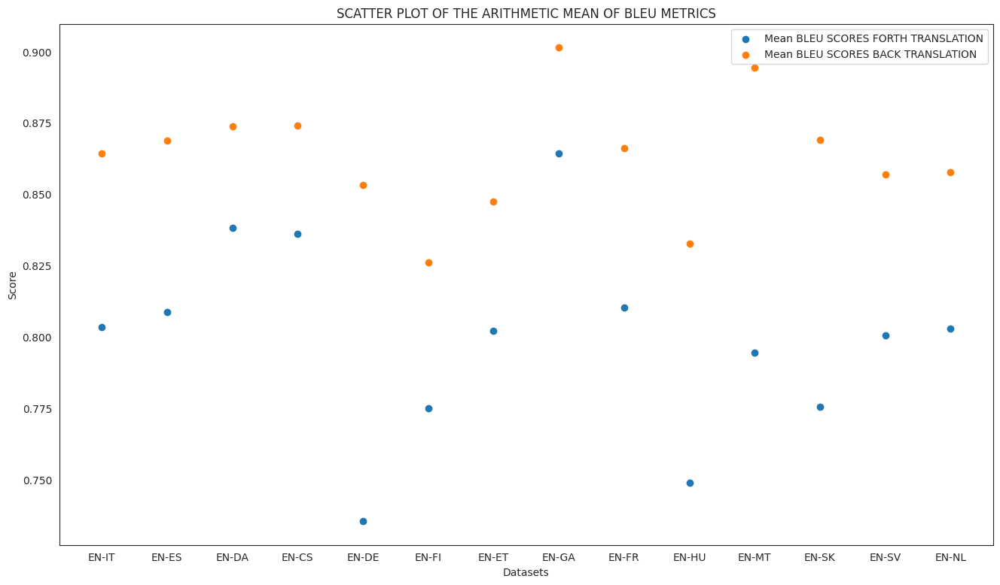

In [ ]:
#FIRST EXPERIMENT: ASSESS A CORRELATION BETWEEN COSIM COMPUTED BETWEEN SOURCE AND BACK-TRANSLATION ; AND BLEU COMPUTED BETWEEN REFERENCE AND M-TRANSLATED PAIRS
from scipy.stats import spearmanr

s = spearmanr([mean(x[1]) for x in bleu_direct ], [mean(x[1]) for x in bleu_back ], axis=None)
print(s)
from matplotlib import pyplot
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize = (16, 9))
pyplot.scatter([x[0] for x in bleu_direct ], [mean(x[1]) for x in bleu_direct ])
pyplot.scatter([x[0] for x in bleu_back], [mean(x[1])  for x in bleu_back])
# pyplot.scatter([x[0] for x in mean_scar_ranking], [x[1] for x in mean_scar_ranking])
plt.xlabel("Datasets")
plt.ylabel("Score")
plt.title('SCATTER PLOT OF THE ARITHMETIC MEAN OF BLEU METRICS')
plt.legend(['Mean BLEU SCORES FORTH TRANSLATION', "Mean BLEU SCORES BACK TRANSLATION"]) #, "scar bleu ranking"])
plt.show()

In [ ]:
import plotly.figure_factory as ff
import numpy as np

# Add histogram data
mean_bleu_back = [mean(x[1]) for x in bleu_back ]
mean_bleu_direct = [mean(x[1]) for x in bleu_direct ]

# Group data together
hist_data = [mean_bleu_back, mean_bleu_direct]

group_labels = [ "MEAN BLEU SCORES DISTRIBUTION (RTT)", "MEAN BLEU SCORES DISTRIBUTION(DT)"]

# Create distplot with custom bin_size
fig = ff.create_distplot(hist_data, group_labels, bin_size=.0)
fig.show()

**wilxon- manwhite**

In [ ]:
# Import library
import scipy.stats as stats
 
# Creating data groups
data_group1 = np.array(mean_bleu_back)
data_group2 = np.array(mean_bleu_direct)
 
# Print the variance of both data groups
# print(np.var(data_group1), np.var(data_group2))
manwhite = stats.mannwhitneyu(data_group1, data_group2, alternative='two-sided')
manwhite


# wilxon_result = stats.wilcoxon(data_group1, data_group2)
# wilxon_result


MannwhitneyuResult(statistic=185.0, pvalue=7.053487010253718e-05)

In [ ]:
wilxon_result = stats.wilcoxon(data_group1, data_group2)
wilxon_result

WilcoxonResult(statistic=0.0, pvalue=0.0001220703125)

**t-test**

In [ ]:
# Python program to display variance of data groups
 
# Import library
import scipy.stats as stats
 
# Creating data groups
data_group1 = np.array(mean_bleu_back)
data_group2 = np.array(mean_bleu_direct)
 
# Print the variance of both data groups
print(np.var(data_group1), np.var(data_group2))

stats.ttest_ind(a=data_group1, b=data_group2, equal_var=True)

0.0003898002758313512 0.0010832893154643073


Ttest_indResult(statistic=5.977521094229239, pvalue=2.6089388906298304e-06)

In [ ]:
from statsmodels.stats.weightstats import ttest_ind
import numpy as np
import pingouin as pg
 
# Conducting two-sample ttest
result = pg.ttest(data_group1,
                  data_group2,
                  correction=True)
 
# Print the result
result

,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,5.977521,21.283108,two-sided,0.000006,"[0.04, 0.09]",2.259291,4964.95,0.999923


In [ ]:
ttest_ind(data_group1, data_group2)

(5.977521094229228, 2.6089388906298926e-06, 26.0)

**COSIM DIRECT VS. COSIM BACK**

SignificanceResult(statistic=0.04175824175824176, pvalue=0.8872869731890637)


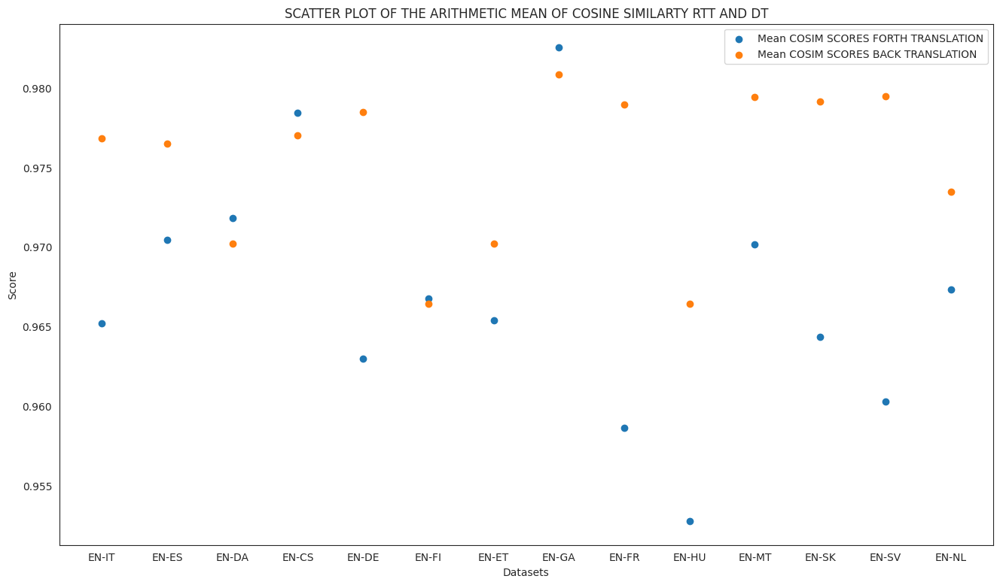

In [ ]:
#FIRST EXPERIMENT: ASSESS A CORRELATION BETWEEN COSIM COMPUTED BETWEEN SOURCE AND BACK-TRANSLATION ; AND BLEU COMPUTED BETWEEN REFERENCE AND M-TRANSLATED PAIRS
from scipy.stats import spearmanr

s = spearmanr([mean(x[1]) for x in cosim_direct ], [mean(x[1]) for x in cosim_back ], axis=None)
print(s)
from matplotlib import pyplot
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize = (16, 9))
pyplot.scatter([x[0] for x in cosim_direct ], [mean(x[1]) for x in cosim_direct ])
pyplot.scatter([x[0] for x in cosim_back], [mean(x[1])  for x in cosim_back])
# pyplot.scatter([x[0] for x in mean_scar_ranking], [x[1] for x in mean_scar_ranking])
plt.xlabel("Datasets")
plt.ylabel("Score")
plt.title('SCATTER PLOT OF THE ARITHMETIC MEAN OF COSINE SIMILARTY RTT AND DT')
plt.legend(['Mean COSIM SCORES FORTH TRANSLATION', "Mean COSIM SCORES BACK TRANSLATION"]) #, "scar bleu ranking"])
plt.show()

In [ ]:
import plotly.figure_factory as ff
import numpy as np

# Add histogram data
mean_cosim_back = [mean(x[1]) for x in cosim_back ]
mean_cosim_direct = [mean(x[1]) for x in cosim_direct ]

# Group data together
hist_data = [mean_cosim_back, mean_cosim_direct]

group_labels = [ "MEAN COSINE SIMILARITY SCORES DISTRIBUTION (RTT)", "MEAN COSINE SIMILARITY SCORES DISTRIBUTION (DT)"]

# Create distplot with custom bin_size
fig = ff.create_distplot(hist_data, group_labels, bin_size=-.0)
fig.show()

**manwhite wilxon**

In [ ]:
# Import library
import scipy.stats as stats
 
# Creating data groups
data_group1 = np.array(mean_cosim_back)
data_group2 = np.array(mean_cosim_direct)
 
# Print the variance of both data groups
# print(np.var(data_group1), np.var(data_group2))
manwhite = stats.mannwhitneyu(data_group1, data_group2, alternative='two-sided')
manwhite


MannwhitneyuResult(statistic=160.0, pvalue=0.004716530360235347)

In [ ]:
wilxon_result = stats.wilcoxon(data_group1, data_group2)
wilxon_result

WilcoxonResult(statistic=10.0, pvalue=0.0052490234375)

**t-test**

In [ ]:
# Python program to display variance of data groups
 
# Import library
import scipy.stats as stats
 
# Creating data groups
data_group1 = np.array(mean_cosim_back)
data_group2 = np.array(mean_cosim_direct)
 
# Print the variance of both data groups
print(np.var(data_group1), np.var(data_group2))

stats.ttest_ind(a=data_group1, b=data_group2, equal_var=True)

2.298303292526209e-05 5.4622031780775704e-05


Ttest_indResult(statistic=3.4059740183283918, pvalue=0.0021521151590089284)

In [ ]:
!pip install pingouin 

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 198.6/198.6 KB 4.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for littleutils: filename=littleutils-0.2.2-py3-none-any.whl size=7048 sha256=a7d6017a9acce58a380a44233cc3499a8ce19d3deaa15dddef84af920e5bf5bc
  Stored in directory: /root/.cache/pip/wheels/04/bb/0d/2d02ec45f29c48d6192476bfb59c5a0e64b605e7212374dd15
Successfully built littleutils


In [ ]:
from statsmodels.stats.weightstats import ttest_ind
import numpy as np
import pingouin as pg
 
# Conducting two-sample ttest
result = pg.ttest(data_group1,
                  data_group2,
                  correction=True)
 
# Print the result
result

,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.405974,22.294381,two-sided,0.002501,"[0.0, 0.01]",1.287337,16.678,0.906207


The p-value of the test comes out to be equal to 0.002, which is lower than the significance level alpha (that is, 0.05). This implies that we can say that the average cosine similarity of sentences in TL is statistically different from the average cosine similarity of sentences in TL. Also, the Cohen’s D that is obtained in a t-test is in terms of the relative strength.

In [ ]:
ttest_ind(data_group1, data_group2)

(3.4059740183283918, 0.0021521151590089284, 26.0)

This implies that the average cosine similarity between TL and SL is different